In [1]:
# IMPORT LIBRARIES
import missingno as msno
import numpy as np
from numpy import mean, std
from scipy.stats import pearsonr

import matplotlib.pyplot as plt
from matplotlib import style

import pandas as pd
import seaborn as sns

from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler

from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold


# Import the required libraries for the base learners and the meta-learner:
# for the base learners
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

# for the meta learner
from sklearn.linear_model import LogisticRegression, LassoLarsCV

from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import RandomForestClassifier

import xgboost as xgb
from xgboost import XGBClassifier

import lightgbm as lgb
from lightgbm import LGBMRegressor, LGBMClassifier, Booster

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, roc_curve, auc, mean_squared_error
from sklearn.metrics import precision_recall_curve, average_precision_score, r2_score, balanced_accuracy_score, recall_score
from sklearn.metrics import precision_score, f1_score, roc_auc_score, log_loss

from termcolor import colored as cl # text customization

%matplotlib inline

In [2]:
heart_df = pd.read_csv('heart.csv')

In [3]:
heart_df.shape

(918, 12)

In [4]:
heart_df.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [4]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [6]:
heart_df.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [5]:
distinctCounter = heart_df.apply(lambda x: len(x.unique()))

distinctCounter

Age                50
Sex                 2
ChestPainType       4
RestingBP          67
Cholesterol       222
FastingBS           2
RestingECG          3
MaxHR             119
ExerciseAngina      2
Oldpeak            53
ST_Slope            3
HeartDisease        2
dtype: int64

In [7]:
# The first copy of the original dataset

heart = heart_df.copy()

In [8]:
heart.shape

(918, 12)

In [9]:
heart.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [9]:
heart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


In [11]:
heart.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0


In [9]:
heart.isna().sum()

Age               0
Sex               0
ChestPainType     0
RestingBP         0
Cholesterol       0
FastingBS         0
RestingECG        0
MaxHR             0
ExerciseAngina    0
Oldpeak           0
ST_Slope          0
HeartDisease      0
dtype: int64

In [ ]:
'''
PK:

No null cells.

'''

<AxesSubplot:>

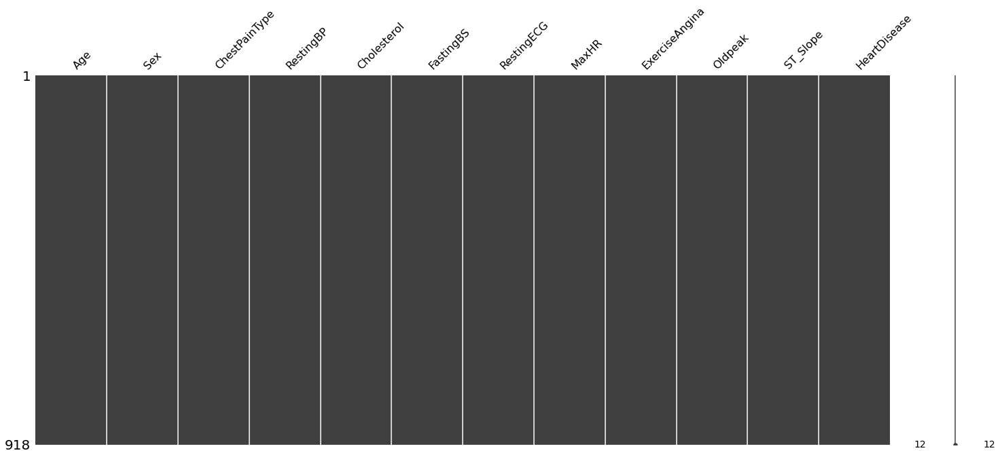

In [21]:
msno.matrix(heart)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_11048\1582521950.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr, dtype=np.bool)


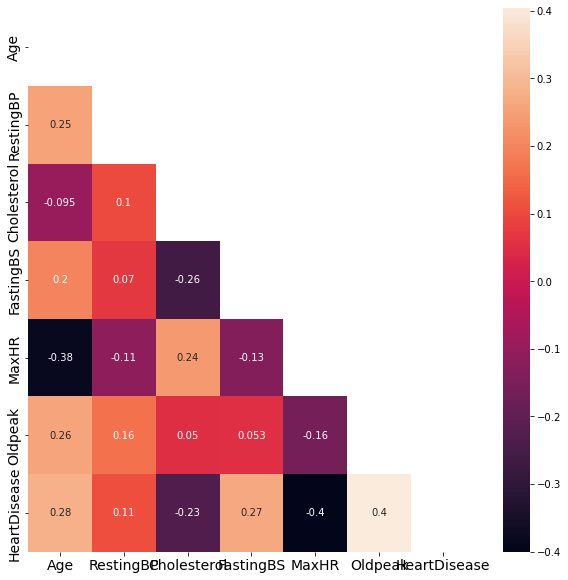

In [17]:
corr = heart.corr()

fig, ax = plt.subplots(figsize=(10,10))

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(corr, mask=mask, ax=ax, annot=True)

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

plt.show()

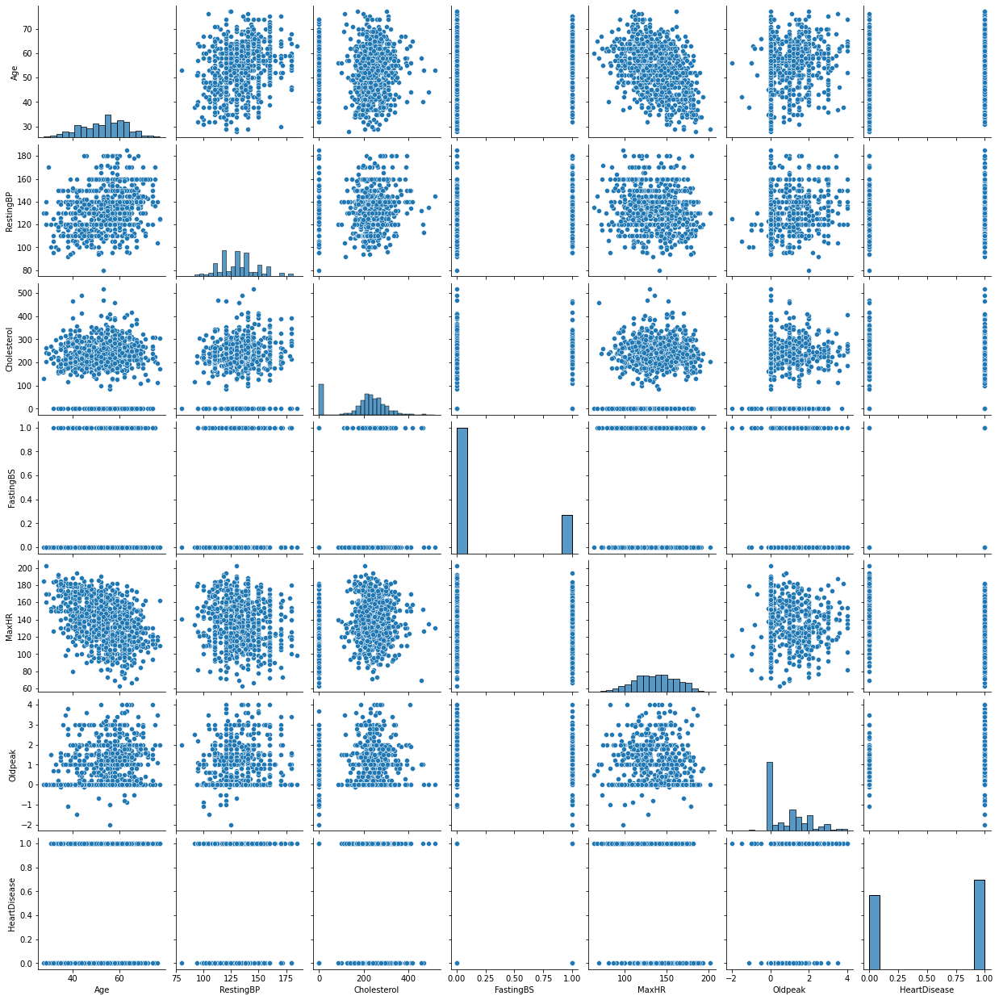

In [45]:
# visualise features in pairs
sns.pairplot(heart)

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'RestingBP'}>,
        <AxesSubplot:title={'center':'Cholesterol'}>],
       [<AxesSubplot:title={'center':'FastingBS'}>,
        <AxesSubplot:title={'center':'MaxHR'}>,
        <AxesSubplot:title={'center':'Oldpeak'}>],
       [<AxesSubplot:title={'center':'HeartDisease'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

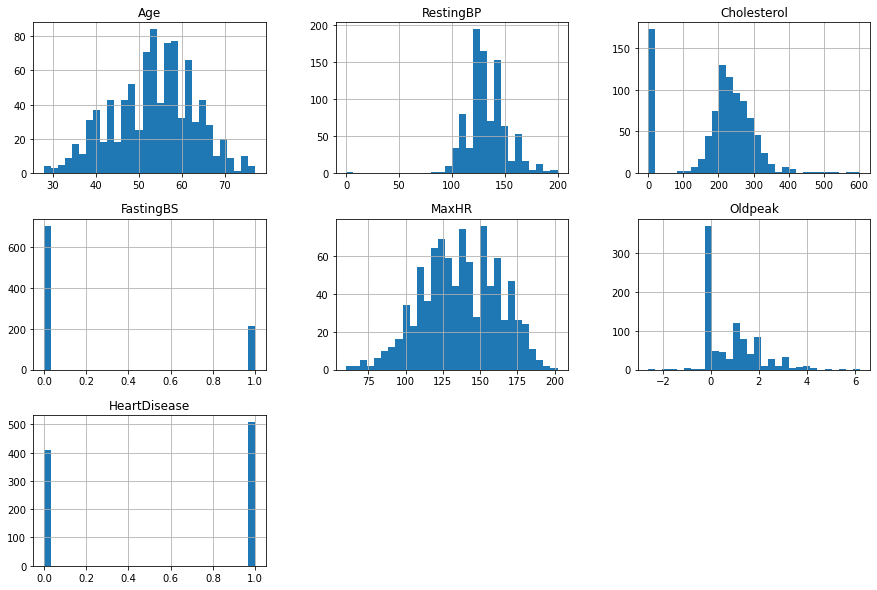

In [23]:
heart.hist(bins=30, figsize=(15, 10))

In [6]:
# Check for duplicates columns & features

print(f"Data shape: {heart.shape}")

# Remove Duplicate Rows
heart.drop_duplicates(inplace=True)

print(f"Data shape: {heart.shape}")

Data shape: (918, 12)
Data shape: (918, 12)


In [ ]:
'''
PK:

No duplicate rows.

'''

In [14]:
heart.eq(0).sum()

Age                 0
Sex                 0
ChestPainType       0
RestingBP           1
Cholesterol       172
FastingBS         704
RestingECG          0
MaxHR               0
ExerciseAngina      0
Oldpeak           368
ST_Slope            0
HeartDisease      410
dtype: int64

In [ ]:
'''
PK:

All these variables including RestingBP, Cholesterol, FastingBS, Oldpeak, and HeartDisease
can possibly have zero value(s).

'''

<AxesSubplot:>

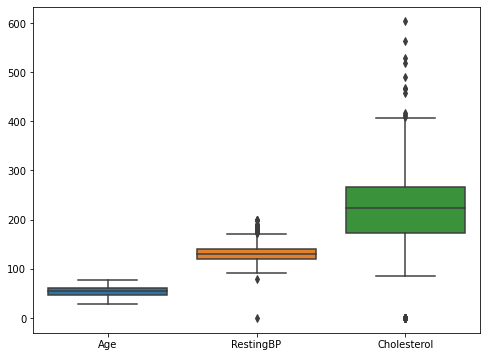

In [26]:
# Create boxplot
plt.figure(figsize=(8, 6))

sns.boxplot(data=heart[['Age','RestingBP', 'Cholesterol']])

In [10]:
def detect_outliers_zscore(data):
    outliers = []
    
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    
    print(mean, std)
    print()
    
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
            
    return outliers    # Driver code

In [7]:
sample_outliers = detect_outliers_zscore(heart.Age)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

53.510893246187365 9.427477516153491

Outliers from Z-scores method:  []



0

In [11]:
sample_outliers = detect_outliers_zscore(heart.RestingBP)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

132.39651416122004 18.504067410295104

Outliers from Z-scores method:  [190, 200, 200, 200, 0, 190, 200, 192]



8

In [12]:
for i in sample_outliers:
    heart.drop(heart.index[heart['RestingBP'] == i], inplace=True)

In [13]:
sample_outliers = detect_outliers_zscore(heart.Cholesterol)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

199.121978021978 109.0848014737662

Outliers from Z-scores method:  [529, 603, 564]



3

In [14]:
for i in sample_outliers:
    heart.drop(heart.index[heart['Cholesterol'] == i], inplace=True)

<AxesSubplot:>

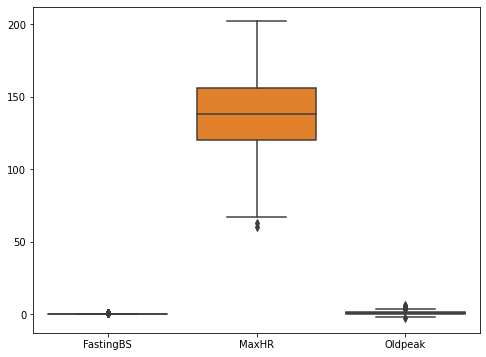

In [27]:
# Create boxplot
plt.figure(figsize=(8, 6))

sns.boxplot(data=heart[['FastingBS','MaxHR', 'Oldpeak']])

In [32]:
sample_outliers = detect_outliers_zscore(heart.FastingBS)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

0.23311546840958605 0.42281514494843314

Outliers from Z-scores method:  []



0

In [15]:
sample_outliers = detect_outliers_zscore(heart.MaxHR)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

136.80815876515987 25.382338085508028

Outliers from Z-scores method:  [60]



1

In [16]:
for i in sample_outliers:
    heart.drop(heart.index[heart['MaxHR'] == i], inplace=True)

In [17]:
sample_outliers = detect_outliers_zscore(heart.Oldpeak)

print("Outliers from Z-scores method: ", sample_outliers)
print()
len(sample_outliers) 

0.8846578366445917 1.0642374089530924

Outliers from Z-scores method:  [5.0, -2.6, 4.2, 5.6, 4.2, 6.2, 4.4]



7

In [18]:
for i in sample_outliers:
    heart.drop(heart.index[heart['Oldpeak'] == i], inplace=True)

In [ ]:
'''
PK:

There are 19 outliers in total.
Only 2% so remove them all.

'''

In [25]:
19/918

0.020697167755991286

In [26]:
918 - 19

899

In [19]:
heart.shape

(899, 12)

In [ ]:
'''
heart_df.shape (918, 12) is reduced to heart.shape (899, 12) 
removing 19 outliers fro the original dataset.

'''

In [34]:
from pandas_profiling import ProfileReport

In [35]:
prof = ProfileReport(heart)

In [36]:
prof

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
'''
PK:

The Profile Report shows the distinct number of observations is 899.

There is no missing cells(0.0%) and no duplicate rows(0.0%).

There are 5 numerical variables and they are Age, RestingBP, Cholesterol, MaxHR, and Oldpeak.

There are 4 categorical variables, Sex(2 distinct values), ChestPainType(4), RestingECG(3), and ST_Slope(3).

There are 3 Boolean variables, FastingBS(2 distinct values, 0 and 1), ExerciseAngina(2, N and Y), and HeartDisease(2, 0 and 1).
'''

In [37]:
print([column for column in heart.columns if heart[column].dtype == object])

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']


In [46]:
heart.ChestPainType.value_counts()

ASY    483
NAP    200
ATA    171
TA      45
Name: ChestPainType, dtype: int64

In [47]:
len(heart[heart.ChestPainType=='ASY'])

483

In [48]:
len(heart)

899

In [51]:
len(heart[heart.ChestPainType=='ASY'])/len(heart)

0.5372636262513905

Text(0.5, 1.0, 'Web Browser Marketshare - 2018')

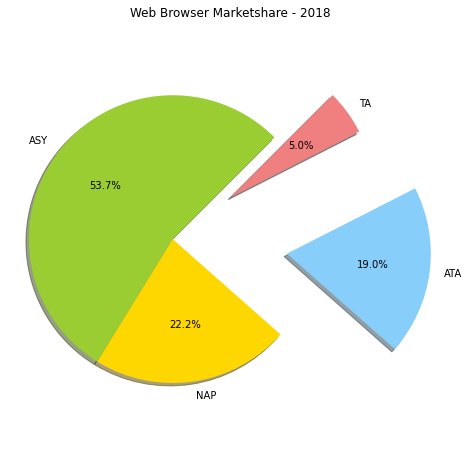

In [57]:
labels      = ["ASY", "NAP", "ATA", "TA"]

chestpain_type_share = [len(heart[heart.ChestPainType=='ASY'])/len(heart), len(heart[heart.ChestPainType=='NAP'])/len(heart),
                        len(heart[heart.ChestPainType=='ATA'])/len(heart), len(heart[heart.ChestPainType=='TA'])/len(heart)] 

explode     = (0, 0, 0.8, 0.5)

colors      = ['yellowgreen', 'gold', 'lightskyblue', 'lightcoral'] 

plt.figure(figsize = (8, 8))

plt.pie(chestpain_type_share,
        explode = explode,  # fraction of the radius with which to                              
                            # offset each wedge
        labels = labels,
        colors = colors,
        autopct="%.1f%%",   # string or function used to label the                              
                            # wedges with their numeric value         
        shadow=True,
        startangle=45)      # rotates the start of the pie chart by  

# angle degrees counterclockwise from the # x-axis
plt.axis("equal")           # turns off the axis lines and labels
plt.title("Web Browser Marketshare - 2018")
#plt.show()

In [68]:
heart.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,899.0,53.497219,9.456073,28.0,47.0,54.0,60.0,77.0
RestingBP,899.0,132.027809,17.120895,80.0,120.0,130.0,140.0,185.0
Cholesterol,899.0,198.005562,107.157779,0.0,174.5,222.0,266.0,518.0
FastingBS,899.0,0.232481,0.422649,0.0,0.0,0.0,0.0,1.0
MaxHR,899.0,136.917686,25.356740,63.0,120.0,138.0,156.0,202.0
Oldpeak,899.0,0.861513,1.007626,-2.0,0.0,0.5,1.5,4.0
HeartDisease,899.0,0.547275,0.498037,0.0,0.0,1.0,1.0,1.0


Text(0.5, 1.0, 'Male Female Distribution')

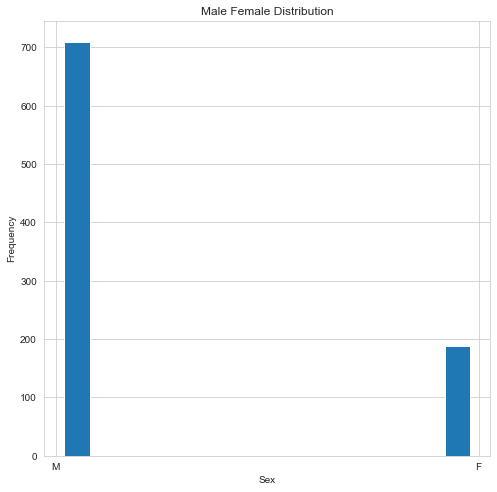

In [75]:
# Histogram plot

# Create the data
#employee_age = [21,28,32,34,35,35,37,42,47,55]

# Create bins for histogram
#bins = [20, 30, 40, 50, 60, 80]

plt.figure(figsize = (8, 8))

# Plot the histogram
#plt.hist(heart.Sex, bins, rwidth=0.6)
plt.hist(heart.Sex, rwidth=0.6)

# Add X Label on X-axis
plt.xlabel("Sex")

# Add X Label on X-axis
plt.ylabel("Frequency")

# Add title to graph
plt.title("Male Female Distribution")

# Show the plot
#plt.show()

Text(0.5, 1.0, 'Sex Age distribution')

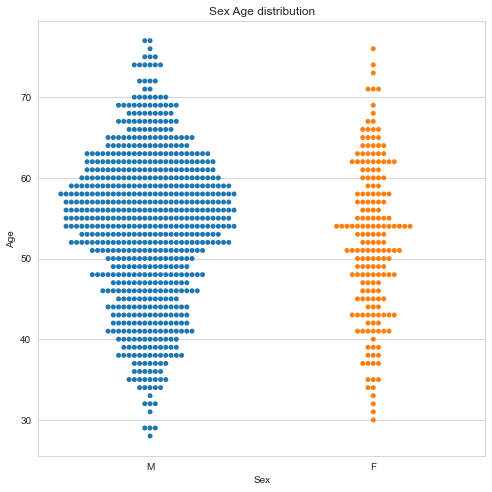

In [76]:
sns.set_style("whitegrid") 

#---load data---
#data = pd.read_csv('salary.csv') 

plt.figure(figsize = (8, 8))

#---plot the swarm plot---
sns.swarmplot(x="Sex", y="Age", data=heart) 

ax = plt.gca()
ax.set_title("Sex Age distribution") 

#---show plot---
#plt.show()

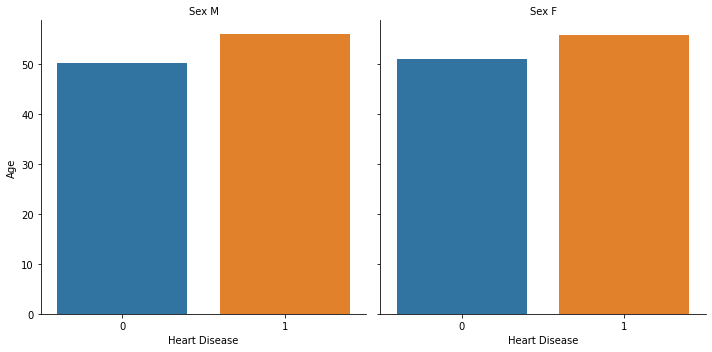

In [17]:
#---plot a factorplot---
g = sns.catplot(x="HeartDisease", y="Age", col="Sex",         
                data=heart, kind="bar", ci=None, aspect=1.0)

#---set the labels---
g.set_axis_labels("Heart Disease", "Age") 
g.set_xticklabels(["0", "1"])
g.set_titles("{col_var} {col_name}") #---show plot---

plt.show()

In [ ]:
# It was given that HeartDisease (target variable), output class = {1: 'heart disease', 0: 'Normal'}

In [ ]:
'''
PK:

The proportion for both sex is almost the same.

'''

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 1008x1008 with 0 Axes>

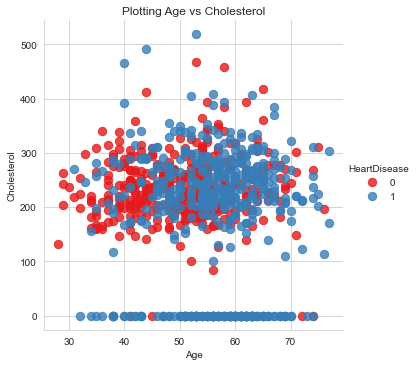

In [79]:
plt.figure(figsize = (14, 14))

sns.lmplot('Age', 'Cholesterol', data=heart,            
           hue='HeartDisease', palette='Set1',
           fit_reg=False, scatter_kws={"s": 70})

#---get the current polar axes on the current figure--- 
ax = plt.gca()
ax.set_title("Plotting Age vs Cholesterol") 

#---show the plot---
plt.show()

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 1296x1296 with 0 Axes>

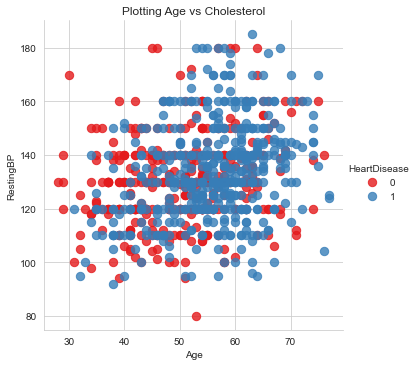

In [80]:
plt.figure(figsize = (18, 18))

sns.lmplot('Age', 'RestingBP', data=heart,            
           hue='HeartDisease', palette='Set1',
           fit_reg=False, scatter_kws={"s": 70})

#---get the current polar axes on the current figure--- 
ax = plt.gca()
ax.set_title("Plotting Age vs Cholesterol") 

#---show the plot---
plt.show()

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 1296x1296 with 0 Axes>

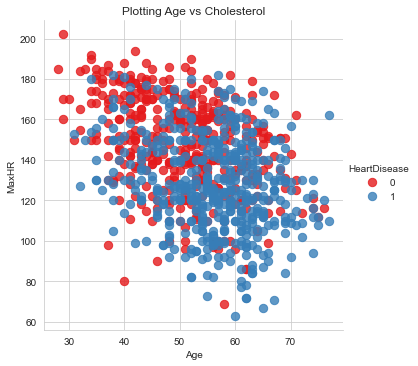

In [84]:
plt.figure(figsize = (18, 18))

sns.lmplot('Age', 'MaxHR', data=heart,            
           hue='HeartDisease', palette='Set1',
           fit_reg=False, scatter_kws={"s": 70})

#---get the current polar axes on the current figure--- 
ax = plt.gca()
ax.set_title("Plotting Age vs Cholesterol") 

#---show the plot---
plt.show()

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<Figure size 1296x1296 with 0 Axes>

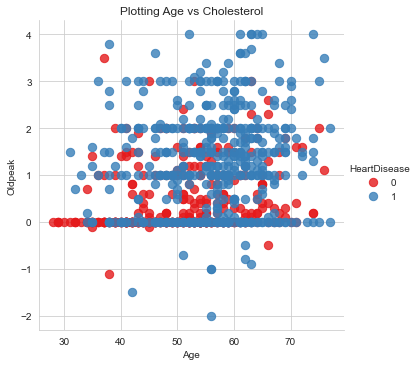

In [85]:
plt.figure(figsize = (18, 18))

sns.lmplot('Age', 'Oldpeak', data=heart,            
           hue='HeartDisease', palette='Set1',
           fit_reg=False, scatter_kws={"s": 70})

#---get the current polar axes on the current figure--- 
ax = plt.gca()
ax.set_title("Plotting Age vs Cholesterol") 

#---show the plot---
plt.show()

In [ ]:
'''
PK:

As you can see we have complex patterns.

The higher the Oldpeak, the more likely a person gets heart disease especially age between 40 and 70.

'''

In [17]:
heart.HeartDisease.value_counts()

1    492
0    407
Name: HeartDisease, dtype: int64

In [33]:
heart.HeartDisease.value_counts(normalize=True)

1    0.547275
0    0.452725
Name: HeartDisease, dtype: float64

Text(0.5, 1.0, 'Heart Disease Classes Distribution')

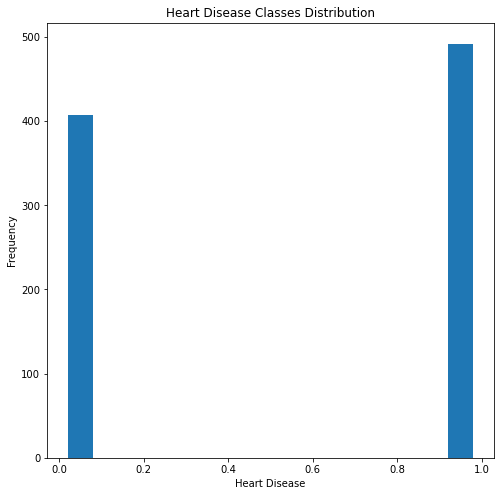

In [17]:
# Histogram plot

plt.figure(figsize = (8, 8))

plt.hist(heart.HeartDisease, rwidth=0.6)

# Add X Label on X-axis
plt.xlabel("Heart Disease")

# Add X Label on X-axis
plt.ylabel("Frequency")

# Add title to graph
plt.title("Heart Disease Classes Distribution")

# Show the plot
#plt.show()

In [ ]:
'''
PK:

Since the target variable has a little imbalance between two classes I decide to use class_weight hyperparameter.

'''

In [38]:
0.547275**2

0.29950992562499995

In [39]:
0.452725**2

0.20495992562499998

In [40]:
0.29950992562499995 + 0.20495992562499998

0.5044698512499999

In [ ]:
'''
PK:

Odds of Guessing Minority Correct: 0.452725**2 = 0.20495992562499998
Odds of Guessing Majority Correct: 0.547275**2 = 0.29950992562499995

Baseline = 0.20495992562499998 + 0.29950992562499995 = 0.5044698512499999

If we guessed at that rate, we would guess correctly about 50.4% of the time. (Baseline Accuracy?)

Any machine learning model that improves on this baseline is adding value, 
but must also be above the ZeroR 54.7% threshold to be useful as a predictor.

'''

In [20]:
# First copy of row-reduced dataframe heart (899, 12)

heart2 = heart.copy()

In [21]:
heart2.shape

(899, 12)

In [18]:
heart2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 899 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             899 non-null    int64  
 1   Sex             899 non-null    object 
 2   ChestPainType   899 non-null    object 
 3   RestingBP       899 non-null    int64  
 4   Cholesterol     899 non-null    int64  
 5   FastingBS       899 non-null    int64  
 6   RestingECG      899 non-null    object 
 7   MaxHR           899 non-null    int64  
 8   ExerciseAngina  899 non-null    object 
 9   Oldpeak         899 non-null    float64
 10  ST_Slope        899 non-null    object 
 11  HeartDisease    899 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 91.3+ KB


In [28]:
print([column for column in heart2.columns if heart[column].dtype == object])

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']


In [22]:
heart2.Sex.value_counts()

M    710
F    189
Name: Sex, dtype: int64

In [23]:
codes, uniques = pd.factorize(heart2.Sex, sort=True)
print(codes)

print(uniques)

[1 0 1 0 1 1 0 1 1 0 0 1 1 1 0 0 1 0 1 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1
 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 0 1 1 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0
 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 0 1 1
 1 0 0 1 0 0 1 0 0 1 0 1 1 0 0 0 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0
 1 1 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 0 0 1 1 1
 1 1 1 0 1 1 0 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0 1 0 1 1
 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 0 1 1 0 0 1 0 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 0 1 1 1 1 1 1 1 

In [24]:
heart2.Sex = heart2.Sex.replace(['F', 'M'], [0, 1])

In [25]:
heart2.Sex.value_counts()

1    710
0    189
Name: Sex, dtype: int64

In [26]:
heart2.ChestPainType.value_counts()

ASY    483
NAP    200
ATA    171
TA      45
Name: ChestPainType, dtype: int64

In [27]:
codes, uniques = pd.factorize(heart2.ChestPainType, sort=True)
print(codes)

print(uniques)

[1 2 1 0 2 2 1 1 0 1 2 1 1 0 2 1 0 1 0 1 3 1 1 1 2 2 0 1 1 1 2 2 0 0 1 1 0
 1 1 0 1 2 1 2 0 2 0 1 2 0 0 0 1 1 0 1 0 2 0 0 1 2 0 0 1 1 0 1 0 0 1 1 0 0
 0 2 0 1 0 2 1 0 1 0 0 0 1 3 0 1 0 1 0 2 0 1 2 0 1 0 0 0 0 0 1 0 1 0 1 0 0
 1 2 0 0 0 3 3 2 2 0 1 1 1 1 0 1 2 2 0 0 0 0 2 1 1 0 0 0 0 0 0 1 0 1 1 1 1
 1 1 0 1 0 0 0 0 1 0 0 1 1 1 3 1 0 2 1 2 1 2 0 0 0 1 2 0 0 1 0 0 1 2 1 0 0
 0 0 1 1 2 1 3 0 1 0 3 3 2 2 1 1 0 1 1 1 0 0 2 2 2 0 3 0 2 1 1 0 0 2 2 1 0
 2 0 1 0 0 2 1 0 1 1 0 3 0 0 1 1 1 0 3 2 0 0 0 0 0 0 1 0 2 1 2 2 1 1 1 0 0
 2 1 0 1 0 2 0 1 0 2 1 2 2 0 0 1 2 0 2 1 0 2 0 1 1 1 2 1 0 0 3 0 0 0 0 0 0
 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 2 0 0 0 2 0 0 0 0 2 0 0 0 2 0 2 0 0 3 2 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 1 2 2 2 0 2 0 2 0 0 0 0 0 0 0 0 0 2 2
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 2 0 0 0 0 2 0 0 0 2 0 0
 0 0 0 0 2 2 0 2 2 1 1 0 0 2 0 0 0 0 0 0 0 0 2 2 2 0 0 0 0 2 0 0 0 2 0 0 0
 0 0 2 0 0 0 0 0 0 0 2 2 2 1 0 1 0 0 0 2 1 0 0 0 0 2 1 2 3 0 0 1 1 0 3 0 2
 0 3 2 0 0 0 0 0 0 0 0 0 

In [28]:
heart2.ChestPainType = heart2.ChestPainType.replace(['ASY', 'ATA', 'NAP', 'TA'], [0, 1, 2, 3])

In [29]:
heart2.ChestPainType.value_counts()

0    483
2    200
1    171
3     45
Name: ChestPainType, dtype: int64

In [30]:
heart2.RestingECG.value_counts()

Normal    543
LVH       182
ST        174
Name: RestingECG, dtype: int64

In [31]:
codes, uniques = pd.factorize(heart2.RestingECG, sort=True)
print(codes)

print(uniques)

[1 1 2 1 1 1 1 1 1 1 1 2 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 2 1 1 1
 2 2 1 1 2 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 1 1 1 1 1 1 1 1 2 1 2 1 1 2
 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 2 1 1 1 1 1 2 2 1 1 1 1
 1 2 1 1 2 2 1 1 1 2 1 1 1 1 1 1 1 1 1 2 2 2 1 2 2 1 1 1 2 2 1 1 1 1 2 1 1
 1 1 1 2 1 1 1 1 2 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 1 1
 2 2 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 0 1 0 1 1 1 1 2 1 2 1 1 1 1 1 1 1 1 1 1
 1 1 1 2 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 2 2 1 1 1 2 1 1 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 2 2 0 1 1 2 1 1 1 1 2 1 1 1 1 1 1 1 1 2 1 2 1
 2 1 2 1 1 1 2 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 2 1 2 1 2 1 0 0 2 0
 1 1 1 1 1 1 1 1 1 2 1 1 2 2 2 2 0 1 1 1 1 1 1 2 2 1 1 2 1 1 1 1 1 1 1 2 1
 2 1 2 2 1 1 1 1 1 1 0 1 2 2 0 1 1 1 1 2 1 1 2 2 1 1 1 1 1 1 0 2 1 1 1 1 1
 2 2 2 2 0 2 2 2 1 2 2 2 1 0 2 2 1 1 2 2 1 2 2 1 2 2 2 2 1 2 2 2 1 1 2 2 1
 1 2 1 1 2 2 2 1 1 1 1 1 2 1 2 1 1 1 2 2 1 0 0 1 2 0 1 2 1 0 1 2 2 2 1 1 1
 2 2 1 1 1 1 1 2 1 1 1 2 

In [32]:
heart2.RestingECG = heart2.RestingECG.replace(['LVH', 'Normal', 'ST'], [0, 1, 2])

In [33]:
heart2.RestingECG.value_counts()

1    543
0    182
2    174
Name: RestingECG, dtype: int64

In [34]:
heart2.ExerciseAngina.value_counts()

N    536
Y    363
Name: ExerciseAngina, dtype: int64

In [35]:
codes, uniques = pd.factorize(heart2.ExerciseAngina, sort=True)
print(codes)

print(uniques)

[0 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1
 0 0 1 0 1 0 0 1 1 0 0 0 0 1 1 0 0 1 0 1 0 0 1 0 0 0 1 0 0 0 0 1 0 1 0 0 0
 1 0 0 1 0 0 0 0 0 1 1 1 1 0 1 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1
 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 0 0 1 1 1 1 1 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 1 1
 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1 0 0 0 0
 0 1 0 0 0 0 0 0 0 1 1 0 1 1 0 1 0 1 0 1 1 1 1 0 0 1 0 1 0 0 0 0 0 1 0 1 0
 1 0 1 0 1 0 0 0 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 0 0 0
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 1 1 0 1 1 1 0 0 0 0 0 0 0 0 0
 0 0 1 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0 1 0 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1
 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 1 0 0 1 1 0 0 0 1 1 1 1 1 0 1 0 0 1 0 1 0
 1 0 1 1 1 0 1 1 1 0 0 1 1 1 1 0 1 1 0 1 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 0 0 0 1 1 1 0 1 0 1 0 1 0 0 1 1 1 0 1 0 1 1 1 1 0 0 1 1 1 0 1 0 1 1
 0 0 1 1 1 0 1 1 1 1 1 1 

In [36]:
heart2.ExerciseAngina = heart2.ExerciseAngina.replace(['N', 'Y'], [0, 1])

In [37]:
heart2.ExerciseAngina.value_counts()

0    536
1    363
Name: ExerciseAngina, dtype: int64

In [38]:
heart2.ST_Slope.value_counts()

Flat    449
Up      393
Down     57
Name: ST_Slope, dtype: int64

In [39]:
codes, uniques = pd.factorize(heart2.ST_Slope, sort=True)
print(codes)

print(uniques)

[2 1 2 1 2 2 2 2 1 2 2 1 2 1 2 1 1 2 1 1 2 1 2 1 2 2 1 2 2 2 1 2 1 1 2 2 1
 2 2 1 2 1 2 2 1 1 2 2 1 1 1 1 2 2 1 2 1 1 2 1 2 2 2 1 2 2 2 2 1 2 1 2 1 2
 1 2 2 2 1 2 2 1 2 1 1 1 1 1 1 2 2 2 1 2 1 2 2 2 2 1 2 1 1 1 2 2 2 2 1 1 2
 2 2 1 1 1 2 1 1 2 2 1 2 2 2 2 2 1 2 1 1 1 1 1 2 2 1 1 1 1 1 2 1 2 2 2 2 2
 2 2 2 2 1 1 2 1 2 1 1 2 2 2 1 2 2 2 2 2 2 2 1 1 1 2 2 2 1 2 1 1 2 1 2 1 1
 1 2 2 2 2 2 2 1 2 1 1 2 2 2 2 2 2 2 1 2 1 1 1 2 2 1 2 1 2 2 2 1 1 2 2 2 1
 2 1 2 2 2 2 2 2 2 1 1 1 1 1 2 1 2 1 2 1 0 1 1 1 1 2 2 1 2 2 2 2 2 2 2 1 1
 1 2 1 2 1 1 2 2 1 2 2 2 1 1 1 2 2 1 2 2 2 2 2 2 2 2 2 2 2 1 2 2 1 2 1 2 1
 2 2 0 1 2 1 0 2 0 2 2 2 2 0 2 1 2 1 2 1 1 2 0 0 2 2 1 0 2 2 2 2 2 1 1 2 2
 0 0 0 1 1 1 1 1 1 1 1 1 2 0 1 2 1 1 1 1 1 1 1 1 1 1 1 2 1 1 2 1 2 1 0 2 1
 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 0 2 1 2 1 1 2 1 2 1 1 1 1 2 0 1 0 2 2 1 1 2 2 1 1 1 1 1 1 2 1 0 1 1 2
 1 2 1 1 1 2 1 1 0 2 0 2 1 2 2 1 1 1 1 1 2 1 2 0 1 1 1 0 2 0 1 1 2 1 2 1 1
 1 1 1 1 1 0 0 1 1 0 1 1 

In [40]:
heart2.ST_Slope = heart2.ST_Slope.replace(['Down', 'Flat', 'Up'], [0, 1, 2])

In [41]:
heart2.ST_Slope.value_counts()

1    449
2    393
0     57
Name: ST_Slope, dtype: int64

In [ ]:
# heart2 dataset preparation ends here for its use.

In [ ]:
# Use case 1 of heart2

Univariate Analysis

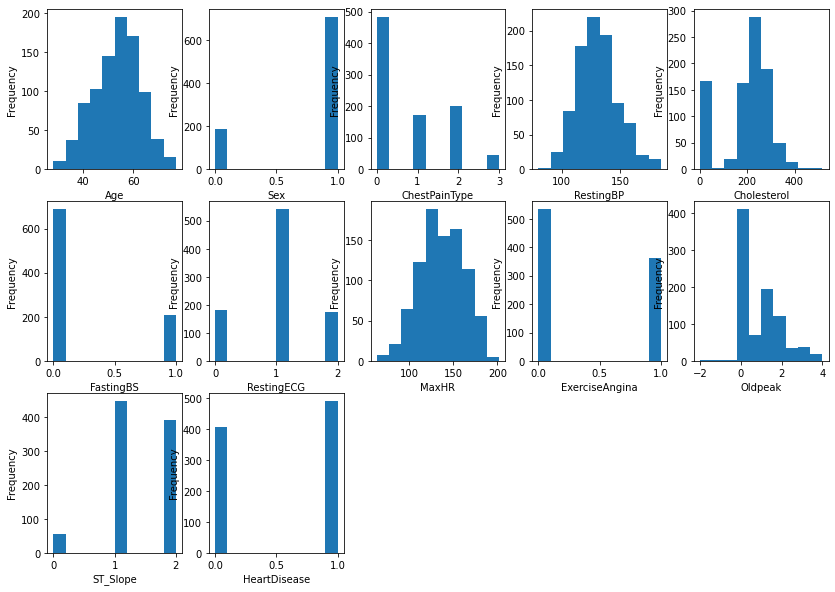

In [74]:
fig = plt.figure(figsize=(14, 10)) 

i = 0
for column in heart2:
    sub = fig.add_subplot(3, 5, i + 1)
    sub.set_xlabel(column)
    heart2[column].plot(kind = 'hist')
    i += 1

In [75]:
heart2.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [ ]:
Grouped Bar Chart - Categorical Features vs Target

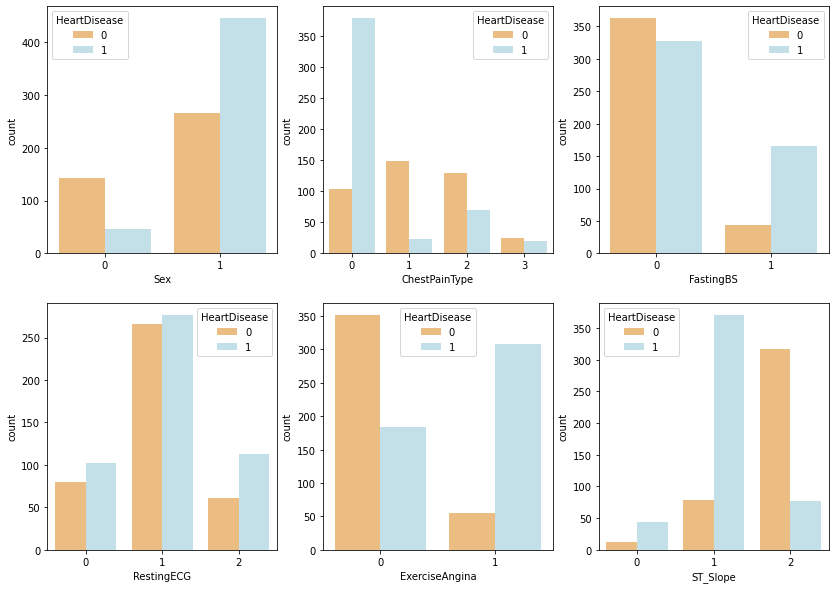

In [78]:
# Bar plot
#catego_list = ['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS', 'RestingECG', 'MaxHR', 
#               'ExerciseAngina', 'Oldpeak', 'ST_Slope']
catego_list = ['Sex', 'ChestPainType', 'FastingBS', 'RestingECG', 'ExerciseAngina', 'ST_Slope']

fig = plt.figure(figsize=(14, 10))

for i in range(len(catego_list)):
    column = catego_list[i]
    sub = fig.add_subplot(2, 3, i + 1)
    chart = sns.countplot(data = heart2, x = column, hue = 'HeartDisease', palette = 'RdYlBu')

In [ ]:
# HeartDisease: output class [1: heart disease, 0: Normal]

In [ ]:
'''
PK:

As we can see male and female for Sex feature have distinct distribution of target value, which indicates it is likely to 
contribute more to the prediction of target.

If the target distribution is the same regardless of the categorical features, then they are very likely not correlated.

We can see that all 6 categorical features ('Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope', 'FastingBS')
are not correlated with the target variable, 'HeartDisease'.

'''

In [ ]:
Box Plot - Numerical Features vs Target

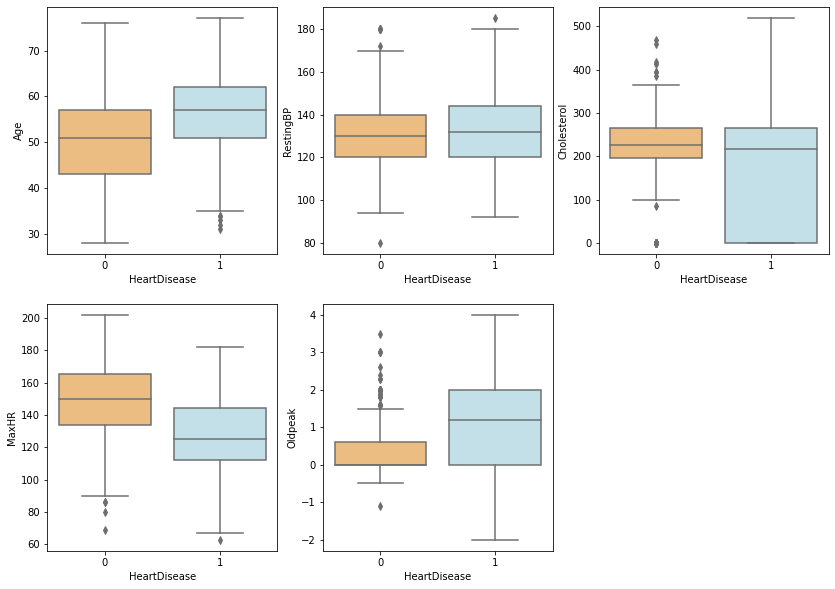

In [79]:
num_list = ['Age', 'RestingBP', 'Cholesterol', 'MaxHR', 'Oldpeak']

fig = plt.figure(figsize=(14, 10))

for i in range(len(num_list)):
    column = num_list[i]
    sub = fig.add_subplot(2, 3, i + 1)
    chart = sns.boxplot(x = 'HeartDisease', y = column, data = heart2, palette = 'RdYlBu')

In [ ]:
'''
PK:

The plots show that 'Cholesterol' and 'Oldpeak' have distinct difference between target 0 and target 1 suggesting that
they are important predictors.

However, 'RestingBp' and 'MaxHR' appear to be less outstanding as the box plot distributions are similar between target gruops.

'''

In [82]:
X_ht2 = heart2.drop(['HeartDisease'], axis = 1)

y_ht2 = heart2.HeartDisease

In [88]:
type(X_ht2)

pandas.core.frame.DataFrame

In [89]:
type(y_ht2)

pandas.core.series.Series

In [83]:
# check X's shape (n = number of observations, p = number of features)
print(X_ht2.shape)

# check y's shape (single dimension with length n)
print(y_ht2.shape)

(899, 11)
(899,)


In [90]:
X_var = X_ht2.values    # independent variable, ['recency', 'monetary', 'time_months']
y_var = y_ht2.values    # dependent variable, 'blood_doner'

print(cl('X variable samples :\n {}'.format(X_var[:5]), attrs = ['bold']))
print()
print(cl('Y variable samples :\n {}'.format(y_var[:5]), attrs = ['bold']))

X variable samples :
 [[ 40.    1.    1.  140.  289.    0.    1.  172.    0.    0.    2. ]
 [ 49.    0.    2.  160.  180.    0.    1.  156.    0.    1.    1. ]
 [ 37.    1.    1.  130.  283.    0.    2.   98.    0.    0.    2. ]
 [ 48.    0.    0.  138.  214.    0.    1.  108.    1.    1.5   1. ]
 [ 54.    1.    2.  150.  195.    0.    1.  122.    0.    0.    2. ]]

Y variable samples :
 [0 1 0 1 0]


In [91]:
X_train, X_test, y_train, y_test = train_test_split(X_var, y_var, test_size = 0.3, random_state = 42)    # PK: ndarray

In [92]:
print(cl('X_train shape : {}'.format(X_train.shape), attrs = ['bold'], color = 'blue'))
print(cl('X_test shape : {}'.format(X_test.shape), attrs = ['bold'], color = 'blue'))
print(cl('y_train shape : {}'.format(y_train.shape), attrs = ['bold'], color = 'red'))
print(cl('y_test shape : {}'.format(y_test.shape), attrs = ['bold'], color = 'red'))

X_train shape : (629, 11)
X_test shape : (270, 11)
y_train shape : (629,)
y_test shape : (270,)


In [93]:
type(X_train)

numpy.ndarray

In [94]:
type(y_train)

numpy.ndarray

In [95]:
# StandardScaler

from sklearn.preprocessing import StandardScaler

In [96]:
ss = StandardScaler()

In [97]:
X_train_ss_transformed = ss.fit_transform(X_train)

In [98]:
X_test_ss_transformed = ss.transform(X_test)

In [99]:
X_train_ss_transformed[:1]

array([[-1.08117809,  0.53506875, -0.82483801, -1.00803798, -1.99637754,
        -0.53752621,  0.06015245,  0.30129507,  1.23125952,  1.04197322,
        -0.61245422]])

In [100]:
X_test_ss_transformed[:1]

array([[ 1.00585894,  0.53506875, -0.82483801,  0.44728678, -1.99637754,
         1.8603744 , -1.51634311,  0.4576925 , -0.81217646,  1.04197322,
         1.05522415]])

Machine Learning Model Pipeline

In [116]:
model_pipeline = []
model_pipeline.append(LogisticRegression(solver = 'liblinear'))
model_pipeline.append(SVC())
model_pipeline.append(KNeighborsClassifier())
model_pipeline.append(DecisionTreeClassifier())
model_pipeline.append(RandomForestClassifier())
model_pipeline.append(GaussianNB())

In [117]:
model_list = ['Logistic Regression', 'SVM', 'KNN', 'Decision Tree', 'Random Forest', 'Naive Bayes']

In [118]:
acc_list = []
auc_list = []
cm_list = []

for model in model_pipeline:
    model.fit(X_train_ss_transformed, y_train)
    y_pred = model.predict(X_test_ss_transformed)
    acc_list.append(accuracy_score(y_test, y_pred))
    fpr, tpr, _thresholds = roc_curve(y_test, y_pred)
    auc_list.append(round(auc(fpr, tpr), 2))
    cm_list.append(confusion_matrix(y_test, y_pred))

In [ ]:
'''
Accuracy - the most straightforward indicator of the model performance.
It measures the percetage of accurate predictions.

ROC is the plot of TPR against FPR at various classification.

Confusion matrix indicates the actual values against the predicted values and summarise TN, FP, FN 
and TP values in a matrix format.

'''

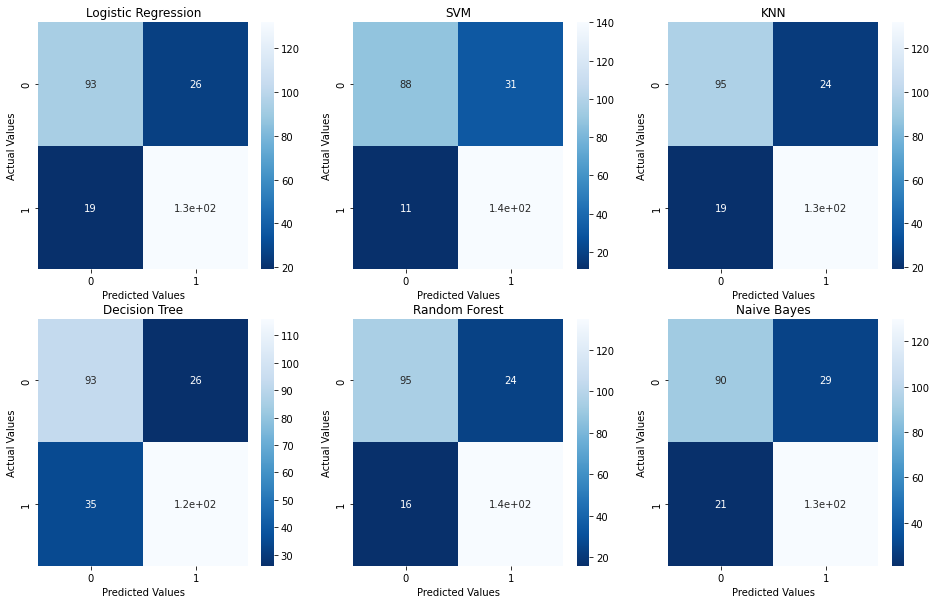

In [108]:
# Plot confusion matrix

fig = plt.figure(figsize=(16, 10))

for i in range(len(cm_list)):
    cm = cm_list[i]
    model = model_list[i]
    sub = fig.add_subplot(2, 3, i + 1).set_title(model)
    cm_plot = sns.heatmap(cm, annot = True, cmap = 'Blues_r')
    cm_plot.set_xlabel('Predicted Values')
    cm_plot.set_ylabel('Actual Values')

In [109]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [119]:
# Accuracy and AUC

result_ht2 = pd.DataFrame({'Model': model_list, 'Accuracy': acc_list, 'AUC': auc_list})

result_ht2

,Model,Accuracy,AUC
0,Logistic Regression,0.833333,0.83
1,SVM,0.844444,0.83
2,KNN,0.840741,0.84
3,Decision Tree,0.781481,0.78
4,Random Forest,0.855556,0.85
5,Naive Bayes,0.814815,0.81


In [ ]:
'''
PK:

Based on 3 evaluation methods above, Random Forest, KNN, and SVM show the best perfomance 
whereas Decision Tree is not ding well. 

It can be said that Random Forest, KNN, and SVM are more suitable for this dataset where the data size is relatively small.

Each algorithm has its own preference and require different data processing and feature engineering techniques.

'''

In [ ]:
# heart dataset preparation starts

In [42]:
heart.shape

(899, 12)

In [43]:
type(heart)

pandas.core.frame.DataFrame

In [42]:
print([column for column in heart.columns if heart[column].dtype == object])

['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope']


In [44]:
heart_with_dummies = pd.get_dummies(data = heart, columns = ['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 
                                                             'ST_Slope'], 
                                    prefix = ['Sex', 'ChestPainType', 'RestingECG', 'ExerciseAngina', 'ST_Slope'], 
                                        drop_first=True)

In [45]:
heart_with_dummies.shape

(899, 16)

In [46]:
heart_with_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 899 entries, 0 to 917
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                899 non-null    int64  
 1   RestingBP          899 non-null    int64  
 2   Cholesterol        899 non-null    int64  
 3   FastingBS          899 non-null    int64  
 4   MaxHR              899 non-null    int64  
 5   Oldpeak            899 non-null    float64
 6   HeartDisease       899 non-null    int64  
 7   Sex_M              899 non-null    uint8  
 8   ChestPainType_ATA  899 non-null    uint8  
 9   ChestPainType_NAP  899 non-null    uint8  
 10  ChestPainType_TA   899 non-null    uint8  
 11  RestingECG_Normal  899 non-null    uint8  
 12  RestingECG_ST      899 non-null    uint8  
 13  ExerciseAngina_Y   899 non-null    uint8  
 14  ST_Slope_Flat      899 non-null    uint8  
 15  ST_Slope_Up        899 non-null    uint8  
dtypes: float64(1), int64(6), u

In [46]:
heart_with_dummies.head()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up
0,40,140,289,0,172,0.0,0,1,1,0,0,1,0,0,0,1
1,49,160,180,0,156,1.0,1,0,0,1,0,1,0,0,1,0
2,37,130,283,0,98,0.0,0,1,1,0,0,0,1,0,0,1
3,48,138,214,0,108,1.5,1,0,0,0,0,1,0,1,1,0
4,54,150,195,0,122,0.0,0,1,0,1,0,1,0,0,0,1


In [ ]:
# heart dataset preparation ends here.

In [ ]:
# Use case 1 of heart

In [47]:
heart_with_dummies.shape

(899, 16)

In [48]:
y = heart_with_dummies.HeartDisease.copy()

X = heart_with_dummies.copy().drop(columns='HeartDisease')
# OR X = heart_with_dummies.copy().drop(['HeartDisease'], axis = 1)

In [49]:
type(y)

pandas.core.series.Series

In [50]:
y.shape

(899,)

In [52]:
y.head()

0    0
1    1
2    0
3    1
4    0
Name: HeartDisease, dtype: int64

In [53]:
y.value_counts()

1    492
0    407
Name: HeartDisease, dtype: int64

In [51]:
type(X)

pandas.core.frame.DataFrame

In [55]:
X.shape

(899, 15)

In [53]:
X.head()

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,Sex_M,ChestPainType_ATA,ChestPainType_NAP,ChestPainType_TA,RestingECG_Normal,RestingECG_ST,ExerciseAngina_Y,ST_Slope_Flat,ST_Slope_Up
0,40,140,289,0,172,0.0,1,1,0,0,1,0,0,0,1
1,49,160,180,0,156,1.0,0,0,1,0,1,0,0,1,0
2,37,130,283,0,98,0.0,1,1,0,0,0,1,0,0,1
3,48,138,214,0,108,1.5,0,0,0,0,1,0,1,1,0
4,54,150,195,0,122,0.0,1,0,1,0,1,0,0,0,1


In [48]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Age,899.0,53.497219,9.456073,28.0,47.0,54.0,60.0,77.0
RestingBP,899.0,132.027809,17.120895,80.0,120.0,130.0,140.0,185.0
Cholesterol,899.0,198.005562,107.157779,0.0,174.5,222.0,266.0,518.0
FastingBS,899.0,0.232481,0.422649,0.0,0.0,0.0,0.0,1.0
MaxHR,899.0,136.917686,25.356740,63.0,120.0,138.0,156.0,202.0
Oldpeak,899.0,0.861513,1.007626,-2.0,0.0,0.5,1.5,4.0
Sex_M,899.0,0.789766,0.407701,0.0,1.0,1.0,1.0,1.0
ChestPainType_ATA,899.0,0.190211,0.392686,0.0,0.0,0.0,0.0,1.0
ChestPainType_NAP,899.0,0.222469,0.416136,0.0,0.0,0.0,0.0,1.0
ChestPainType_TA,899.0,0.050056,0.218181,0.0,0.0,0.0,0.0,1.0


In [52]:
X.info()    

<class 'pandas.core.frame.DataFrame'>
Int64Index: 899 entries, 0 to 917
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Age                899 non-null    int64  
 1   RestingBP          899 non-null    int64  
 2   Cholesterol        899 non-null    int64  
 3   FastingBS          899 non-null    int64  
 4   MaxHR              899 non-null    int64  
 5   Oldpeak            899 non-null    float64
 6   Sex_M              899 non-null    uint8  
 7   ChestPainType_ATA  899 non-null    uint8  
 8   ChestPainType_NAP  899 non-null    uint8  
 9   ChestPainType_TA   899 non-null    uint8  
 10  RestingECG_Normal  899 non-null    uint8  
 11  RestingECG_ST      899 non-null    uint8  
 12  ExerciseAngina_Y   899 non-null    uint8  
 13  ST_Slope_Flat      899 non-null    uint8  
 14  ST_Slope_Up        899 non-null    uint8  
dtypes: float64(1), int64(5), uint8(9)
memory usage: 57.1 KB


Collinear Columns

In [38]:
threshold = 0.95

corr = X.corr() 

mask = np.triu(
np.ones(corr.shape), k=1).astype(bool)

corr_no_diag = corr.where(mask) 

cols = [c for c in corr_no_diag.columns
          if any(abs(corr_no_diag[c]) > threshold)]

In [39]:
cols    

[]

In [53]:
feature_names = X.columns

feature_names

Index(['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak',
       'Sex_M', 'ChestPainType_ATA', 'ChestPainType_NAP', 'ChestPainType_TA',
       'RestingECG_Normal', 'RestingECG_ST', 'ExerciseAngina_Y',
       'ST_Slope_Flat', 'ST_Slope_Up'],
      dtype='object')

In [54]:
len(feature_names)

15

In [55]:
rnd_clf = RandomForestClassifier(n_estimators=500, n_jobs=-1) 

rnd_clf.fit(X, y)

# Converting to list
zipped = zip(feature_names, rnd_clf.feature_importances_)   

# Printing zipped list
print("Initial zipped list - ", str(zipped))
print()

# Using sorted and lambda
res = sorted(zipped, key = lambda x: x[1], reverse=True)
      
# printing result
print("final list - \n", str(res))

Initial zipped list -  <zip object at 0x000001953E0B5B80>

final list - 
 [('ST_Slope_Up', 0.14535210367676304), ('Oldpeak', 0.1151187713523729), ('ST_Slope_Flat', 0.10947436309181502), ('Cholesterol', 0.10945414902396497), ('MaxHR', 0.10888793996331561), ('Age', 0.08271517182538096), ('ExerciseAngina_Y', 0.08247129568256752), ('RestingBP', 0.07141335945294189), ('ChestPainType_ATA', 0.04579609521319368), ('Sex_M', 0.03936118018077838), ('ChestPainType_NAP', 0.02743642482455242), ('FastingBS', 0.026654758251355003), ('RestingECG_Normal', 0.016678983644099445), ('RestingECG_ST', 0.00984367863448334), ('ChestPainType_TA', 0.009341725182415973)]


In [56]:
len(res)

15

In [57]:
threshold = 0.95

feature_cols = []
score_sum = 0.0

#for name, score in zip(feature_names, rnd_clf.feature_importances_):
for i in res:
    score_sum += i[1]
    if score_sum < threshold:
        feature_cols.append(i[0])
    else:
        break
        
print(feature_cols)    

['ST_Slope_Up', 'Oldpeak', 'ST_Slope_Flat', 'Cholesterol', 'MaxHR', 'Age', 'ExerciseAngina_Y', 'RestingBP', 'ChestPainType_ATA', 'Sex_M', 'ChestPainType_NAP']


In [58]:
len(feature_cols)

11

In [ ]:
# threshold = 0.95, len(feature_cols) = 11
# threshold = 0.9, len(feature_cols) = 9

In [64]:
score_sum

0.9649111411715828

In [59]:
X_rf_reduced = X[feature_cols]

In [60]:
# check X's shape (n = number of observations, p = number of features)
print(X_rf_reduced.shape)

# check y's shape (single dimension with length n)
print(y.shape)

(899, 11)
(899,)


In [61]:
type(X_rf_reduced)

pandas.core.frame.DataFrame

In [62]:
type(y)

pandas.core.series.Series

In [ ]:
# Use case 2 of heart2

In [63]:
type(heart2)

pandas.core.frame.DataFrame

In [65]:
heart2.shape

(899, 12)

In [71]:
heart2.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,1,1,140,289,0,1,172,0,0.0,2,0
1,49,0,2,160,180,0,1,156,0,1.0,1,1
2,37,1,1,130,283,0,2,98,0,0.0,2,0
3,48,0,0,138,214,0,1,108,1,1.5,1,1
4,54,1,2,150,195,0,1,122,0,0.0,2,0


In [66]:
dataX = heart2.copy().drop(['HeartDisease'], axis = 1)

dataY = heart2.HeartDisease.copy()

In [67]:
# check X's shape (n = number of observations, p = number of features)
print(dataX.shape)

# check y's shape (single dimension with length n)
print(dataY.shape)

(899, 11)
(899,)


In [68]:
featuresToScale = dataX.columns 

sX = StandardScaler(copy = True)

dataX.loc[:, featuresToScale] = sX.fit_transform(dataX[featuresToScale])

In [69]:
type(dataX)

pandas.core.frame.DataFrame

In [70]:
dataX.shape 

(899, 11)

In [77]:
dataX.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope
0,-1.428154,0.515943,0.224572,0.465900,0.849636,-0.550362,0.014143,1.384320,-0.822945,-0.855469,1.042496
1,-0.475855,-1.938199,1.270637,1.634714,-0.168122,-0.550362,0.014143,0.752973,-0.822945,0.137516,-0.622165
2,-1.745588,0.515943,0.224572,-0.118507,0.793612,-0.550362,1.603415,-1.535661,-0.822945,-0.855469,1.042496
3,-0.581666,-1.938199,-0.821492,0.349019,0.149344,-0.550362,0.014143,-1.141069,1.215148,0.634008,-0.622165
4,0.053200,0.515943,1.270637,1.050307,-0.028064,-0.550362,0.014143,-0.588640,-0.822945,-0.855469,1.042496


In [71]:
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size = 0.3, random_state = 42, stratify = dataY)

In [72]:
print(cl('X_train shape : {}'.format(X_train.shape), attrs = ['bold'], color = 'blue'))
print(cl('X_test shape : {}'.format(X_test.shape), attrs = ['bold'], color = 'blue'))
print(cl('y_train shape : {}'.format(y_train.shape), attrs = ['bold'], color = 'red'))
print(cl('y_test shape : {}'.format(y_test.shape), attrs = ['bold'], color = 'red'))

X_train shape : (629, 11)
X_test shape : (270, 11)
y_train shape : (629,)
y_test shape : (270,)


In [73]:
type(X_train)

pandas.core.frame.DataFrame

In [74]:
type(y_train)

pandas.core.series.Series

In [106]:
correlationMatrix = pd.DataFrame(data = [], index = dataX.columns, columns = dataX.columns)

for i in dataX.columns:
    for j in dataX.columns: 
        correlationMatrix.loc[i,j] = np.round(pearsonr(dataX.loc[:,i], dataX.loc[:,j])[0],2)

In [107]:
correlationMatrix

,ST_Slope_Up,Oldpeak,ST_Slope_Flat,MaxHR,Cholesterol,ExerciseAngina_Y,Age,RestingBP,ChestPainType_ATA,Sex_M,ChestPainType_NAP
ST_Slope_Up,1.00,-0.46,-0.88,0.39,0.10,-0.46,-0.26,-0.10,0.35,-0.16,0.09
Oldpeak,-0.46,1.00,0.32,-0.18,0.03,0.42,0.26,0.16,-0.26,0.13,-0.10
ST_Slope_Flat,-0.88,0.32,1.00,-0.34,-0.05,0.39,0.19,0.13,-0.30,0.12,-0.08
MaxHR,0.39,-0.18,-0.34,1.00,0.23,-0.38,-0.40,-0.11,0.25,-0.19,0.14
Cholesterol,0.10,0.03,-0.05,0.23,1.00,-0.04,-0.10,0.11,0.16,-0.21,-0.00
ExerciseAngina_Y,-0.46,0.42,0.39,-0.38,-0.04,1.00,0.22,0.15,-0.30,0.20,-0.16
Age,-0.26,0.26,0.19,-0.40,-0.10,0.22,1.00,0.27,-0.22,0.07,-0.02
RestingBP,-0.10,0.16,0.13,-0.11,0.11,0.15,0.27,1.00,-0.06,0.02,-0.02
ChestPainType_ATA,0.35,-0.26,-0.30,0.25,0.16,-0.30,-0.22,-0.06,1.00,-0.17,-0.26
Sex_M,-0.16,0.13,0.12,-0.19,-0.21,0.20,0.07,0.02,-0.17,1.00,-0.07


In [75]:
k_fold = StratifiedKFold(n_splits=5, shuffle = True, random_state = 42)

In [88]:
# Model #1: Logistic Regression
# Set hyperparameters

penalty = 'l2' 
C = 1.0
class_weight = 'balanced' 
random_state = 42
solver = 'liblinear'
logReg = LogisticRegression(penalty = penalty, C = C, class_weight = class_weight,
                            random_state = random_state, solver = solver, n_jobs = 1)

In [89]:
# Train the model

trainingScores = [] 
cvScores = []

predictionsBasedOnKFolds = pd.DataFrame(data = [], index = y_train.index, columns=[0,1])

model = logReg
for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    model.fit(X_train_fold, y_train_fold)
    
    loglossTraining = log_loss(y_train_fold, model.predict_proba(X_train_fold)[:,1]) 
    trainingScores.append(loglossTraining)

    predictionsBasedOnKFolds.loc[X_cv_fold.index,:] = model.predict_proba(X_cv_fold)
    
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index,1]) 
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

Training Log Loss:  0.36548588295083817
CV Log Loss:  0.3132001929831066
Training Log Loss:  0.32300376467841374
CV Log Loss:  0.4934941820013614
Training Log Loss:  0.3723661494334494
CV Log Loss:  0.29661384893281806
Training Log Loss:  0.34510950611459323
CV Log Loss:  0.4200880828432393
Training Log Loss:  0.34140352787370765
CV Log Loss:  0.4154466979480522


In [90]:
# Evaluate the results

loglossLogisticRegression = log_loss(y_train, predictionsBasedOnKFolds.loc[:,1])

print('Logistic Regression Log Loss: ', loglossLogisticRegression)

Logistic Regression Log Loss:  0.38772459760784217


Text(0.5, 1.0, 'Precision-Recall curve: Average Precision = 0.92')

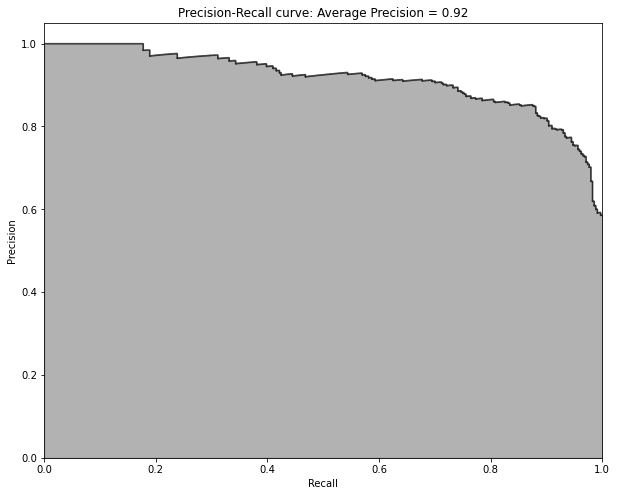

In [91]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:,1]], axis = 1)

preds.columns = ['trueLabel','prediction']

predictionsBasedOnKFoldsLogisticRegression = preds.copy()

precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])

average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

fig, ax = plt.subplots(figsize=(10, 8))

plt.step(recall, precision, color = 'k', alpha = 0.7, where = 'post') 

plt.fill_between(recall, precision, step = 'post', alpha = 0.3, color = 'k')

plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Precision-Recall curve: Average Precision = {0:0.2f}'.format(average_precision))

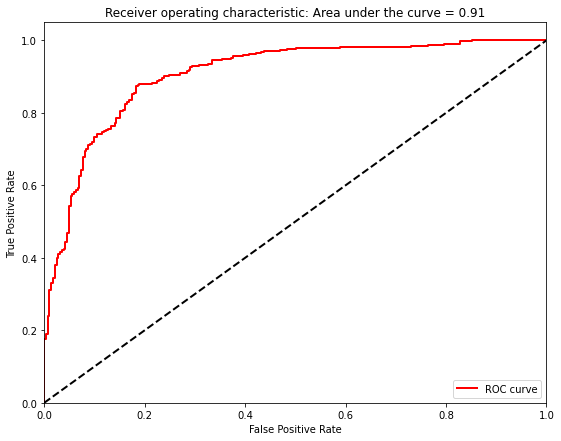

In [92]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'],preds['prediction']) 

areaUnderROC = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(9, 7))

#plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic: Area under the curve = {0:0.2f}'.format(areaUnderROC)) 

plt.legend(loc="lower right") 

#plt.show()

In [ ]:
# Model #2: Random Forests

In [104]:
# Set the hyperparameters

n_estimators = 10 
max_features = 'auto' 
max_depth = None
min_samples_split = 2
min_samples_leaf = 1
min_weight_fraction_leaf = 0.0 
max_leaf_nodes = None 
bootstrap = True
oob_score = False
n_jobs = -1
random_state = 42 
class_weight = 'balanced'

RFC = RandomForestClassifier(n_estimators=n_estimators, max_features=max_features, max_depth=max_depth, 
                             min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf,
                             min_weight_fraction_leaf=min_weight_fraction_leaf, max_leaf_nodes=max_leaf_nodes, 
                             bootstrap=bootstrap, oob_score=oob_score, n_jobs=n_jobs, random_state=random_state,
                             class_weight=class_weight)

In [105]:
# Train the model

trainingScores = [] 
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index,columns=[0,1])

model = RFC

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    model.fit(X_train_fold, y_train_fold)
    
    loglossTraining = log_loss(y_train_fold, model.predict_proba(X_train_fold)[:,1]) 
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index,:] = model.predict_proba(X_cv_fold)
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index,1]) 
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

Training Log Loss:  0.10295819936861844
CV Log Loss:  0.8335485249878447
Training Log Loss:  0.09197714517553333
CV Log Loss:  1.4849914155880013
Training Log Loss:  0.11505517576389909
CV Log Loss:  0.31976275662690373
Training Log Loss:  0.09458450999212173
CV Log Loss:  1.1563155350265573
Training Log Loss:  0.10252432597457951
CV Log Loss:  0.8601801216595599


In [106]:
# Evaluate the results

loglossRandomForestsClassifier = log_loss(y_train, predictionsBasedOnKFolds.loc[:,1])

print('Random Forests Log Loss: ', loglossRandomForestsClassifier)

Random Forests Log Loss:  0.9310721978828896


Text(0.5, 1.0, 'Precision-Recall curve: Average Precision = 0.88')

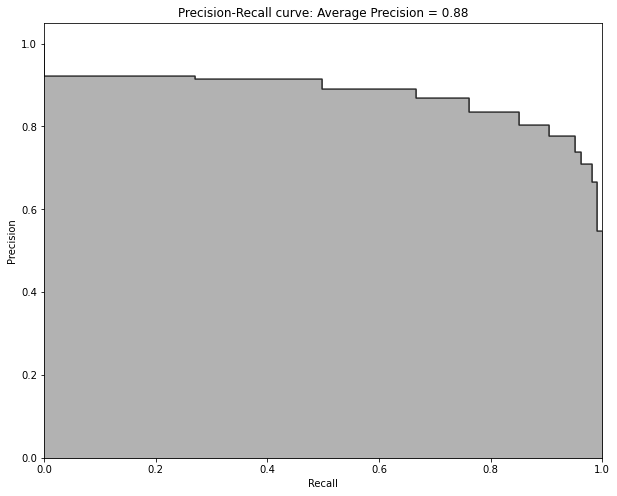

In [96]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:,1]], axis = 1)

preds.columns = ['trueLabel','prediction']

predictionsBasedOnKFoldsRandomForests = preds.copy()

precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])

average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

fig, ax = plt.subplots(figsize=(10, 8))

plt.step(recall, precision, color = 'k', alpha = 0.7, where = 'post') 

plt.fill_between(recall, precision, step = 'post', alpha = 0.3, color = 'k')

plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Precision-Recall curve: Average Precision = {0:0.2f}'.format(average_precision))

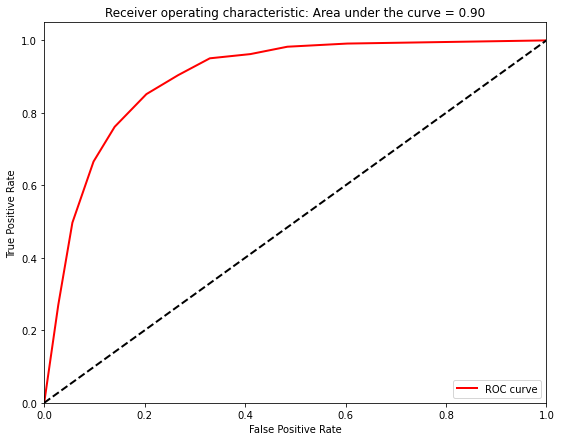

In [97]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'],preds['prediction']) 

areaUnderROC = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(9, 7))

#plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic: Area under the curve = {0:0.2f}'.format(areaUnderROC)) 

plt.legend(loc="lower right") 

#plt.show()

In [ ]:
# Model #3: Gradient Boosting Machine (XGBoost)

In [99]:
params_XGB = {
'nthread': 16, #number of cores
'learning_rate': 0.3, #range 0 to 1, default 0.3 'gamma': 0, #range 0 to infinity, default 0
    # increase to reduce complexity (increase bias, reduce variance)
'max_depth': 6, #range 1 to infinity, default 6
'min_child_weight': 1, #range 0 to infinity, default 1 'max_delta_step': 0, #range 0 to infinity, default 0 'subsample': 1.0, 
                       #range 0 to 1, default 1
    # subsample ratio of the training examples
'colsample_bytree': 1.0, #range 0 to 1, default 1 
    # subsample ratio of features
'objective':'binary:logistic', 
'num_class': 1,
'eval_metric':'logloss', 
'seed': 42,
'silent': 1
}

In [100]:
# Train the model

trainingScores = [] 
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index, columns=[0,1]) 

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    dtrain = xgb.DMatrix(data=X_train_fold, label=y_train_fold) 
    dCV = xgb.DMatrix(data=X_cv_fold)

    bst = xgb.cv(params_XGB, dtrain, num_boost_round=2000, nfold=5, early_stopping_rounds=200, verbose_eval=50)
    
    best_rounds = np.argmin(bst['test-logloss-mean']) 
    bst = xgb.train(params_XGB, dtrain, best_rounds)
    
    loglossTraining = log_loss(y_train_fold, bst.predict(dtrain))
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index, 1] = bst.predict(dCV)
    
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 1])
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

[19:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[19:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false

[200]	train-logloss:0.01523+0.00058	test-logloss:0.59085+0.15558
[209]	train-logloss:0.01495+0.00058	test-logloss:0.59317+0.15709
[19:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


Training Log Loss:  0.18583433370052227
CV Log Loss:  0.30929342513317154
[19:27:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an is

In [101]:
# Evaluate the results

loglossXGBoostGradientBoosting = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 1]) 

print('XGBoost Gradient Boosting Log Loss: ', loglossXGBoostGradientBoosting)

XGBoost Gradient Boosting Log Loss:  0.3812217596401848


Text(0.5, 1.0, 'Precision-Recall curve: Average Precision = 0.91')

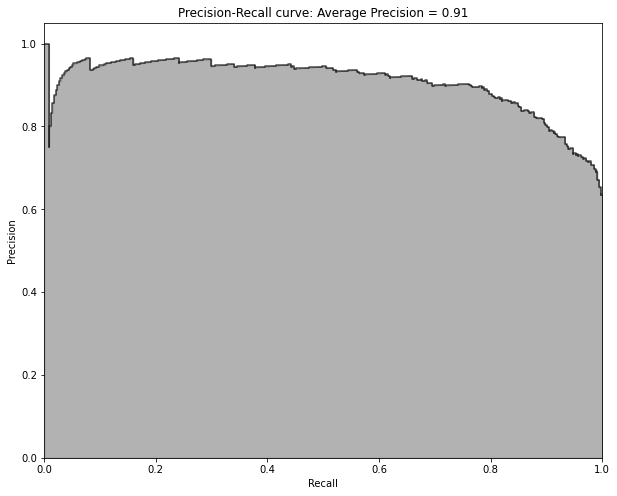

In [102]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:, 1]], axis = 1)

preds.columns = ['trueLabel', 'prediction']

predictionsBasedOnKFoldsXGBoostGradientBoosting = preds.copy()

precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])

average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

fig, ax = plt.subplots(figsize=(10, 8))

plt.step(recall, precision, color = 'k', alpha = 0.7, where = 'post') 

plt.fill_between(recall, precision, step = 'post', alpha = 0.3, color = 'k')

plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Precision-Recall curve: Average Precision = {0:0.2f}'.format(average_precision))

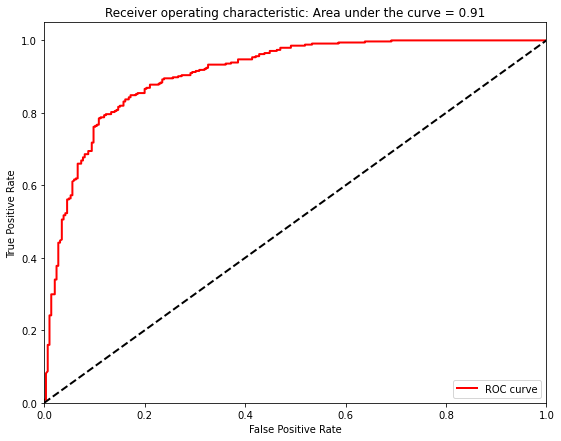

In [103]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'],preds['prediction']) 

areaUnderROC = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(9, 7))

#plt.figure()
plt.plot(fpr, tpr, color='r', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic: Area under the curve = {0:0.2f}'.format(areaUnderROC)) 

plt.legend(loc="lower right") 

#plt.show()

In [ ]:
# Model #4: Gradient Boosting Machine (LightGBM)

In [107]:
params_lightGB = {
'task': 'train',
'application':'binary', 
'num_class':1,
'boosting': 'gbdt',
'objective': 'binary',
'metric': 'binary_logloss',
'metric_freq':50,
'is_training_metric':False,
'max_depth':4,
'num_leaves': 31,
'learning_rate': 0.01,
'feature_fraction': 1.0,
'bagging_fraction': 1.0,
'bagging_freq': 0,
'bagging_seed': 2018,
'verbose': 0,
'num_threads':16
}

In [108]:
# Train the model

trainingScores = [] 
cvScores = []
predictionsBasedOnKFolds = pd.DataFrame(data=[], index=y_train.index, columns=[0,1])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_train.iloc[train_index,:], X_train.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]

    lgb_train = lgb.Dataset(X_train_fold, y_train_fold) 
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration)) 
    trainingScores.append(loglossTraining)
    
    predictionsBasedOnKFolds.loc[X_cv_fold.index, 1] = gbm.predict(X_cv_fold, num_iteration=gbm.best_iteration) 
    
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFolds.loc[X_cv_fold.index, 1])  
    
    cvScores.append(loglossCV)

    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001040 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.682722
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.67696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.671318
[LightGBM] [Warning] No fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's binary_logloss: 0.392456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's binary_logloss: 0.391388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's binary_logloss: 0.390425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's binary_logloss: 0.389156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's binary_logloss: 0.388224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's binary_logloss: 0.38731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's binary_logloss: 0.386097
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's binary_logloss: 0.385211
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[194]	valid_0's binary_logloss: 0.329635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's binary_logloss: 0.329088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's binary_logloss: 0.328625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's binary_logloss: 0.32811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's binary_logloss: 0.327503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's binary_logloss: 0.327012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's binary_logloss: 0.326419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's binary_logloss: 0.325904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's binary_logloss: 0.325324
[LightGBM] [Warning] No further 

[281]	valid_0's binary_logloss: 0.308227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[282]	valid_0's binary_logloss: 0.308063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[283]	valid_0's binary_logloss: 0.307955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's binary_logloss: 0.307821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's binary_logloss: 0.307657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's binary_logloss: 0.307555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's binary_logloss: 0.307459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's binary_logloss: 0.30729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's binary_logloss: 0.307268
[LightGBM] [Warning] No further 

[369]	valid_0's binary_logloss: 0.301483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's binary_logloss: 0.301459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's binary_logloss: 0.301249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's binary_logloss: 0.301197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's binary_logloss: 0.301115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's binary_logloss: 0.301212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's binary_logloss: 0.301301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's binary_logloss: 0.301078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's binary_logloss: 0.300901
[LightGBM] [Warning] No further

[458]	valid_0's binary_logloss: 0.301577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's binary_logloss: 0.301623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's binary_logloss: 0.301828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's binary_logloss: 0.301872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's binary_logloss: 0.30192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's binary_logloss: 0.301968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's binary_logloss: 0.302172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's binary_logloss: 0.302218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's binary_logloss: 0.302056
[LightGBM] [Warning] No further 

[547]	valid_0's binary_logloss: 0.302493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's binary_logloss: 0.302563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's binary_logloss: 0.302653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's binary_logloss: 0.302643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's binary_logloss: 0.302702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's binary_logloss: 0.302772
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's binary_logloss: 0.302552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's binary_logloss: 0.302552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[555]	valid_0's binary_logloss: 0.302624
[LightGBM] [Warning] No further

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683861
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.67909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.67442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's bi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's binary_logloss: 0.443647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's binary_logloss: 0.443465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's binary_logloss: 0.442787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's binary_logloss: 0.442523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's binary_logloss: 0.442419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's binary_logloss: 0.441763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's binary_logloss: 0.441513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's binary_logloss: 0.441331
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[216]	valid_0's binary_logloss: 0.424582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[217]	valid_0's binary_logloss: 0.424827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[218]	valid_0's binary_logloss: 0.424716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[219]	valid_0's binary_logloss: 0.424166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[220]	valid_0's binary_logloss: 0.424063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[221]	valid_0's binary_logloss: 0.423966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[222]	valid_0's binary_logloss: 0.423874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[223]	valid_0's binary_logloss: 0.423557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[224]	valid_0's binary_logloss: 0.423477
[LightGBM] [Warning] No further

[366]	valid_0's binary_logloss: 0.4147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's binary_logloss: 0.41475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[368]	valid_0's binary_logloss: 0.414578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's binary_logloss: 0.414469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's binary_logloss: 0.414617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's binary_logloss: 0.414678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's binary_logloss: 0.414641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's binary_logloss: 0.414467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's binary_logloss: 0.414735
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's binary_logloss: 0.417591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's binary_logloss: 0.417774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's binary_logloss: 0.417877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's binary_logloss: 0.418133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's binary_logloss: 0.418391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's binary_logloss: 0.418379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's binary_logloss: 0.418478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's binary_logloss: 0.418818
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[537]	valid_0's binary_logloss: 0.425515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[538]	valid_0's binary_logloss: 0.425479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[539]	valid_0's binary_logloss: 0.425326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[540]	valid_0's binary_logloss: 0.425661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[541]	valid_0's binary_logloss: 0.425762
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[542]	valid_0's binary_logloss: 0.425717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[543]	valid_0's binary_logloss: 0.425557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[544]	valid_0's binary_logloss: 0.425523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[545]	valid_0's binary_logloss: 0.425293
[LightGBM] [Warning] No further

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[63]	valid_0's binary_logloss: 0.471483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's binary_logloss: 0.469065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	valid_0's binary_logloss: 0.46709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	valid_0's binary_logloss: 0.464805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	valid_0's binary_logloss: 0.462592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	valid_0's binary_logloss: 0.460792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's binary_logloss: 0.458528
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's binary_logloss: 0.456396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's binary_logloss: 0.454191
[LightGBM] [Warning] No further splits wi

[143]	valid_0's binary_logloss: 0.350745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's binary_logloss: 0.349903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's binary_logloss: 0.349055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's binary_logloss: 0.348257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's binary_logloss: 0.347442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's binary_logloss: 0.346542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's binary_logloss: 0.345776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's binary_logloss: 0.34511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's binary_logloss: 0.3443
[LightGBM] [Warning] No further sp

[224]	valid_0's binary_logloss: 0.300738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[225]	valid_0's binary_logloss: 0.300484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[226]	valid_0's binary_logloss: 0.300005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's binary_logloss: 0.299553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's binary_logloss: 0.299148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's binary_logloss: 0.298911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's binary_logloss: 0.29849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's binary_logloss: 0.298074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's binary_logloss: 0.297687
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's binary_logloss: 0.274981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's binary_logloss: 0.274717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's binary_logloss: 0.274587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's binary_logloss: 0.274349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's binary_logloss: 0.274093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's binary_logloss: 0.27384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's binary_logloss: 0.273924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's binary_logloss: 0.273649
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[408]	valid_0's binary_logloss: 0.264803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's binary_logloss: 0.264585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's binary_logloss: 0.264368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's binary_logloss: 0.264572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's binary_logloss: 0.264447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's binary_logloss: 0.264236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[414]	valid_0's binary_logloss: 0.264376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's binary_logloss: 0.264165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[416]	valid_0's binary_logloss: 0.264019
[LightGBM] [Warning] No further

[493]	valid_0's binary_logloss: 0.264487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[494]	valid_0's binary_logloss: 0.264423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[495]	valid_0's binary_logloss: 0.264654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[496]	valid_0's binary_logloss: 0.264687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's binary_logloss: 0.2646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's binary_logloss: 0.264654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's binary_logloss: 0.264626
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's binary_logloss: 0.264506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's binary_logloss: 0.264741
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's binary_logloss: 0.270586
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's binary_logloss: 0.270589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's binary_logloss: 0.270566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's binary_logloss: 0.270575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's binary_logloss: 0.270605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's binary_logloss: 0.270644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's binary_logloss: 0.270648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's binary_logloss: 0.270679
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[39]	valid_0's binary_logloss: 0.551013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's binary_logloss: 0.548554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's binary_logloss: 0.546429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's binary_logloss: 0.544147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's binary_logloss: 0.54181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's binary_logloss: 0.539714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's binary_logloss: 0.537678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's binary_logloss: 0.535612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's binary_logloss: 0.53344
[LightGBM] [Warning] No further splits wi

[146]	valid_0's binary_logloss: 0.434102
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's binary_logloss: 0.433819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's binary_logloss: 0.433239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's binary_logloss: 0.432975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's binary_logloss: 0.432415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's binary_logloss: 0.432172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's binary_logloss: 0.431632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's binary_logloss: 0.431425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's binary_logloss: 0.431211
[LightGBM] [Warning] No further

[262]	valid_0's binary_logloss: 0.399793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[263]	valid_0's binary_logloss: 0.399708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[264]	valid_0's binary_logloss: 0.399628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[265]	valid_0's binary_logloss: 0.399218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[266]	valid_0's binary_logloss: 0.398672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[267]	valid_0's binary_logloss: 0.399139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[268]	valid_0's binary_logloss: 0.399371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's binary_logloss: 0.399541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's binary_logloss: 0.399054
[LightGBM] [Warning] No further

[372]	valid_0's binary_logloss: 0.405789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's binary_logloss: 0.405597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's binary_logloss: 0.40609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's binary_logloss: 0.406173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's binary_logloss: 0.406193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's binary_logloss: 0.406538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	valid_0's binary_logloss: 0.407041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[379]	valid_0's binary_logloss: 0.407365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	valid_0's binary_logloss: 0.407857
[LightGBM] [Warning] No further 

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683847
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.678516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.6733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's bi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's binary_logloss: 0.427533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's binary_logloss: 0.426606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[104]	valid_0's binary_logloss: 0.425681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's binary_logloss: 0.425034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's binary_logloss: 0.423965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's binary_logloss: 0.423253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's binary_logloss: 0.422441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's binary_logloss: 0.421411
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[237]	valid_0's binary_logloss: 0.360332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's binary_logloss: 0.360263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's binary_logloss: 0.360291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's binary_logloss: 0.359869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's binary_logloss: 0.359994
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's binary_logloss: 0.359579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's binary_logloss: 0.359721
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's binary_logloss: 0.359352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's binary_logloss: 0.359197
[LightGBM] [Warning] No further

[368]	valid_0's binary_logloss: 0.347604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's binary_logloss: 0.347836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's binary_logloss: 0.348043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's binary_logloss: 0.34795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's binary_logloss: 0.348117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's binary_logloss: 0.348189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's binary_logloss: 0.348031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's binary_logloss: 0.347887
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's binary_logloss: 0.347966
[LightGBM] [Warning] No further 

[449]	valid_0's binary_logloss: 0.349061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's binary_logloss: 0.349388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's binary_logloss: 0.349258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's binary_logloss: 0.34922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's binary_logloss: 0.349393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's binary_logloss: 0.34933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's binary_logloss: 0.349539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's binary_logloss: 0.349487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's binary_logloss: 0.349806
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[535]	valid_0's binary_logloss: 0.355549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[536]	valid_0's binary_logloss: 0.355605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[537]	valid_0's binary_logloss: 0.355617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[538]	valid_0's binary_logloss: 0.355714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[539]	valid_0's binary_logloss: 0.355718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[540]	valid_0's binary_logloss: 0.355981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[541]	valid_0's binary_logloss: 0.356008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[542]	valid_0's binary_logloss: 0.356106
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

In [109]:
# Evaluate the results

loglossLightGBMGradientBoosting = log_loss(y_train, predictionsBasedOnKFolds.loc[:, 1])

print('LightGBM gradient boosting Log Loss: ', loglossLightGBMGradientBoosting)

LightGBM gradient boosting Log Loss:  0.344438588253126


Text(0.5, 1.0, 'Precision-Recall curve: Average Precision = 0.93')

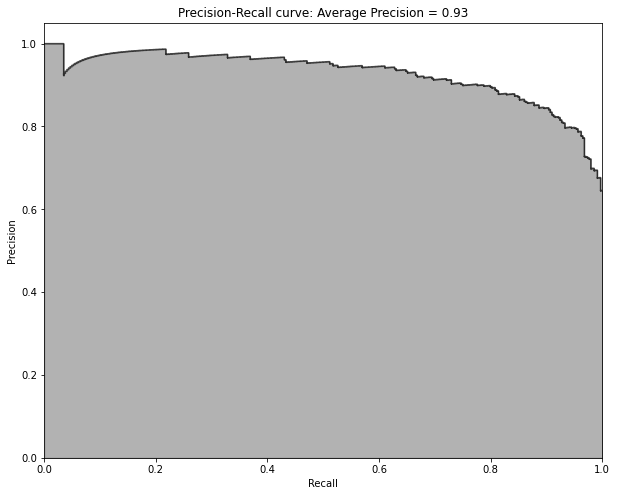

In [110]:
preds = pd.concat([y_train, predictionsBasedOnKFolds.loc[:, 1]], axis = 1)

preds.columns = ['trueLabel','prediction']

predictionsBasedOnKFoldsLightGBMGradientBoosting = preds.copy()

precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])

average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

fig, ax = plt.subplots(figsize=(10, 8))

plt.step(recall, precision, color = 'k', alpha = 0.7, where = 'post') 

plt.fill_between(recall, precision, step = 'post', alpha = 0.3, color = 'k')

plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Precision-Recall curve: Average Precision = {0:0.2f}'.format(average_precision))

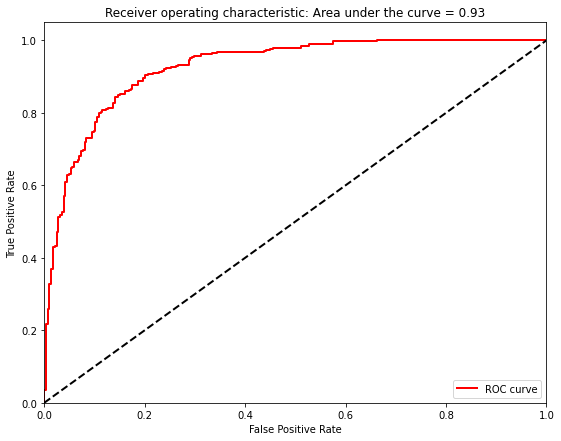

In [111]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'],preds['prediction']) 

areaUnderROC = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(9, 7))

plt.plot(fpr, tpr, color='r', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic: Area under the curve = {0:0.2f}'.format(areaUnderROC)) 

plt.legend(loc="lower right") 

#plt.show()

In [ ]:
# Evaluation of the Four Models Using the Test Set

In [112]:
predictionsTestSetLogisticRegression = pd.DataFrame(data=[], index=y_test.index, columns= ['prediction'])
predictionsTestSetLogisticRegression.loc[:,'prediction'] = logReg.predict_proba(X_test)[:,1]
logLossTestSetLogisticRegression = log_loss(y_test, predictionsTestSetLogisticRegression) 

logLossTestSetLogisticRegression

0.403727265739237

In [113]:
predictionsTestSetRandomForests = pd.DataFrame(data=[],index=y_test.index, columns= ['prediction'])
predictionsTestSetRandomForests.loc[:,'prediction'] = RFC.predict_proba(X_test)[:,1]
logLossTestSetRandomForests = log_loss(y_test, predictionsTestSetRandomForests) 

logLossTestSetRandomForests

0.6663361792526216

In [114]:
predictionsTestSetXGBoostGradientBoosting = pd.DataFrame(data=[],index=y_test.index, columns= ['prediction'])
dtest = xgb.DMatrix(data=X_test)
predictionsTestSetXGBoostGradientBoosting.loc[:,'prediction'] = bst.predict(dtest)
logLossTestSetXGBoostGradientBoosting = log_loss(y_test, predictionsTestSetXGBoostGradientBoosting)

logLossTestSetXGBoostGradientBoosting

0.30166867188419455

Text(0.5, 1.0, 'Precision-Recall curve: Average Precision = 0.94')

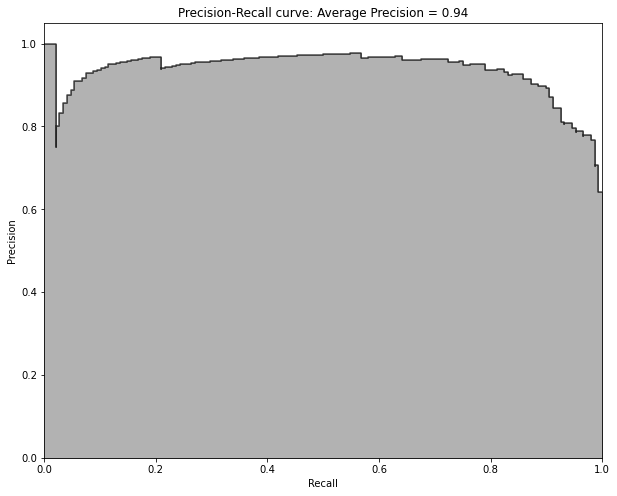

In [120]:
preds = pd.concat([y_test, predictionsTestSetXGBoostGradientBoosting], axis = 1)

preds.columns = ['trueLabel', 'prediction']

predictionsBasedOnKFoldsXGBoostGradientBoosting = preds.copy()

precision, recall, thresholds = precision_recall_curve(preds['trueLabel'], preds['prediction'])

average_precision = average_precision_score(preds['trueLabel'], preds['prediction'])

fig, ax = plt.subplots(figsize=(10, 8))

plt.step(recall, precision, color = 'k', alpha = 0.7, where = 'post') 

plt.fill_between(recall, precision, step = 'post', alpha = 0.3, color = 'k')

plt.xlabel('Recall')
plt.ylabel('Precision')

plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])

plt.title('Precision-Recall curve: Average Precision = {0:0.2f}'.format(average_precision))

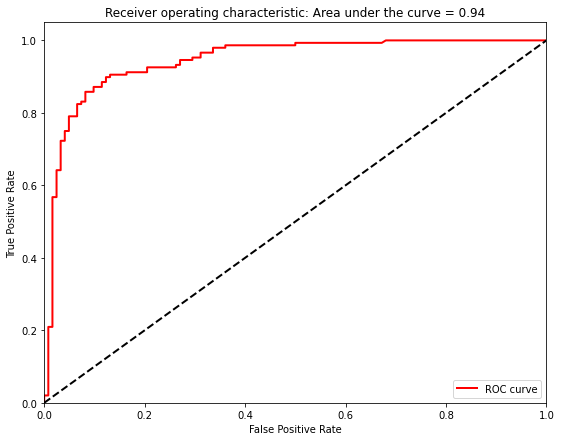

In [121]:
fpr, tpr, thresholds = roc_curve(preds['trueLabel'],preds['prediction']) 

areaUnderROC = auc(fpr, tpr)

fig, ax = plt.subplots(figsize=(9, 7))

plt.plot(fpr, tpr, color='r', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='k', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic: Area under the curve = {0:0.2f}'.format(areaUnderROC)) 

plt.legend(loc="lower right") 

#plt.show()

In [122]:
predictionsTestSetLightGBMGradientBoosting = pd.DataFrame(data=[],index=y_test.index, columns= ['prediction'])
predictionsTestSetLightGBMGradientBoosting.loc[:,'prediction'] = gbm.predict(X_test, num_iteration=gbm.best_iteration) 
logLossTestSetLightGBMGradientBoosting = log_loss(y_test, predictionsTestSetLightGBMGradientBoosting)

logLossTestSetLightGBMGradientBoosting

0.30919593771670906

In [ ]:
'''
PK:

XGB gradient boosting has the lowest log loss on the test set, followed by the rest.

'''

In [ ]:
# Stacking Ensemble

In [144]:
# Test 1

# Combine layer one predictions with the original training dataset

predictionsBasedOnKFoldsFourModels = pd.DataFrame(data = [], index = y_train.index)

predictionsBasedOnKFoldsFourModels = predictionsBasedOnKFoldsFourModels.join(
predictionsBasedOnKFoldsLogisticRegression['prediction'].astype(float), how='left').join(
predictionsBasedOnKFoldsRandomForests['prediction'].astype(float), how='left',rsuffix="2").join(
predictionsBasedOnKFoldsXGBoostGradientBoosting['prediction'].astype(float), how='left',rsuffix="3").join(
predictionsBasedOnKFoldsLightGBMGradientBoosting['prediction'].astype(float), how='left',rsuffix="4")

predictionsBasedOnKFoldsFourModels.columns = ['predsLR','predsRF','predsXGB','predsLightGBM']

X_trainWithPredictions = X_train.merge(predictionsBasedOnKFoldsFourModels, left_index=True,right_index=True)

In [147]:
# Train the model

trainingScores = [] 
cvScores = []

predictionsBasedOnKFoldsEnsemble = pd.DataFrame(data=[],index=y_train.index,columns= ['prediction'])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_trainWithPredictions.iloc[train_index,:], X_trainWithPredictions.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    lgb_train = lgb.Dataset(X_train_fold, y_train_fold) 
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration)) 
    trainingScores.append(loglossTraining)
    
    
    predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'] = gbm.predict(X_cv_fold, 
                                                                                      num_iteration=gbm.best_iteration) 
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'])
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000971 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.682124
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.675803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.669576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's 

[94]	valid_0's binary_logloss: 0.405278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's binary_logloss: 0.404085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's binary_logloss: 0.402881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's binary_logloss: 0.401802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's binary_logloss: 0.400451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's binary_logloss: 0.399113
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's binary_logloss: 0.397858
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's binary_logloss: 0.396559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's binary_logloss: 0.395365
[LightGBM] [Warning] No further split

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's binary_logloss: 0.340191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's binary_logloss: 0.339915
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's binary_logloss: 0.339519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's binary_logloss: 0.339284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's binary_logloss: 0.339054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's binary_logloss: 0.338683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's binary_logloss: 0.338464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's binary_logloss: 0.338251
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's binary_logloss: 0.327784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's binary_logloss: 0.327813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's binary_logloss: 0.32781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's binary_logloss: 0.327843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's binary_logloss: 0.327938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's binary_logloss: 0.327976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[310]	valid_0's binary_logloss: 0.328006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's binary_logloss: 0.32816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's binary_logloss: 0.328817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's binary_logloss: 0.328894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's binary_logloss: 0.32883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	valid_0's binary_logloss: 0.328911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	valid_0's binary_logloss: 0.328671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	valid_0's binary_logloss: 0.328582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	valid_0's binary_logloss: 0.328523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	valid_0's binary_logloss: 0.328464
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[541]	valid_0's binary_logloss: 0.329513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[542]	valid_0's binary_logloss: 0.329329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[543]	valid_0's binary_logloss: 0.329273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[544]	valid_0's binary_logloss: 0.329205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[545]	valid_0's binary_logloss: 0.32906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's binary_logloss: 0.329471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's binary_logloss: 0.329614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's binary_logloss: 0.329715
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's binary_logloss: 0.329659
[LightGBM] [Warning] No further 

[613]	valid_0's binary_logloss: 0.329671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	valid_0's binary_logloss: 0.3296
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[615]	valid_0's binary_logloss: 0.329615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[616]	valid_0's binary_logloss: 0.329638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's binary_logloss: 0.32958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's binary_logloss: 0.329572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's binary_logloss: 0.329383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's binary_logloss: 0.329407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's binary_logloss: 0.329224
[LightGBM] [Warning] No further sp

Training Log Loss:  0.19929547244968468
CV Log Loss:  0.32703729695659645
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683639
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.67881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.674091
[LightGBM] [Warn

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[56]	valid_0's binary_logloss: 0.525588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's binary_logloss: 0.524165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's binary_logloss: 0.522728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0's binary_logloss: 0.521163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's binary_logloss: 0.51973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	valid_0's binary_logloss: 0.518421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	valid_0's binary_logloss: 0.517056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	valid_0's binary_logloss: 0.515783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's binary_logloss: 0.514527
[LightGBM] [Warning] No further splits wi

[130]	valid_0's binary_logloss: 0.473205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's binary_logloss: 0.473118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's binary_logloss: 0.473077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's binary_logloss: 0.473104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's binary_logloss: 0.473126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's binary_logloss: 0.473049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's binary_logloss: 0.472885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's binary_logloss: 0.473021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's binary_logloss: 0.472895
[LightGBM] [Warning] No further

[268]	valid_0's binary_logloss: 0.478906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's binary_logloss: 0.479274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's binary_logloss: 0.479694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[271]	valid_0's binary_logloss: 0.47977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's binary_logloss: 0.48026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's binary_logloss: 0.480427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[274]	valid_0's binary_logloss: 0.480257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[275]	valid_0's binary_logloss: 0.480628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[276]	valid_0's binary_logloss: 0.480893
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.484893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.484832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.484313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.484452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.484503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.48399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.484267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's binary_logloss: 0.483781
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[56]	valid_0's binary_logloss: 0.48587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's binary_logloss: 0.483473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's binary_logloss: 0.481389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0's binary_logloss: 0.479162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's binary_logloss: 0.477176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	valid_0's binary_logloss: 0.474981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	valid_0's binary_logloss: 0.473066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	valid_0's binary_logloss: 0.470876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's binary_logloss: 0.469
[LightGBM] [Warning] No further splits with 

[179]	valid_0's binary_logloss: 0.346239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's binary_logloss: 0.345808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's binary_logloss: 0.3451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's binary_logloss: 0.344563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's binary_logloss: 0.343822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's binary_logloss: 0.343109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's binary_logloss: 0.342455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's binary_logloss: 0.342031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's binary_logloss: 0.341395
[LightGBM] [Warning] No further s

[322]	valid_0's binary_logloss: 0.306752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's binary_logloss: 0.306212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's binary_logloss: 0.306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's binary_logloss: 0.30547
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's binary_logloss: 0.30521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's binary_logloss: 0.304703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's binary_logloss: 0.304448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's binary_logloss: 0.30475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's binary_logloss: 0.304861
[LightGBM] [Warning] No further split

[394]	valid_0's binary_logloss: 0.303852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's binary_logloss: 0.303817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's binary_logloss: 0.304204
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's binary_logloss: 0.304178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's binary_logloss: 0.304568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's binary_logloss: 0.304719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's binary_logloss: 0.30495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's binary_logloss: 0.304999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's binary_logloss: 0.304964
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's binary_logloss: 0.309694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's binary_logloss: 0.309913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's binary_logloss: 0.31007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's binary_logloss: 0.309918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's binary_logloss: 0.310002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's binary_logloss: 0.310121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's binary_logloss: 0.310271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's binary_logloss: 0.31041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[548]	valid_0's binary_logloss: 0.316057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's binary_logloss: 0.31633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's binary_logloss: 0.316567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's binary_logloss: 0.316954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's binary_logloss: 0.317063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's binary_logloss: 0.317489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's binary_logloss: 0.317992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[555]	valid_0's binary_logloss: 0.318088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[556]	valid_0's binary_logloss: 0.31824
[LightGBM] [Warning] No further s

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[13]	valid_0's binary_logloss: 0.627187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	valid_0's binary_logloss: 0.623279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	valid_0's binary_logloss: 0.619151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	valid_0's binary_logloss: 0.615325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	valid_0's binary_logloss: 0.611357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	valid_0's binary_logloss: 0.607574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	valid_0's binary_logloss: 0.603844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's binary_logloss: 0.600002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's binary_logloss: 0.596529
[LightGBM] [Warning] No further splits 

[89]	valid_0's binary_logloss: 0.459501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's binary_logloss: 0.458466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's binary_logloss: 0.457219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's binary_logloss: 0.456226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's binary_logloss: 0.455096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's binary_logloss: 0.454144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's binary_logloss: 0.453093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's binary_logloss: 0.452075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's binary_logloss: 0.451062
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[209]	valid_0's binary_logloss: 0.408079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's binary_logloss: 0.408312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[211]	valid_0's binary_logloss: 0.408474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	valid_0's binary_logloss: 0.408713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[213]	valid_0's binary_logloss: 0.408958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[214]	valid_0's binary_logloss: 0.409126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[215]	valid_0's binary_logloss: 0.409376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[216]	valid_0's binary_logloss: 0.409514
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.438455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.438489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.438826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.438856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.439165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.439501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's binary_logloss: 0.439429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's binary_logloss: 0.439345
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683283
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.677396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.671635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	valid_0's binary_logloss: 0.464029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's binary_logloss: 0.462279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's binary_logloss: 0.460633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's binary_logloss: 0.458905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's binary_logloss: 0.457351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's binary_logloss: 0.455785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's binary_logloss: 0.454123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's binary_logloss: 0.45261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	v

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's binary_logloss: 0.389487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's binary_logloss: 0.38903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's binary_logloss: 0.388588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's binary_logloss: 0.388425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's binary_logloss: 0.387995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's binary_logloss: 0.387616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's binary_logloss: 0.387481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's binary_logloss: 0.387355
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[284]	valid_0's binary_logloss: 0.356949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's binary_logloss: 0.357074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's binary_logloss: 0.357201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's binary_logloss: 0.357361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's binary_logloss: 0.357493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's binary_logloss: 0.357627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's binary_logloss: 0.357629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's binary_logloss: 0.357767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's binary_logloss: 0.357773
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[365]	valid_0's binary_logloss: 0.360896
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[366]	valid_0's binary_logloss: 0.36098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's binary_logloss: 0.361184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[368]	valid_0's binary_logloss: 0.361164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's binary_logloss: 0.361193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's binary_logloss: 0.361179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's binary_logloss: 0.361169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's binary_logloss: 0.361061
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[439]	valid_0's binary_logloss: 0.359141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	valid_0's binary_logloss: 0.359203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	valid_0's binary_logloss: 0.358921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	valid_0's binary_logloss: 0.359262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	valid_0's binary_logloss: 0.359345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	valid_0's binary_logloss: 0.359601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's binary_logloss: 0.359399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's binary_logloss: 0.359669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's binary_logloss: 0.359766
[LightGBM] [Warning] No further

In [148]:
loglossEnsemble = log_loss(y_train, predictionsBasedOnKFoldsEnsemble.loc[:,'prediction']) 

print('Ensemble Log Loss: ', loglossEnsemble)

Ensemble Log Loss:  0.37238038943172885


In [ ]:
'''
PK:

We do not see an improvement. 
The ensemble log loss, 0.37238038943172885 is greater than 
the standalone LightGBM gradient boosting Log Loss, 0.344438588253126 on training. 

'''

In [123]:
# Test 2

# Combine layer one predictions with the original training dataset

predictionsBasedOnKFoldsFourModels = pd.DataFrame(data = [], index = y_train.index)

predictionsBasedOnKFoldsFourModels = predictionsBasedOnKFoldsFourModels.join(
predictionsBasedOnKFoldsLogisticRegression['prediction'].astype(float), how='left').join(
predictionsBasedOnKFoldsRandomForests['prediction'].astype(float), how='left',rsuffix="2").join(

predictionsBasedOnKFoldsLightGBMGradientBoosting['prediction'].astype(float), how='left',rsuffix="3")

predictionsBasedOnKFoldsFourModels.columns = ['predsLR', 'predsRF', 'predsLightGBM']

X_trainWithPredictions = X_train.merge(predictionsBasedOnKFoldsFourModels, left_index=True,right_index=True)

In [124]:
# Train the model

trainingScores = [] 
cvScores = []

predictionsBasedOnKFoldsEnsemble = pd.DataFrame(data=[],index=y_train.index,columns= ['prediction'])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_trainWithPredictions.iloc[train_index,:], X_trainWithPredictions.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    lgb_train = lgb.Dataset(X_train_fold, y_train_fold) 
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration)) 
    trainingScores.append(loglossTraining)
    
    
    predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'] = gbm.predict(X_cv_fold, 
                                                                                      num_iteration=gbm.best_iteration) 
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'])
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000541 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.682167
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.675888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.669663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's 

[70]	valid_0's binary_logloss: 0.439414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's binary_logloss: 0.437491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's binary_logloss: 0.435574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's binary_logloss: 0.43366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's binary_logloss: 0.43185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's binary_logloss: 0.430043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's binary_logloss: 0.428299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's binary_logloss: 0.42659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's binary_logloss: 0.424786
[LightGBM] [Warning] No further splits with

[193]	valid_0's binary_logloss: 0.335901
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's binary_logloss: 0.335668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's binary_logloss: 0.335445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's binary_logloss: 0.335458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's binary_logloss: 0.335036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's binary_logloss: 0.334824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's binary_logloss: 0.334528
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's binary_logloss: 0.334559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's binary_logloss: 0.334535
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[266]	valid_0's binary_logloss: 0.329379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[267]	valid_0's binary_logloss: 0.329195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[268]	valid_0's binary_logloss: 0.329239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's binary_logloss: 0.329257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's binary_logloss: 0.32908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[271]	valid_0's binary_logloss: 0.329245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's binary_logloss: 0.329332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's binary_logloss: 0.329386
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's binary_logloss: 0.332141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.332146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.332155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.332206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.332147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.332199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.332152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.332303
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[427]	valid_0's binary_logloss: 0.337099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[428]	valid_0's binary_logloss: 0.336745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[429]	valid_0's binary_logloss: 0.336754
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[430]	valid_0's binary_logloss: 0.336714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[431]	valid_0's binary_logloss: 0.33678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's binary_logloss: 0.336689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's binary_logloss: 0.336563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's binary_logloss: 0.336583
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[6]	valid_0's binary_logloss: 0.660598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's binary_logloss: 0.656164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's binary_logloss: 0.651854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's binary_logloss: 0.647637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	valid_0's binary_logloss: 0.643485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	valid_0's binary_logloss: 0.639421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	valid_0's binary_logloss: 0.635473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	valid_0's binary_logloss: 0.63158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	valid_0's binary_logloss: 0.627935
[LightGBM] [Warning] No further splits with p

[88]	valid_0's binary_logloss: 0.491997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's binary_logloss: 0.491039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's binary_logloss: 0.490213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's binary_logloss: 0.48936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's binary_logloss: 0.488573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's binary_logloss: 0.487756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's binary_logloss: 0.487018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's binary_logloss: 0.486237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's binary_logloss: 0.485409
[LightGBM] [Warning] No further splits wi

[179]	valid_0's binary_logloss: 0.474473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's binary_logloss: 0.474844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's binary_logloss: 0.475123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's binary_logloss: 0.475492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's binary_logloss: 0.475751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's binary_logloss: 0.476199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's binary_logloss: 0.476538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's binary_logloss: 0.476882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's binary_logloss: 0.477302
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[263]	valid_0's binary_logloss: 0.492117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[264]	valid_0's binary_logloss: 0.492382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[265]	valid_0's binary_logloss: 0.492485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[266]	valid_0's binary_logloss: 0.492718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[267]	valid_0's binary_logloss: 0.49276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[268]	valid_0's binary_logloss: 0.493103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's binary_logloss: 0.493215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's binary_logloss: 0.493229
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[346]	valid_0's binary_logloss: 0.504265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's binary_logloss: 0.504582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's binary_logloss: 0.505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.505171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.505584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.505335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.506096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.506345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.506259
[LightGBM] [Warning] No further sp

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[28]	valid_0's binary_logloss: 0.56339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	valid_0's binary_logloss: 0.559876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's binary_logloss: 0.556576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	valid_0's binary_logloss: 0.553189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	valid_0's binary_logloss: 0.550137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	valid_0's binary_logloss: 0.546982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	valid_0's binary_logloss: 0.543743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	valid_0's binary_logloss: 0.540685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	valid_0's binary_logloss: 0.537855
[LightGBM] [Warning] No further splits wi

[156]	valid_0's binary_logloss: 0.359021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's binary_logloss: 0.35829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's binary_logloss: 0.357537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's binary_logloss: 0.356895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's binary_logloss: 0.356336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's binary_logloss: 0.355765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's binary_logloss: 0.355075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's binary_logloss: 0.35452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's binary_logloss: 0.353971
[LightGBM] [Warning] No further s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[278]	valid_0's binary_logloss: 0.310913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[279]	valid_0's binary_logloss: 0.310825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[280]	valid_0's binary_logloss: 0.310578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[281]	valid_0's binary_logloss: 0.310429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[282]	valid_0's binary_logloss: 0.31023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[283]	valid_0's binary_logloss: 0.310086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's binary_logloss: 0.309861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's binary_logloss: 0.309721
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[355]	valid_0's binary_logloss: 0.300686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.300769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's binary_logloss: 0.300735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's binary_logloss: 0.300793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's binary_logloss: 0.30118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's binary_logloss: 0.301152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's binary_logloss: 0.301546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's binary_logloss: 0.301824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[363]	valid_0's binary_logloss: 0.3018
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	valid_0's binary_logloss: 0.302746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	valid_0's binary_logloss: 0.302717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	valid_0's binary_logloss: 0.302625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	valid_0's binary_logloss: 0.302522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's binary_logloss: 0.302614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's binary_logloss: 0.302583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's binary_logloss: 0.302689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's binary_logloss: 0.303022
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[523]	valid_0's binary_logloss: 0.304233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's binary_logloss: 0.304341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's binary_logloss: 0.304486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	valid_0's binary_logloss: 0.304446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[527]	valid_0's binary_logloss: 0.304608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	valid_0's binary_logloss: 0.304799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[529]	valid_0's binary_logloss: 0.30474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[530]	valid_0's binary_logloss: 0.304685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[531]	valid_0's binary_logloss: 0.304629
[LightGBM] [Warning] No further 

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683059
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.677633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.672347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's binary_logloss: 0.667153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's binary_logloss: 0.662091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's binary_logloss: 0.657116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's binary_logloss: 0.652315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's binary_logloss: 0.647545
[LightGBM] [Warning] No fu

[135]	valid_0's binary_logloss: 0.423477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's binary_logloss: 0.423037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's binary_logloss: 0.422374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's binary_logloss: 0.421702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's binary_logloss: 0.421724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's binary_logloss: 0.420974
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's binary_logloss: 0.420305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's binary_logloss: 0.420234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's binary_logloss: 0.419672
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's binary_logloss: 0.405613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's binary_logloss: 0.405719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's binary_logloss: 0.405938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's binary_logloss: 0.406021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's binary_logloss: 0.406145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's binary_logloss: 0.406252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's binary_logloss: 0.406378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[259]	valid_0's binary_logloss: 0.406628
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[354]	valid_0's binary_logloss: 0.430176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.430312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.430526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's binary_logloss: 0.431108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's binary_logloss: 0.431238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's binary_logloss: 0.431795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's binary_logloss: 0.432102
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's binary_logloss: 0.432784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's binary_logloss: 0.432999
[LightGBM] [Warning] No further

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[36]	valid_0's binary_logloss: 0.537947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	valid_0's binary_logloss: 0.535183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	valid_0's binary_logloss: 0.532189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	valid_0's binary_logloss: 0.529259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's binary_logloss: 0.526493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's binary_logloss: 0.52364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's binary_logloss: 0.520863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's binary_logloss: 0.518244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's binary_logloss: 0.515663
[LightGBM] [Warning] No further splits w

[131]	valid_0's binary_logloss: 0.395931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's binary_logloss: 0.395446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's binary_logloss: 0.394857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's binary_logloss: 0.394297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's binary_logloss: 0.393717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's binary_logloss: 0.393187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's binary_logloss: 0.392495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's binary_logloss: 0.392072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's binary_logloss: 0.391578
[LightGBM] [Warning] No further

[220]	valid_0's binary_logloss: 0.378249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[221]	valid_0's binary_logloss: 0.378081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[222]	valid_0's binary_logloss: 0.377917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[223]	valid_0's binary_logloss: 0.378046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[224]	valid_0's binary_logloss: 0.37789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[225]	valid_0's binary_logloss: 0.377852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[226]	valid_0's binary_logloss: 0.377697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's binary_logloss: 0.377567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's binary_logloss: 0.377383
[LightGBM] [Warning] No further 

[352]	valid_0's binary_logloss: 0.379937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.379943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.380028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.379842
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.380055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's binary_logloss: 0.379996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's binary_logloss: 0.380133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's binary_logloss: 0.380475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's binary_logloss: 0.380782
[LightGBM] [Warning] No further

[427]	valid_0's binary_logloss: 0.383961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[428]	valid_0's binary_logloss: 0.38417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[429]	valid_0's binary_logloss: 0.384134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[430]	valid_0's binary_logloss: 0.384055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[431]	valid_0's binary_logloss: 0.384246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's binary_logloss: 0.384214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's binary_logloss: 0.384424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's binary_logloss: 0.384503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's binary_logloss: 0.384427
Early stopping, best iteration i

In [125]:
loglossEnsemble = log_loss(y_train, predictionsBasedOnKFoldsEnsemble.loc[:,'prediction']) 

print('Ensemble Log Loss: ', loglossEnsemble)

Ensemble Log Loss:  0.3755397180166103


In [126]:
# Test 3

# Combine layer one predictions with the original training dataset

predictionsBasedOnKFoldsFourModels = pd.DataFrame(data = [], index = y_train.index)

predictionsBasedOnKFoldsFourModels = predictionsBasedOnKFoldsFourModels.join(
predictionsBasedOnKFoldsLogisticRegression['prediction'].astype(float), how='left').join(
predictionsBasedOnKFoldsRandomForests['prediction'].astype(float), how='left',rsuffix="2").join(

predictionsBasedOnKFoldsXGBoostGradientBoosting['prediction'].astype(float), how='left',rsuffix="3")
    
predictionsBasedOnKFoldsFourModels.columns = ['predsLR', 'predsRF', 'predsXGB']

X_trainWithPredictions = X_train.merge(predictionsBasedOnKFoldsFourModels, left_index=True,right_index=True)

In [127]:
# Train the model

trainingScores = [] 
cvScores = []

predictionsBasedOnKFoldsEnsemble = pd.DataFrame(data=[],index=y_train.index,columns= ['prediction'])

for train_index, cv_index in k_fold.split(np.zeros(len(X_train)), y_train.ravel()):
    X_train_fold, X_cv_fold = X_trainWithPredictions.iloc[train_index,:], X_trainWithPredictions.iloc[cv_index,:]
    y_train_fold, y_cv_fold = y_train.iloc[train_index], y_train.iloc[cv_index]
    
    lgb_train = lgb.Dataset(X_train_fold, y_train_fold) 
    lgb_eval = lgb.Dataset(X_cv_fold, y_cv_fold, reference=lgb_train)
    gbm = lgb.train(params_lightGB, lgb_train, num_boost_round=2000, valid_sets=lgb_eval, early_stopping_rounds=200)
    loglossTraining = log_loss(y_train_fold, gbm.predict(X_train_fold, num_iteration=gbm.best_iteration)) 
    trainingScores.append(loglossTraining)
    
    
    predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'] = gbm.predict(X_cv_fold, 
                                                                                      num_iteration=gbm.best_iteration) 
    loglossCV = log_loss(y_cv_fold, predictionsBasedOnKFoldsEnsemble.loc[X_cv_fold.index,'prediction'])
    cvScores.append(loglossCV)
    
    print('Training Log Loss: ', loglossTraining) 
    print('CV Log Loss: ', loglossCV)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000524 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.682689
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.676896
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.671223
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's binary_logloss: 0.447332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's binary_logloss: 0.445516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's binary_logloss: 0.443764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's binary_logloss: 0.441829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's binary_logloss: 0.440203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's binary_logloss: 0.438444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's binary_logloss: 0.436719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's binary_logloss: 0.435099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's binary_logloss: 0.365934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's binary_logloss: 0.365123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's binary_logloss: 0.364395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's binary_logloss: 0.36368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's binary_logloss: 0.362977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's binary_logloss: 0.362216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's binary_logloss: 0.361539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's binary_logloss: 0.360713
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[235]	valid_0's binary_logloss: 0.32095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's binary_logloss: 0.320617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's binary_logloss: 0.32029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's binary_logloss: 0.319912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's binary_logloss: 0.319519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's binary_logloss: 0.319202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's binary_logloss: 0.31884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's binary_logloss: 0.318531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's binary_logloss: 0.318291
[LightGBM] [Warning] No further sp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's binary_logloss: 0.304802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's binary_logloss: 0.304675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's binary_logloss: 0.304701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's binary_logloss: 0.304648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's binary_logloss: 0.304688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's binary_logloss: 0.304602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's binary_logloss: 0.30461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's binary_logloss: 0.304528
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's binary_logloss: 0.305632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's binary_logloss: 0.305668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's binary_logloss: 0.305641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's binary_logloss: 0.305607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's binary_logloss: 0.305695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's binary_logloss: 0.30558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's binary_logloss: 0.305526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's binary_logloss: 0.305721
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[545]	valid_0's binary_logloss: 0.308619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's binary_logloss: 0.308566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's binary_logloss: 0.308684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's binary_logloss: 0.30899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's binary_logloss: 0.309146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's binary_logloss: 0.309019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's binary_logloss: 0.309037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's binary_logloss: 0.309003
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[8]	valid_0's binary_logloss: 0.650619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's binary_logloss: 0.646338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	valid_0's binary_logloss: 0.642109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	valid_0's binary_logloss: 0.638008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	valid_0's binary_logloss: 0.633922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	valid_0's binary_logloss: 0.629991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	valid_0's binary_logloss: 0.626105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	valid_0's binary_logloss: 0.622335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	valid_0's binary_logloss: 0.618575
[LightGBM] [Warning] No further splits wit

[87]	valid_0's binary_logloss: 0.481081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's binary_logloss: 0.479979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's binary_logloss: 0.479022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's binary_logloss: 0.478086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's binary_logloss: 0.477172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's binary_logloss: 0.476278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's binary_logloss: 0.475554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's binary_logloss: 0.474698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's binary_logloss: 0.474072
[LightGBM] [Warning] No further splits w

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's binary_logloss: 0.454178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's binary_logloss: 0.454195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's binary_logloss: 0.454269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's binary_logloss: 0.454372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's binary_logloss: 0.454454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's binary_logloss: 0.454495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's binary_logloss: 0.454853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's binary_logloss: 0.454947
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[265]	valid_0's binary_logloss: 0.457464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[266]	valid_0's binary_logloss: 0.45724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[267]	valid_0's binary_logloss: 0.457492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[268]	valid_0's binary_logloss: 0.45765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's binary_logloss: 0.457433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's binary_logloss: 0.457822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[271]	valid_0's binary_logloss: 0.458213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's binary_logloss: 0.458331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's binary_logloss: 0.458119
[LightGBM] [Warning] No further s

[348]	valid_0's binary_logloss: 0.465142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.464853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.464781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.464768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.465069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's binary_logloss: 0.465017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's binary_logloss: 0.465475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's binary_logloss: 0.465132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's binary_logloss: 0.46541
[LightGBM] [Warning] No further 

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[41]	valid_0's binary_logloss: 0.527898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's binary_logloss: 0.525213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's binary_logloss: 0.522617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's binary_logloss: 0.519767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's binary_logloss: 0.517297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's binary_logloss: 0.514508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's binary_logloss: 0.51211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's binary_logloss: 0.509665
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's binary_logloss: 0.507032
[LightGBM] [Warning] No further splits wi

[124]	valid_0's binary_logloss: 0.381991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[125]	valid_0's binary_logloss: 0.380886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[126]	valid_0's binary_logloss: 0.379804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[127]	valid_0's binary_logloss: 0.378725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[128]	valid_0's binary_logloss: 0.377661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's binary_logloss: 0.376618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's binary_logloss: 0.375579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's binary_logloss: 0.374554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's binary_logloss: 0.373548
[LightGBM] [Warning] No further

[248]	valid_0's binary_logloss: 0.305107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's binary_logloss: 0.304526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's binary_logloss: 0.304625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's binary_logloss: 0.30454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's binary_logloss: 0.304205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's binary_logloss: 0.303636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's binary_logloss: 0.303576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's binary_logloss: 0.303157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's binary_logloss: 0.303147
[LightGBM] [Warning] No further 

[343]	valid_0's binary_logloss: 0.285273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's binary_logloss: 0.285022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's binary_logloss: 0.284967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's binary_logloss: 0.284836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's binary_logloss: 0.284454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's binary_logloss: 0.284395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.284071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.283828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.284087
[LightGBM] [Warning] No further

[480]	valid_0's binary_logloss: 0.27948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's binary_logloss: 0.279374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's binary_logloss: 0.279499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[483]	valid_0's binary_logloss: 0.279936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[484]	valid_0's binary_logloss: 0.280278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[485]	valid_0's binary_logloss: 0.280659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[486]	valid_0's binary_logloss: 0.280776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[487]	valid_0's binary_logloss: 0.280747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[488]	valid_0's binary_logloss: 0.280853
[LightGBM] [Warning] No further 

[623]	valid_0's binary_logloss: 0.295435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's binary_logloss: 0.295558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[625]	valid_0's binary_logloss: 0.295579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's binary_logloss: 0.296035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's binary_logloss: 0.295952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's binary_logloss: 0.296088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[629]	valid_0's binary_logloss: 0.296634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's binary_logloss: 0.296823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's binary_logloss: 0.296959
[LightGBM] [Warning] No further

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683204
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.67792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.672753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's b

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's binary_logloss: 0.404594
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's binary_logloss: 0.403906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's binary_logloss: 0.403668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's binary_logloss: 0.403358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's binary_logloss: 0.403058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's binary_logloss: 0.402797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's binary_logloss: 0.402512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's binary_logloss: 0.402194
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's binary_logloss: 0.384421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's binary_logloss: 0.384657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's binary_logloss: 0.384342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's binary_logloss: 0.384657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's binary_logloss: 0.384402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's binary_logloss: 0.384647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's binary_logloss: 0.384519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's binary_logloss: 0.384952
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's binary_logloss: 0.390358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's binary_logloss: 0.390592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's binary_logloss: 0.390651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's binary_logloss: 0.390964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's binary_logloss: 0.39103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's binary_logloss: 0.391067
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.391228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.39127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Training Log Loss:  0.2695644576313572
CV Log Loss:  0.3843424505760031
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Warning] objective is set=binary, application=binary will be ignored. Current value: objective=binary
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's binary_logloss: 0.683763
Training until validation scores don't improve for 200 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's binary_logloss: 0.678349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's binary_logloss: 0.673052
[LightGBM] [Warni

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "


[106]	valid_0's binary_logloss: 0.421502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's binary_logloss: 0.420398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's binary_logloss: 0.419381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's binary_logloss: 0.418282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's binary_logloss: 0.41745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's binary_logloss: 0.416335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's binary_logloss: 0.415385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's binary_logloss: 0.414445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's binary_logloss: 0.41338
[LightGBM] [Warning] No further s

[221]	valid_0's binary_logloss: 0.370759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[222]	valid_0's binary_logloss: 0.370565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[223]	valid_0's binary_logloss: 0.370513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[224]	valid_0's binary_logloss: 0.37043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[225]	valid_0's binary_logloss: 0.370475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[226]	valid_0's binary_logloss: 0.370348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's binary_logloss: 0.370351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's binary_logloss: 0.370218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's binary_logloss: 0.370244
[LightGBM] [Warning] No further 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's binary_logloss: 0.365139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's binary_logloss: 0.364713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's binary_logloss: 0.364704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's binary_logloss: 0.36468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's binary_logloss: 0.364748
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's binary_logloss: 0.364599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's binary_logloss: 0.364185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's binary_logloss: 0.364212
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[465]	valid_0's binary_logloss: 0.373461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's binary_logloss: 0.373542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's binary_logloss: 0.373277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's binary_logloss: 0.373364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's binary_logloss: 0.373569
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's binary_logloss: 0.373706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's binary_logloss: 0.373379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's binary_logloss: 0.373644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's binary_logloss: 0.373565
[LightGBM] [Warning] No further

In [128]:
loglossEnsemble = log_loss(y_train, predictionsBasedOnKFoldsEnsemble.loc[:,'prediction']) 

print('Ensemble Log Loss: ', loglossEnsemble)

Ensemble Log Loss:  0.35586943475757254


PCA Feature Selection

In [ ]:
# Method 2

In [243]:
# ANSWER
eigen_values, eigen_vectors = np.linalg.eig(X.corr())    # linalg = linear algebra

print("Eigenvalues:")
print(eigen_values)
print()
print("Eigenvectors:")
print(eigen_vectors)

Eigenvalues:
[3.43902643 1.65041084 0.10144169 1.41052316 0.32065344 0.42504218
 0.4532     1.23055386 1.12139289 1.06263809 0.60365327 0.6530914
 0.76648101 0.82514575 0.93674599]

Eigenvectors:
[[-0.28533245 -0.21018361 -0.02689822  0.02274653 -0.27932836 -0.12866867
  -0.34071055  0.06339331  0.13919008 -0.49347377  0.21616655  0.47035559
   0.21583579  0.26985922 -0.09068235]
 [-0.14997725 -0.1564089   0.04356585  0.31237273  0.07107515  0.12272129
   0.00242634  0.05863494  0.19516339 -0.56575258  0.07436337 -0.39420629
  -0.47407846 -0.27534918  0.10174204]
 [ 0.12213446  0.08605001  0.03049313  0.64332889 -0.13408026  0.01192085
   0.22532229  0.11499135 -0.03114737 -0.02493124 -0.50261662  0.44988139
   0.01178213 -0.11695986  0.1016712 ]
 [-0.16206245 -0.18063027 -0.02737341 -0.37901472  0.04267948 -0.06469675
   0.13285758 -0.06981903  0.27997353 -0.11398063 -0.37365731  0.09578051
   0.23251975 -0.6032521  -0.33170014]
 [ 0.33727272 -0.00989433  0.01115117  0.17464613 -0.313

In [244]:
def calculate_cum_var_exp(eig_vals):
    '''
    Calculate Explained Variance from Eigenvalues
    
    Return a list or array containing the cumulative explained variance 
    '''
    
    tot = sum(eigen_values)
    var_exp = [(i / tot) * 100 for i in sorted(eigen_values, reverse=True)]
    cum_var_exp = np.cumsum(var_exp)
    print(cum_var_exp)
    
    return cum_var_exp

In [245]:
def plot_var_exp(eig_vals):
    
    cum_var_exp = calculate_cum_var_exp(eig_vals)
    
    plt.figure(figsize=(9,7))

    component_number = [i+1 for i in range(len(cum_var_exp))]

    plt.plot(component_number, cum_var_exp, lw=7)

    plt.axhline(y=0, linewidth=5, color='grey', ls='dashed')
    plt.axhline(y=100, linewidth=3, color='grey', ls='dashed')

    ax = plt.gca()
    ax.set_xlim([1,30])
    ax.set_ylim([-5,105])

    ax.set_ylabel('cumulative variance explained', fontsize=16)
    ax.set_xlabel('component', fontsize=16)

    for tick in ax.xaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(12) 

    ax.set_title('component vs cumulative variance explained\n', fontsize=20)

    plt.show()

[ 22.92684289  33.92958184  43.33306955  51.53676192  59.01271454
  66.09696849  72.34194177  77.84291344  82.95278684  87.30672952
  91.33108463  94.35241799  97.1860325   99.32372208 100.        ]


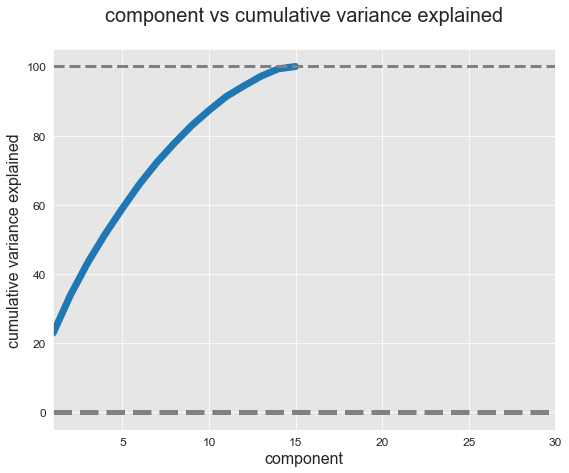

In [246]:
plot_var_exp(eigen_values)

In [247]:
# ANSWER

from sklearn.decomposition import PCA

# Create an instance of PCA
pca = PCA(n_components=15)    # I have to set the number of features I need. First, try with whole features then PCA tells me 
                              # which ones are good then I change the number again. So, first, n_components=15 
                              # then n_components=4  

# Fit Xs
pca.fit(X)

PCA(n_components=15)

In [248]:
print("Number of principal components:\t", pca.n_components_)
print()
print("Explained variance:\t\t", np.round(pca.explained_variance_, 3))
print()
print("Explained variance ratio:\t", np.round(pca.explained_variance_ratio_, 3))

Number of principal components:	 15

Explained variance:		 [1.1524359e+04 6.3367600e+02 2.8251800e+02 6.8014000e+01 1.0620000e+00
 3.3500000e-01 3.0700000e-01 2.0200000e-01 1.7100000e-01 1.6200000e-01
 1.3500000e-01 9.3000000e-02 6.6000000e-02 3.9000000e-02 2.5000000e-02]

Explained variance ratio:	 [0.921 0.051 0.023 0.005 0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.   ]


In [141]:
pca.feature_names_in_

array(['Age', 'RestingBP', 'Cholesterol', 'FastingBS', 'MaxHR', 'Oldpeak',
       'Sex_M', 'ChestPainType_ATA', 'ChestPainType_NAP',
       'ChestPainType_TA', 'RestingECG_Normal', 'RestingECG_ST',
       'ExerciseAngina_Y', 'ST_Slope_Flat', 'ST_Slope_Up'], dtype=object)

In [142]:
len(pca.feature_names_in_)

15

In [249]:
from sklearn.decomposition import PCA

# Create an instance of PCA
pca = PCA(n_components=4)     

# Fit Xs
pca.fit(X)

PCA(n_components=4)

In [250]:
print("Number of principal components:\t", pca.n_components_)
print()
print("Explained variance:\t\t", np.round(pca.explained_variance_, 3))
print()
print("Explained variance ratio:\t", np.round(pca.explained_variance_ratio_, 3))

Number of principal components:	 4

Explained variance:		 [11524.359   633.676   282.518    68.014]

Explained variance ratio:	 [0.921 0.051 0.023 0.005]


In [251]:
# ANSWER
# Apply dimensionality reduction to Xs using transform

# Project on the principal components
X_pca_reduced = pca.transform(X)

In [252]:
type(X_pca_reduced)

numpy.ndarray

In [253]:
X_pca_reduced.shape

(899, 4)

In [254]:
X_pca_reduced[:1]

array([[ 93.12962152, -29.67914603,  10.94951585,  -9.16505675]])

In [ ]:
# Case 1

In [187]:
type(X_rf_reduced)

pandas.core.frame.DataFrame

In [188]:
# PK: Only if X_rf_reduced is a DataFrame

X_var = X_rf_reduced.values    # independent variable, ['recency', 'monetary', 'time_months']

print(cl('X variable samples :\n {}'.format(X_var[:5]), attrs = ['bold']))

X variable samples :
 [[  1.    0.    0.  289.  172.   40.    0.  140.    1.    1.    0. ]
 [  0.    1.    1.  180.  156.   49.    0.  160.    0.    0.    1. ]
 [  1.    0.    0.  283.   98.   37.    0.  130.    1.    1.    0. ]
 [  0.    1.5   1.  214.  108.   48.    1.  138.    0.    0.    0. ]
 [  1.    0.    0.  195.  122.   54.    0.  150.    0.    1.    1. ]]


In [189]:
type(X_var)

numpy.ndarray

In [190]:
X_var.shape

(899, 11)

In [191]:
y_var = y.values    # dependent variable, 'blood_doner'

print(cl('Y variable samples :\n {}'.format(y_var[:5]), attrs = ['bold']))

Y variable samples :
 [0 1 0 1 0]


In [192]:
type(y_var)

numpy.ndarray

In [194]:
y_var.shape

(899,)

Split the dataset

In [195]:
X_train, X_test, y_train, y_test = train_test_split(X_var, y_var, test_size=0.3, random_state=42, stratify = y_var)

In [196]:
print(cl('X_train shape : {}'.format(X_train.shape), attrs = ['bold'], color = 'blue'))
print(cl('X_test shape : {}'.format(X_test.shape), attrs = ['bold'], color = 'blue'))
print(cl('y_train shape : {}'.format(y_train.shape), attrs = ['bold'], color = 'red'))
print(cl('y_test shape : {}'.format(y_test.shape), attrs = ['bold'], color = 'red'))

X_train shape : (629, 11)
X_test shape : (270, 11)
y_train shape : (629,)
y_test shape : (270,)


In [197]:
type(X_train)

numpy.ndarray

In [198]:
type(y_train)

numpy.ndarray

In [53]:
# PK: I need standardscaling train dataset since I removed all 11 outliers.

In [199]:
ss = StandardScaler()

In [200]:
X_train_ss_transformed = ss.fit_transform(X_train)

In [201]:
X_test_ss_transformed = ss.transform(X_test)

In [202]:
X_train_ss_transformed[:1]

array([[-0.87853912, -0.84563338,  0.99841144, -1.92320411, -1.66559283,
        -0.08152037, -0.81757875, -0.70655815,  2.01806359,  0.53015004,
        -0.52029518]])

In [203]:
X_test_ss_transformed[:1]

array([[-0.87853912,  0.1278355 ,  0.99841144, -1.92320411, -0.46515983,
        -1.8532629 ,  1.22312377, -1.30688921, -0.49552452,  0.53015004,
        -0.52029518]])

In [ ]:
# Model 1

# Grid search for Logistic Regression

In [88]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform

lr = LogisticRegression(solver ='liblinear', tol = 1e-2, max_iter = 200,    # PK: Do not use n_jobs when liblinear is used.
                        class_weight = 'balanced', random_state = 42)

distributions = dict(C = uniform(loc = 0, scale = 4),
                     penalty = ['l2', 'l1'])

rscv = RandomizedSearchCV(lr, distributions, scoring = 'accuracy', random_state = 42)

In [ ]:
search = rscv.fit(X_train_ss_transformed, y_train)

In [89]:
search.best_params_

{'C': 2.832290311184182, 'penalty': 'l1'}

In [109]:
y_pred = nb_grid.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 1
 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 1 0 1 1]


In [106]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[ 92  27]
 [ 17 134]] : is the confusion matrix
0.837037037037037 : is the accuracy score
0.8322981366459627 : is the precision score
0.8874172185430463 : is the recall score
0.8589743589743589 : is the f1 score


In [ ]:
# Model 2

# Grid search for SVC from Prac-Naive Bayes Classification With Sklearn.ipynb

In [ ]:
'''
kernel{‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’} or callable, default=’rbf’
Specifies the kernel type to be used in the algorithm. 
If none is given, ‘rbf’ will be used.

'''

In [90]:
import scipy.stats as stats
from sklearn.utils.fixes import loguniform

# Specify parameters and distributions to sample from
param_dist = {
  'C': stats.uniform(0.1, 1e4),
  'gamma': loguniform(1e-6, 1e+1),
}

In [93]:
from sklearn.model_selection import RandomizedSearchCV

n_iter_search = 20
random_search = RandomizedSearchCV(
    SVC(class_weight = 'balanced'), 
    param_distributions = param_dist,
    scoring = 'accuracy',
    n_iter = n_iter_search, 
    refit = True,
    verbose = 3
)

In [94]:
random_search.fit(X_train_ss_transformed, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV 1/5] END C=5732.669193447826, gamma=0.0001949039879502744;, score=0.849 total time=   0.0s
[CV 2/5] END C=5732.669193447826, gamma=0.0001949039879502744;, score=0.841 total time=   0.0s
[CV 3/5] END C=5732.669193447826, gamma=0.0001949039879502744;, score=0.865 total time=   0.0s
[CV 4/5] END C=5732.669193447826, gamma=0.0001949039879502744;, score=0.817 total time=   0.0s
[CV 5/5] END C=5732.669193447826, gamma=0.0001949039879502744;, score=0.896 total time=   0.0s
[CV 1/5] END C=4154.627729058915, gamma=5.1278013291317885e-06;, score=0.849 total time=   0.0s
[CV 2/5] END C=4154.627729058915, gamma=5.1278013291317885e-06;, score=0.881 total time=   0.0s
[CV 3/5] END C=4154.627729058915, gamma=5.1278013291317885e-06;, score=0.841 total time=   0.0s
[CV 4/5] END C=4154.627729058915, gamma=5.1278013291317885e-06;, score=0.825 total time=   0.0s
[CV 5/5] END C=4154.627729058915, gamma=5.1278013291317885e-06;, score=0.896 to

[CV 3/5] END C=1317.8866338649946, gamma=0.001630961188193537;, score=0.849 total time=   0.0s
[CV 4/5] END C=1317.8866338649946, gamma=0.001630961188193537;, score=0.833 total time=   0.0s
[CV 5/5] END C=1317.8866338649946, gamma=0.001630961188193537;, score=0.848 total time=   0.0s
[CV 1/5] END C=9104.282259542377, gamma=1.5178405554762182;, score=0.714 total time=   0.0s
[CV 2/5] END C=9104.282259542377, gamma=1.5178405554762182;, score=0.730 total time=   0.0s
[CV 3/5] END C=9104.282259542377, gamma=1.5178405554762182;, score=0.706 total time=   0.0s
[CV 4/5] END C=9104.282259542377, gamma=1.5178405554762182;, score=0.794 total time=   0.0s
[CV 5/5] END C=9104.282259542377, gamma=1.5178405554762182;, score=0.712 total time=   0.0s
[CV 1/5] END C=3950.9676608305135, gamma=6.747060012610112e-06;, score=0.841 total time=   0.0s
[CV 2/5] END C=3950.9676608305135, gamma=6.747060012610112e-06;, score=0.881 total time=   0.0s
[CV 3/5] END C=3950.9676608305135, gamma=6.747060012610112e-06;

RandomizedSearchCV(estimator=SVC(), n_iter=20,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023AD8777FA0>,
                                        'gamma': <scipy.stats._distn_infrastructure.rv_frozen object at 0x0000023AD7831D00>},
                   scoring='accuracy', verbose=3)

In [95]:
random_search.best_params_

{'C': 4154.627729058915, 'gamma': 5.1278013291317885e-06}

In [96]:
random_search.best_estimator_

SVC(C=4154.627729058915, gamma=5.1278013291317885e-06)

In [109]:
y_pred = nb_grid.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 1
 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 1 0 1 1]


In [106]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[ 92  27]
 [ 17 134]] : is the confusion matrix
0.837037037037037 : is the accuracy score
0.8322981366459627 : is the precision score
0.8874172185430463 : is the recall score
0.8589743589743589 : is the f1 score


In [ ]:
# Model 3

# Grid Search for KNN from 3-Parameter tuning for KNN Classifier.ipynb

In [97]:
#from sklearn.model_selection import GridSearchCV

knn = KNeighborsClassifier()

k_range = list(range(1, 31))

param_grid = dict(n_neighbors = k_range)
  
# defining parameter range
grid = GridSearchCV(knn, param_grid, cv = 10, scoring = 'accuracy', return_train_score=False, verbose=1)

In [98]:
# fitting the model for grid search
grid_search = grid.fit(X_train_ss_transformed, y_train)

Fitting 10 folds for each of 30 candidates, totalling 300 fits


In [99]:
print(grid_search.best_params_)

{'n_neighbors': 29}


In [109]:
y_pred = nb_grid.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 1
 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 1 0 1 1]


In [106]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[ 92  27]
 [ 17 134]] : is the confusion matrix
0.837037037037037 : is the accuracy score
0.8322981366459627 : is the precision score
0.8874172185430463 : is the recall score
0.8589743589743589 : is the f1 score


In [100]:
accuracy = grid_search.best_score_ *100

print("Accuracy for our training dataset with tuning is : {:.2f}%".format(accuracy) )

Accuracy for our training dataset with tuning is : 86.33%


In [ ]:
# Checking Accuracy on Test Data

In [92]:
knn = KNeighborsClassifier(n_neighbors = 12)    # This has No class_weight.

knn.fit(X_train_ss_transformed, y_train)

KNeighborsClassifier(n_neighbors=12)

In [93]:
y_test_hat = knn.predict(X_test_ss_transformed)

In [96]:
test_accuracy = accuracy_score(y_test,y_test_hat)*100

print("Accuracy for our testing dataset with tuning is : {:.2f}%".format(test_accuracy) )

Accuracy for our testing dataset with tuning is : 88.89%


In [ ]:
# Plotting a Confusion Matrix

In [98]:
from sklearn.metrics import plot_confusion_matrix

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


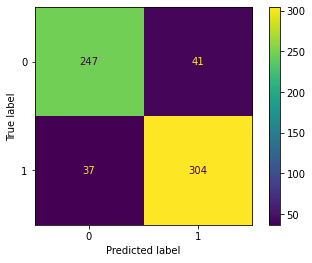

In [99]:
plot_confusion_matrix(grid, X_train_ss_transformed, y_train, values_format = 'd' )

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


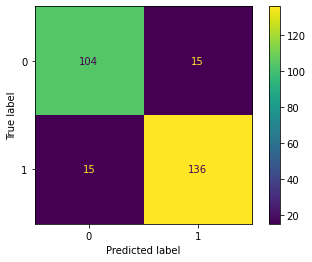

In [100]:
plot_confusion_matrix(grid, X_test_ss_transformed, y_test, values_format = 'd')

In [ ]:
# Model 4

# Grid Search for Random Forest - 1-Random Forest-Classification & Regresson-Copy1.ipynb

In [124]:
rfc = RandomForestClassifier(class_weight = 'balanced')

param_grid_rfc = [{
    'max_depth':[2, 3, 4],
    'max_features':[2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
}]

grid_rfc = GridSearchCV(estimator = rfc,
                     param_grid = param_grid_rfc,
                     scoring = 'accuracy',
                     cv = 10,
                     refit = True,
                     n_jobs = 1)

In [125]:
# Train the RandomForestClassifier

grid_sr_rfc = grid_rfc.fit(X_train_ss_transformed, y_train)

In [126]:
# Print the training score of the best model

print(grid_sr_rfc.best_score_)

0.8584997439836151


In [127]:
# Print the model parameters of the best model

print(grid_sr_rfc.best_params_)

{'max_depth': 4, 'max_features': 4}


In [131]:
# Print the test score of the best model

clfRFC = grid_sr_rfc.best_estimator_

print('Test accuracy: %.3f' % clfRFC.score(X_test_ss_transformed, y_test))

Test accuracy: 0.867


In [129]:
y_pred = grid_sr_rfc.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 1 1 1 0 0
 0 1 1 1 1 1 0 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 1 1 1
 0 0 1 0 1 0 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 1 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 1 0 1 1]


In [130]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[ 99  23]
 [ 13 135]] : is the confusion matrix
0.8666666666666667 : is the accuracy score
0.8544303797468354 : is the precision score
0.9121621621621622 : is the recall score
0.8823529411764706 : is the f1 score


In [ ]:
# Model 5

# Grid Search for GaussianNB

In [105]:
param_grid_nb = {
    'var_smoothing': np.logspace(0, -9, num=100)
}

In [107]:
nb_grid = GridSearchCV(estimator = GaussianNB(), param_grid = param_grid_nb, scoring = 'accuracy', 
                       verbose=1, cv=10, n_jobs=-1)    # GaussianNB() has no class_weight attribute

nb_grid.fit(X_train_ss_transformed, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


GridSearchCV(cv=10, estimator=GaussianNB(), n_jobs=-1,
             param_grid={'var_smoothing': array([1.00000000e+00, 8.11130831e-01, 6.57933225e-01, 5.33669923e-01,
       4.32876128e-01, 3.51119173e-01, 2.84803587e-01, 2.31012970e-01,
       1.87381742e-01, 1.51991108e-01, 1.23284674e-01, 1.00000000e-01,
       8.11130831e-02, 6.57933225e-02, 5.33669923e-02, 4.32876128e-02,
       3.51119173e-02, 2.848035...
       1.23284674e-07, 1.00000000e-07, 8.11130831e-08, 6.57933225e-08,
       5.33669923e-08, 4.32876128e-08, 3.51119173e-08, 2.84803587e-08,
       2.31012970e-08, 1.87381742e-08, 1.51991108e-08, 1.23284674e-08,
       1.00000000e-08, 8.11130831e-09, 6.57933225e-09, 5.33669923e-09,
       4.32876128e-09, 3.51119173e-09, 2.84803587e-09, 2.31012970e-09,
       1.87381742e-09, 1.51991108e-09, 1.23284674e-09, 1.00000000e-09])},
             scoring='accuracy', verbose=1)

In [108]:
print(nb_grid.best_estimator_)

GaussianNB(var_smoothing=0.43287612810830584)


In [132]:
y_pred = nb_grid.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 0 0 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 0 1 1 1 1 0 0
 0 1 0 1 1 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 0 1 0 1 1 1 1 1
 0 0 1 0 0 0 1 0 0 1 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 1 1 1 1 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 1 1 0 1 1 1 1 1 1 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 0 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0
 0 0 0 0 0 0 0 1 0 1 1]


In [133]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[104  18]
 [ 18 130]] : is the confusion matrix
0.8666666666666667 : is the accuracy score
0.8783783783783784 : is the precision score
0.8783783783783784 : is the recall score
0.8783783783783784 : is the f1 score


In [65]:
X_train_ss_transformed.shape

(629, 11)

In [ ]:
# Model 6

# Grid Search for DecisionTreeClassifier

In [134]:
param_dist = {"max_depth": [2, 4, 6], "max_features": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11], 
              "min_samples_leaf": [1, 2, 3, 4, 5, 6, 7], "criterion": ["gini", "entropy"]}

In [135]:
dt_clf = DecisionTreeClassifier(class_weight = 'balanced')

grid_dt = GridSearchCV(dt_clf, param_dist, cv = 5)

In [136]:
grid_dt.fit(X_train_ss_transformed, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 4, 6],
                         'max_features': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7]})

In [137]:
print("Tuned Decision Tree Parameters with GridSearchCV: {}".format(grid_dt.best_params_))
print()
print("Best score is {}".format(grid_dt.best_score_))

Tuned Decision Tree Parameters with GridSearchCV: {'criterion': 'entropy', 'max_depth': 4, 'max_features': 4, 'min_samples_leaf': 5}

Best score is 0.8458285714285715


In [138]:
y_pred = grid_dt.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 1 0 1 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 0 1 1 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 0 0 1 1 1 0 1 1 0 0
 0 1 1 1 1 1 0 1 0 0 1 1 1 1 1 0 1 0 1 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 0
 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 0 0 0 1 0 0 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 1 1 0
 1 0 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 1 0 1 0 1 1 1 1 0 1 1 1 0 0 1 0 1
 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 1 0 1 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 1 0
 0 0 0 0 1 0 0 1 0 1 1]


In [139]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[ 90  32]
 [ 15 133]] : is the confusion matrix
0.825925925925926 : is the accuracy score
0.806060606060606 : is the precision score
0.8986486486486487 : is the recall score
0.8498402555910541 : is the f1 score


In [ ]:
# Model 7

# Grid Search for XGBoost Gradient Boosting

In [118]:
# A parameter grid for XGBoost
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

In [119]:
xgb = XGBClassifier(learning_rate = 0.02, n_estimators = 600, objective = 'binary:logistic', silent = True, nthread = 1, 
                    class_weight = 'balanced')

In [121]:
folds = 3
param_comb = 5

skf = StratifiedKFold(n_splits=folds, shuffle = True, random_state = 42)

In [ ]:
random_search = RandomizedSearchCV(xgb, param_distributions = params, n_iter = param_comb, scoring = 'accuracy', n_jobs = 4, 
                                   cv=skf.split(X_train_ss_transformed, y_train), verbose=3, random_state = 42)

In [122]:
random_search.fit(X_train_ss_transformed, y_train)

Fitting 3 folds for each of 5 candidates, totalling 15 fits


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:17:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[18:17:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


RandomizedSearchCV(cv=<generator object _BaseKFold.split at 0x0000023AD892E900>,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           enable_categorical=False, gamma=None,
                                           gpu_id=None, importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=0.02,
                                           max_delta_step=None, max_depth=None,
                                           mi...
                                           reg_alpha=None, reg_lambda=None,
                                           scale_pos_weight=None, silent=True,
                                           subsample=None, tree_met

In [123]:
print('\n All results:')
print(random_search.cv_results_)

print('\n Best estimator:')
print(random_search.best_estimator_)

print('\n Best normalized gini score for %d-fold search with %d parameter combinations:' % (folds, param_comb))
print(random_search.best_score_ * 2 - 1)

print('\n Best hyperparameters:')
print(random_search.best_params_)

#results = pd.DataFrame(random_search.cv_results_)
#results.to_csv('xgb-random-grid-search-results-01.csv', index=False)


 All results:
{'mean_fit_time': array([1.94999735, 2.72033159, 2.31066028, 2.1649971 , 1.97267119]), 'std_fit_time': array([0.03608345, 0.0996308 , 0.05811861, 0.05517751, 0.04092752]), 'mean_score_time': array([0.02733437, 0.01900403, 0.01567364, 0.01333563, 0.01366425]), 'std_score_time': array([0.0075842 , 0.00282929, 0.0009446 , 0.00205823, 0.00046898]), 'param_subsample': masked_array(data=[1.0, 0.6, 0.8, 1.0, 0.8],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_min_child_weight': masked_array(data=[5, 1, 5, 5, 1],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_max_depth': masked_array(data=[3, 5, 5, 5, 4],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'param_gamma': masked_array(data=[5, 1.5, 1, 5, 1],
             mask=[False, False, False, False, False],
       fill_value='?',
            dt

In [140]:
y_pred = random_search.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1 0 0
 0 1 1 1 1 1 0 1 0 0 0 1 0 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 0 1 1 1 1 1 1
 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 0 1 0 0 1 1 0 1 0 1 1 1 0 1 0
 0 0 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 1 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 1 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 0 1 0
 0 0 0 0 1 0 0 1 0 1 1]


In [141]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[100  22]
 [ 16 132]] : is the confusion matrix
0.8592592592592593 : is the accuracy score
0.8571428571428571 : is the precision score
0.8918918918918919 : is the recall score
0.8741721854304636 : is the f1 score


In [ ]:
# Model 8

# Grid Search for LightGBM Gradient Boosting

In [144]:
gkf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42).split(X_train_ss_transformed, y_train)

In [145]:
param_grid = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300, 400],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]
    }

In [148]:
lgb_clf = lgb.LGBMClassifier(boosting_type='gbdt', objective='binary', num_boost_round=2000, learning_rate=0.01, 
                             class_weight = 'balanced')

In [149]:
gsearch = GridSearchCV(estimator = lgb_clf, param_grid = param_grid, scoring = 'accuracy', cv = gkf)

In [150]:
lgb_model = gsearch.fit(X_train_ss_transformed, y_train)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.5 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iter

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_dat

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value:

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=100
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value:

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] lambda_l1 is set=1.5, reg_alpha=0.5 will be ignored. Current value: lambda_l1=1.5
[LightGBM] [Warning] lambda_l2 is set=1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_boost_round` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] num_iterations is set=2000, num_boost_round=2000 will be ignored. Current value: num_iterations=2000


In [151]:
print(lgb_model.best_params_)

{'lambda_l1': 1, 'lambda_l2': 0, 'min_data_in_leaf': 30, 'num_leaves': 31, 'reg_alpha': 0.1}


In [152]:
print(lgb_model.best_score_)

0.852152380952381


In [153]:
y_pred = lgb_model.predict(X_test_ss_transformed)

print(y_pred)

[1 1 0 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 1 1 0 0 1 1 0 1 0 0 1 1 0 0 1 1 0 0
 1 0 1 1 0 1 0 1 0 1 1 1 1 1 0 1 1 1 1 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 1 0 0
 0 1 1 1 1 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 1 0 0 0 1 1 1 0 0 1 1 1 1 1 0 1 1
 0 0 1 0 1 0 1 0 0 0 1 1 0 0 0 1 1 0 0 1 0 1 1 0 1 1 1 1 1 1 0 1 1 1 0 1 1
 1 1 1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 1 0 1 1 0 1 1 0 0 0 1 0 1 0 1 1 1 0 1 0
 0 0 1 0 0 1 1 1 1 1 0 0 1 1 1 0 1 0 1 0 0 0 1 0 1 0 0 1 0 1 1 1 0 0 1 0 0
 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 1 1 1 1 1 0 0 1 1 0 1 0 1 0 1 0 0
 0 0 0 0 1 0 0 1 0 1 1]


In [154]:
#from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred), ": is the confusion matrix")

#from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred), ": is the accuracy score")

#from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred), ": is the precision score")

#from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred), ": is the recall score")

#from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred), ": is the f1 score")

[[103  19]
 [ 15 133]] : is the confusion matrix
0.8740740740740741 : is the accuracy score
0.875 : is the precision score
0.8986486486486487 : is the recall score
0.8866666666666666 : is the f1 score


In [ ]:
'''
Stacking for Classification

'''

Define and Fit Models

In [ ]:
# Common factors

In [162]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    
    return models

In [163]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

In [ ]:
# Common factors

Verify and Evaluate the Training Model

>lr 0.864 (0.036)
>knn 0.868 (0.043)
>cart 0.774 (0.044)
>svm 0.869 (0.040)
>bayes 0.869 (0.045)
>rf 0.859 (0.040)


{'whiskers': [<matplotlib.lines.Line2D at 0x1851cabfe20>,
 'caps': [<matplotlib.lines.Line2D at 0x1851cac9400>,
 'boxes': [<matplotlib.lines.Line2D at 0x1851cabfb50>,
 'medians': [<matplotlib.lines.Line2D at 0x1851cac99a0>,
 'fliers': [<matplotlib.lines.Line2D at 0x1851cac9f40>,
 'means': [<matplotlib.lines.Line2D at 0x1851cac9c70>,
  <matplotlib.lines.Line2D at 0x1851c897eb0>]}

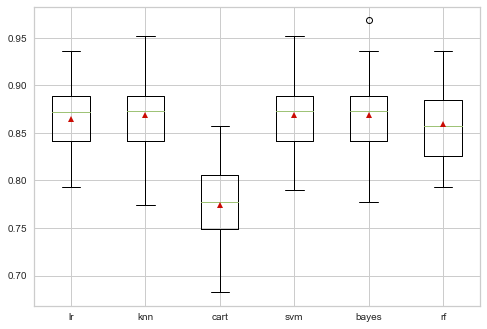

In [73]:
# Test 1

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [158]:
!pip install lightgbm

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>cart 0.772 (0.045)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.853 (0.040)
>xgb 0.844 (0.034)
>lgb 0.847 (0.038)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc2fc580>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc2fcbe0>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adc2fc2b0>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc30c100>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc30c6a0>,
 'means': [<matplotlib.lines.Line2D at 0x23adc30c3d0>,
  <matplotlib.lines.Line2D at 0x23adc2b0370>]}

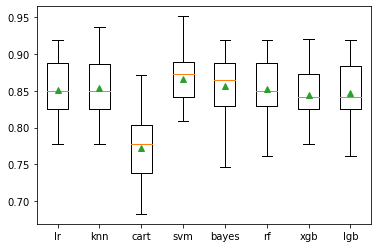

In [164]:
# Test 2

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [ ]:
# Common factors

In [165]:
# get a stacking ensemble of models
def get_stacking():
    
    # define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    level0.append(('rf', RandomForestClassifier()))
    level0.append(('xgb', XGBClassifier()))
    level0.append(('lgb', LGBMClassifier()))
        
    # define meta learner model
    level1 = LogisticRegression()
    
    # define the stacking ensemble
    st_clf = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    
    return st_clf

In [166]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    models['stacking'] = get_stacking()
            
    return models

In [167]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

In [ ]:
# Common factors

>lr 0.864 (0.036)
>knn 0.868 (0.043)
>cart 0.776 (0.041)
>svm 0.869 (0.040)
>bayes 0.869 (0.045)
>rf 0.869 (0.040)
>stacking 0.872 (0.040)


{'whiskers': [<matplotlib.lines.Line2D at 0x16d9d90aa30>,
 'caps': [<matplotlib.lines.Line2D at 0x16d9d90afd0>,
 'boxes': [<matplotlib.lines.Line2D at 0x16d9d90a760>,
 'medians': [<matplotlib.lines.Line2D at 0x16d9d9245b0>,
 'fliers': [<matplotlib.lines.Line2D at 0x16d9d924c10>,
 'means': [<matplotlib.lines.Line2D at 0x16d9d924880>,
  <matplotlib.lines.Line2D at 0x16d9d88d4c0>]}

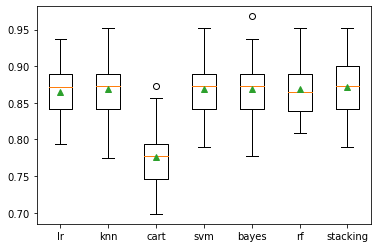

In [62]:
# Test 1

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [277]:
0.9443561208267091 - 0.8777777777777778

0.06657834304893129

In [278]:
0.9141494435612083 - 0.8666666666666667

0.04748277689454161

In [279]:
0.904610492845787 - 0.8814814814814815

0.023129011364305452

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>cart 0.763 (0.046)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.856 (0.040)
>xgb 0.844 (0.034)
>lgb 0.847 (0.038)
>stacking 0.876 (0.037)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc4a0040>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc4a04c0>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adc494d30>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc4a0a60>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc4af040>,
 'means': [<matplotlib.lines.Line2D at 0x23adc4a0d30>,
  <matplotlib.lines.Line2D at 0x23adc50fa30>]}

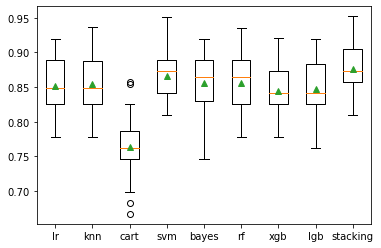

In [168]:
# Test 2 - Best performance

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [ ]:
# Test 3

In [169]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    #models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    #models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    
    return models

In [170]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.854 (0.042)
>lgb 0.847 (0.038)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc568880>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc568b80>,
 'boxes': [<matplotlib.lines.Line2D at 0x23ad884d5b0>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc15c160>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc15c700>,
 'means': [<matplotlib.lines.Line2D at 0x23adc15c430>,
  <matplotlib.lines.Line2D at 0x23adc58f670>]}

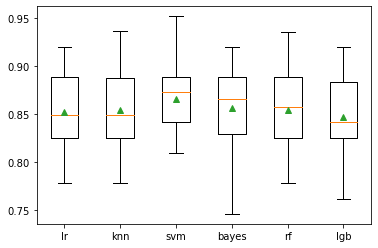

In [171]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [172]:
# get a stacking ensemble of models
def get_stacking():
    
    # define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    #level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    level0.append(('rf', RandomForestClassifier()))
    #level0.append(('xgb', XGBClassifier()))
    level0.append(('lgb', LGBMClassifier()))
        
    # define meta learner model
    level1 = LogisticRegression()
    
    # define the stacking ensemble
    st_clf = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    
    return st_clf

In [173]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    #models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    #models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    models['stacking'] = get_stacking()
            
    return models

In [174]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.853 (0.038)
>lgb 0.847 (0.038)
>stacking 0.875 (0.032)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc5d2b80>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc5de160>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adc5d28b0>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc5de700>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc5deca0>,
 'means': [<matplotlib.lines.Line2D at 0x23adc5de9d0>,
  <matplotlib.lines.Line2D at 0x23adc62c790>]}

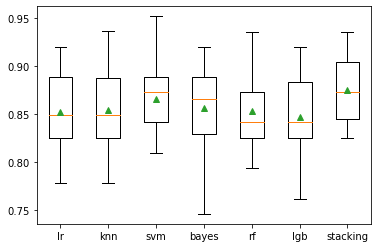

In [175]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [ ]:
# Test 4

In [176]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    #models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    
    return models

In [177]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.851 (0.038)
>xgb 0.844 (0.034)
>lgb 0.847 (0.038)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc6d0eb0>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc6e0370>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adc6d0be0>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc6e0910>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc6e0eb0>,
 'means': [<matplotlib.lines.Line2D at 0x23adc6e0be0>,
  <matplotlib.lines.Line2D at 0x23adc66afa0>]}

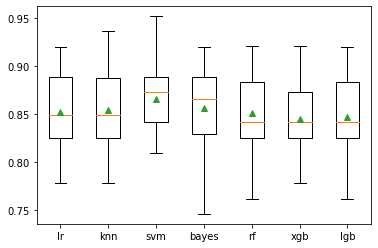

In [178]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [179]:
# get a stacking ensemble of models
def get_stacking():
    
    # define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    #level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    level0.append(('rf', RandomForestClassifier()))
    level0.append(('xgb', XGBClassifier()))
    level0.append(('lgb', LGBMClassifier()))
        
    # define meta learner model
    level1 = LogisticRegression()
    
    # define the stacking ensemble
    st_clf = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    
    return st_clf

In [180]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    #models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    models['stacking'] = get_stacking()
            
    return models

In [181]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

>lr 0.852 (0.037)
>knn 0.854 (0.041)
>svm 0.866 (0.035)
>bayes 0.856 (0.040)
>rf 0.855 (0.039)
>xgb 0.844 (0.034)
>lgb 0.847 (0.038)
>stacking 0.874 (0.031)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adc7d5dc0>,
 'caps': [<matplotlib.lines.Line2D at 0x23adc7e1280>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adc7d5af0>,
 'medians': [<matplotlib.lines.Line2D at 0x23adc7e1820>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adc7e1dc0>,
 'means': [<matplotlib.lines.Line2D at 0x23adc7e1af0>,
  <matplotlib.lines.Line2D at 0x23adc830ee0>]}

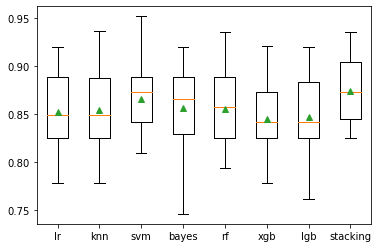

In [182]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [204]:
# Test 1

estimators = [
('lr', LogisticRegression()),
('knn', KNeighborsClassifier()),
('cart', DecisionTreeClassifier()),
('svm', SVC()),
('bayes', GaussianNB()),
('rf', RandomForestClassifier()),
]

st_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(), cv = 5)

In [205]:
st_clf.fit(X_train_ss_transformed, y_train)

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression()),
                               ('knn', KNeighborsClassifier()),
                               ('cart', DecisionTreeClassifier()),
                               ('svm', SVC()), ('bayes', GaussianNB()),
                               ('rf', RandomForestClassifier())],
                   final_estimator=LogisticRegression())

Verify and Evalutae the Training Model

In [206]:
# PK: Is this right to use here? Check first

train_yhat = st_clf.predict(X_train_ss_transformed)

def evaluation_score (y_train, train_yhat):
    cm = confusion_matrix(y_train, train_yhat) 
    
    print("Confusion Matrix \n", cm)
    print()
    print("Accuracy Score", accuracy_score(y_train, train_yhat))
    print()
    print('Balanced Accuracy ', balanced_accuracy_score(y_train, train_yhat))
    print()
    print("Recall Accuracy Score~TP", recall_score(y_train, train_yhat))
    print()
    print("Precision Score ~ Ratio of TP", precision_score(y_train, train_yhat))
    print()
    print("F1 Score ", f1_score(y_train, train_yhat))
    print()
    print("auc_roc score ", roc_auc_score(y_train, train_yhat))
    print()
    print("Classification Report \n", classification_report(y_train, train_yhat))

In [168]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [ ]:
# Heart Disease: output class [1: heart disease, 0: Normal] 
# 1: Positive, 0: Negative

In [236]:
y_train_df = pd.DataFrame(y_train)

In [237]:
type(y_train_df)

pandas.core.frame.DataFrame

In [238]:
y_train_df.value_counts()

1    344
0    285
dtype: int64

In [207]:
evaluation_score(y_train, train_yhat)

Confusion Matrix 
 [[249  36]
 [ 18 326]]

Accuracy Score 0.9141494435612083

Balanced Accuracy  0.9106793145654835

Recall Accuracy Score~TP 0.9476744186046512

Precision Score ~ Ratio of TP 0.9005524861878453

F1 Score  0.9235127478753542

auc_roc score  0.9106793145654835

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.87      0.90       285
           1       0.90      0.95      0.92       344

    accuracy                           0.91       629
   macro avg       0.92      0.91      0.91       629
weighted avg       0.92      0.91      0.91       629



In [208]:
acc = cross_val_score(st_clf, X_train_ss_transformed, y_train, cv = 10)    # model_classifier = BaggingClassifier

acc.mean()

0.8648489503328213

Make Predictions and Evaluate the Test Model

In [209]:
st_clf.score(X_test_ss_transformed, y_test)

0.8851851851851852

In [210]:
y_pred = st_clf.predict(X_test_ss_transformed)

y_pred

array([1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1], dtype=int64)

In [211]:
accuracy_score(y_test, y_pred)    # = st_clf.score(X_test_ss_transformed, y_test)

0.8851851851851852

In [178]:
y_test_df = pd.DataFrame(y_test)

In [179]:
type(y_test_df)

pandas.core.frame.DataFrame

In [180]:
y_test_df.value_counts()

1    151
0    119
dtype: int64

In [212]:
# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

cm

array([[104,  18],
       [ 13, 135]], dtype=int64)

In [182]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [213]:
y_score = st_clf.decision_function(X_test_ss_transformed)

In [214]:
y_score[:5]

array([ 2.68701314,  2.25607716, -1.94572305,  1.70951948,  0.52716354])

In [215]:
fpr1, tpr1, thresholds = roc_curve(y_test, y_score)

In [216]:
fpr1

array([0.        , 0.        , 0.        , 0.00819672, 0.00819672,
       0.01639344, 0.01639344, 0.02459016, 0.02459016, 0.03278689,
       0.03278689, 0.04098361, 0.04098361, 0.04918033, 0.04918033,
       0.06557377, 0.06557377, 0.07377049, 0.07377049, 0.10655738,
       0.10655738, 0.13114754, 0.13114754, 0.13934426, 0.13934426,
       0.14754098, 0.14754098, 0.16393443, 0.16393443, 0.2295082 ,
       0.2295082 , 0.25409836, 0.25409836, 0.31967213, 0.31967213,
       0.3852459 , 0.3852459 , 0.42622951, 0.42622951, 0.45901639,
       0.45901639, 0.49180328, 0.49180328, 0.6557377 , 0.6557377 ,
       1.        ])

In [217]:
tpr1

array([0.        , 0.00675676, 0.15540541, 0.15540541, 0.22972973,
       0.22972973, 0.33108108, 0.33108108, 0.47297297, 0.47297297,
       0.64864865, 0.64864865, 0.67567568, 0.67567568, 0.7027027 ,
       0.7027027 , 0.80405405, 0.80405405, 0.83108108, 0.83108108,
       0.87162162, 0.87162162, 0.89189189, 0.89189189, 0.90540541,
       0.90540541, 0.91216216, 0.91216216, 0.92567568, 0.92567568,
       0.94594595, 0.94594595, 0.9527027 , 0.9527027 , 0.95945946,
       0.95945946, 0.97297297, 0.97297297, 0.97972973, 0.97972973,
       0.98648649, 0.98648649, 0.99324324, 0.99324324, 1.        ,
       1.        ])

In [218]:
thresholds

array([ 3.88510778,  2.88510778,  2.66528442,  2.66283334,  2.60891637,
        2.60763194,  2.51426936,  2.50397342,  2.28861282,  2.27666436,
        2.03875231,  2.02917089,  1.94362285,  1.93634566,  1.85591194,
        1.85032055,  1.2997336 ,  1.25535625,  1.08038818,  0.9774588 ,
        0.69353638,  0.54372469,  0.49211293,  0.25626105,  0.15668183,
        0.11805293,  0.06054311, -0.10451731, -0.15958767, -1.13732595,
       -1.20951054, -1.28080762, -1.37787578, -1.74717264, -1.77288898,
       -2.01206515, -2.07877714, -2.14304542, -2.23084284, -2.36572131,
       -2.37023587, -2.48676433, -2.49205798, -2.74006165, -2.74968822,
       -3.20477182])

In [219]:
roc_auc1 = auc(fpr1, tpr1)

roc_auc1

0.9378599911386796

In [220]:
print('AUC: {}'.format(auc(fpr1, tpr1)))

AUC: 0.9378599911386796


AUC: 0.9378599911386796


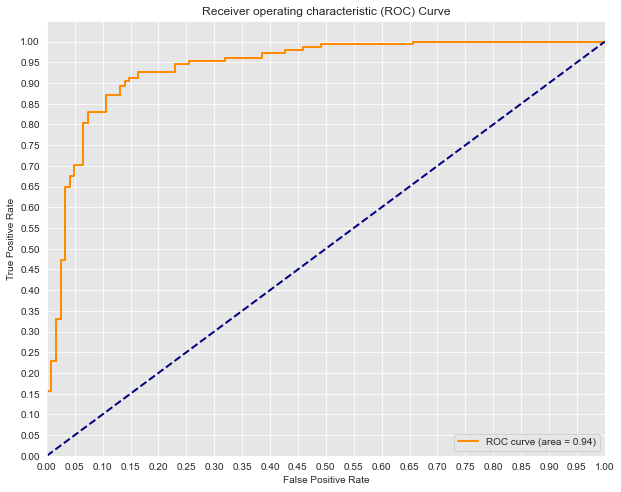

In [221]:
# Seaborn's beautiful styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr1, tpr1)))

plt.figure(figsize=(10, 8))

lw = 2
#plt.plot(fpr1, tpr1, color='darkorange', lw=lw, label='ROC curve')
plt.plot(fpr1, tpr1, color='darkorange', lw = lw, label = 'ROC curve (area = %0.2f)' % roc_auc1)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')

plt.legend(loc='lower right')
#plt.show()

In [222]:
# Test 2

estimators = [
('lr', LogisticRegression()),
('knn', KNeighborsClassifier()),
('cart', DecisionTreeClassifier()),
('svm', SVC()),
('bayes', GaussianNB()),
('rf', RandomForestClassifier()),
('xgb', XGBClassifier()),
('lgb', LGBMClassifier()),
]

st_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(), cv = 5)

In [223]:
st_clf.fit(X_train_ss_transformed, y_train)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression()),
                               ('knn', KNeighborsClassifier()),
                               ('cart', DecisionTreeClassifier()),
                               ('svm', SVC()), ('bayes', GaussianNB()),
                               ('rf', RandomForestClassifier()),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              enable_categorical=False,
                                              gamma=None...
                                              max_depth=None,
                                              min_child_weight=None,
                                              missing=nan,


Verify and Evalutae the Training Model

In [224]:
train_yhat = st_clf.predict(X_train_ss_transformed)

def evaluation_score (y_train, train_yhat):
    cm = confusion_matrix(y_train, train_yhat) 
    
    print("Confusion Matrix \n", cm)
    print()
    print("Accuracy Score", accuracy_score(y_train, train_yhat))
    print()
    print('Balanced Accuracy ', balanced_accuracy_score(y_train, train_yhat))
    print()
    print("Recall Accuracy Score~TP", recall_score(y_train, train_yhat))
    print()
    print("Precision Score ~ Ratio of TP", precision_score(y_train, train_yhat))
    print()
    print("F1 Score ", f1_score(y_train, train_yhat))
    print()
    print("auc_roc score ", roc_auc_score(y_train, train_yhat))
    print()
    print("Classification Report \n", classification_report(y_train, train_yhat))

In [186]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [187]:
y_train_df = pd.DataFrame(y_train)

In [188]:
type(y_train_df)

pandas.core.frame.DataFrame

In [189]:
y_train_df.value_counts()

1    344
0    285
dtype: int64

In [225]:
evaluation_score(y_train, train_yhat)

Confusion Matrix 
 [[258  27]
 [ 14 330]]

Accuracy Score 0.9348171701112877

Balanced Accuracy  0.9322827417380661

Recall Accuracy Score~TP 0.9593023255813954

Precision Score ~ Ratio of TP 0.9243697478991597

F1 Score  0.9415121255349501

auc_roc score  0.9322827417380661

Classification Report 
               precision    recall  f1-score   support

           0       0.95      0.91      0.93       285
           1       0.92      0.96      0.94       344

    accuracy                           0.93       629
   macro avg       0.94      0.93      0.93       629
weighted avg       0.94      0.93      0.93       629



In [226]:
acc = cross_val_score(st_clf, X_train_ss_transformed, y_train, cv = 10)    # model_classifier = BaggingClassifier

acc.mean()

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.869636456733231

Make Predictions and Evaluate the Test Model

In [227]:
st_clf.score(X_test_ss_transformed, y_test)

0.8703703703703703

In [228]:
y_pred = st_clf.predict(X_test_ss_transformed)

y_pred

array([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1], dtype=int64)

In [229]:
accuracy_score(y_test, y_pred)    # = st_clf.score(X_test_ss_transformed, y_test)

0.8703703703703703

In [137]:
y_test_df = pd.DataFrame(y_test)

In [197]:
type(y_test_df)

pandas.core.frame.DataFrame

In [198]:
y_test_df.value_counts()

1    148
0    122
dtype: int64

In [230]:
# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

cm

array([[102,  20],
       [ 15, 133]], dtype=int64)

In [200]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [231]:
y_score = st_clf.decision_function(X_test_ss_transformed)

In [232]:
y_score[:5]

array([ 2.70382969,  2.37299523, -1.92741748,  1.87860959,  0.92646304])

In [233]:
fpr2, tpr2, thresholds = roc_curve(y_test, y_score)

In [234]:
fpr2

array([0.        , 0.        , 0.        , 0.00819672, 0.00819672,
       0.01639344, 0.01639344, 0.02459016, 0.02459016, 0.03278689,
       0.03278689, 0.04098361, 0.04098361, 0.04918033, 0.04918033,
       0.05737705, 0.05737705, 0.06557377, 0.06557377, 0.07377049,
       0.07377049, 0.08196721, 0.08196721, 0.09016393, 0.09016393,
       0.09836066, 0.09836066, 0.10655738, 0.10655738, 0.1147541 ,
       0.1147541 , 0.13114754, 0.13114754, 0.1557377 , 0.1557377 ,
       0.16393443, 0.16393443, 0.17213115, 0.17213115, 0.18852459,
       0.18852459, 0.20491803, 0.20491803, 0.2295082 , 0.2295082 ,
       0.23770492, 0.23770492, 0.39344262, 0.39344262, 0.40163934,
       0.40163934, 0.42622951, 0.42622951, 0.60655738, 0.60655738,
       0.70491803, 0.70491803, 1.        ])

In [235]:
tpr2

array([0.        , 0.00675676, 0.12162162, 0.12162162, 0.20945946,
       0.20945946, 0.44594595, 0.44594595, 0.56756757, 0.56756757,
       0.66216216, 0.66216216, 0.7027027 , 0.7027027 , 0.71621622,
       0.71621622, 0.75675676, 0.75675676, 0.76351351, 0.76351351,
       0.78378378, 0.78378378, 0.80405405, 0.80405405, 0.81756757,
       0.81756757, 0.82432432, 0.82432432, 0.83108108, 0.83108108,
       0.85135135, 0.85135135, 0.88513514, 0.88513514, 0.89864865,
       0.89864865, 0.90540541, 0.90540541, 0.91891892, 0.91891892,
       0.93243243, 0.93243243, 0.93918919, 0.93918919, 0.94594595,
       0.94594595, 0.9527027 , 0.9527027 , 0.96621622, 0.96621622,
       0.97972973, 0.97972973, 0.98648649, 0.98648649, 0.99324324,
       0.99324324, 1.        , 1.        ])

In [236]:
thresholds

array([ 3.77287848,  2.77287848,  2.69383401,  2.69028742,  2.64241096,
        2.6356878 ,  2.43588043,  2.41312467,  2.27777071,  2.27641905,
        2.12969454,  2.12617769,  1.97254348,  1.9501063 ,  1.94269283,
        1.92826523,  1.81223145,  1.76407292,  1.74529622,  1.70443887,
        1.59047447,  1.53248672,  1.4460661 ,  1.35344991,  1.25354889,
        1.24507079,  0.9640348 ,  0.9428745 ,  0.92646304,  0.81835161,
        0.72937914,  0.64841074,  0.26911562,  0.21661851,  0.10493952,
        0.0263122 , -0.02510713, -0.23998183, -0.3472147 , -0.56032836,
       -0.85878742, -0.96299207, -1.04585785, -1.402093  , -1.40700668,
       -1.43836893, -1.46528238, -2.06872515, -2.11216425, -2.15406086,
       -2.22236314, -2.28904303, -2.33290097, -2.70961451, -2.70973027,
       -2.79314662, -2.79390556, -3.02888247])

In [237]:
roc_auc2 = auc(fpr2, tpr2)

roc_auc2

0.9365861763402746

In [238]:
print('AUC: {}'.format(auc(fpr2, tpr2)))

AUC: 0.9365861763402746


AUC: 0.9365861763402746


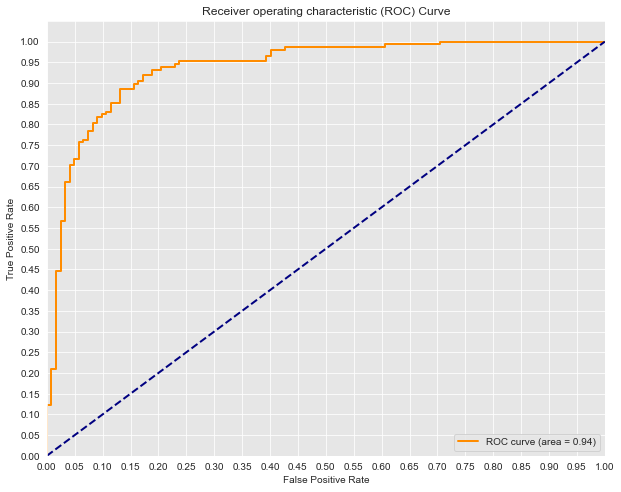

In [239]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr2, tpr2)))

plt.figure(figsize=(10, 8))

lw = 2
plt.plot(fpr2, tpr2, color='darkorange', lw = lw, label = 'ROC curve (area = %0.2f)' % roc_auc2)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')

plt.legend(loc='lower right')
#plt.show()

In [240]:
# Test 3

estimators = [
('lr', LogisticRegression(C = 1.3348344445560874, penalty = 'l2')), # ValueError: Solver lbfgs supports only 'l2' or 'none' penalties, got l1 penalty.
('knn', KNeighborsClassifier(n_neighbors = 12)),
('cart', DecisionTreeClassifier(criterion = 'gini', max_depth = 4, max_features = 9, min_samples_leaf = 5)),
('svm', SVC(C = 3306.5824815682313, gamma = 7.243805569873168e-06)),
('bayes', GaussianNB(var_smoothing = 0.04328761281083057)),
('rf', RandomForestClassifier(max_depth = 4, max_features = 4)),
]

st_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(), cv = 5)

In [241]:
st_clf.fit(X_train_ss_transformed, y_train)

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression(C=1.3348344445560874)),
                               ('knn', KNeighborsClassifier(n_neighbors=12)),
                               ('cart',
                                DecisionTreeClassifier(max_depth=4,
                                                       max_features=9,
                                                       min_samples_leaf=5)),
                               ('svm',
                                SVC(C=3306.5824815682313,
                                    gamma=7.243805569873168e-06)),
                               ('bayes',
                                GaussianNB(var_smoothing=0.04328761281083057)),
                               ('rf',
                                RandomForestClassifier(max_depth=4,
                                                       max_features=4))],
                   final_estimator=LogisticRegression())

Verify and Evalutae the Training Model

In [242]:
train_yhat = st_clf.predict(X_train_ss_transformed)

def evaluation_score (y_train, train_yhat):
    cm = confusion_matrix(y_train, train_yhat) 
    
    print("Confusion Matrix \n", cm)
    print()
    print("Accuracy Score", accuracy_score(y_train, train_yhat))
    print()
    print('Balanced Accuracy ', balanced_accuracy_score(y_train, train_yhat))
    print()
    print("Recall Accuracy Score~TP", recall_score(y_train, train_yhat))
    print()
    print("Precision Score ~ Ratio of TP", precision_score(y_train, train_yhat))
    print()
    print("F1 Score ", f1_score(y_train, train_yhat))
    print()
    print("auc_roc score ", roc_auc_score(y_train, train_yhat))
    print()
    print("Classification Report \n", classification_report(y_train, train_yhat))

In [66]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [114]:
y_train_df = pd.DataFrame(y_train)

In [115]:
type(y_train_df)

pandas.core.frame.DataFrame

In [116]:
y_train_df.value_counts()

1    341
0    288
dtype: int64

In [243]:
evaluation_score(y_train, train_yhat)

Confusion Matrix 
 [[239  46]
 [ 27 317]]

Accuracy Score 0.8839427662957074

Balanced Accuracy  0.8800540595675235

Recall Accuracy Score~TP 0.9215116279069767

Precision Score ~ Ratio of TP 0.8732782369146006

F1 Score  0.8967468175388968

auc_roc score  0.8800540595675235

Classification Report 
               precision    recall  f1-score   support

           0       0.90      0.84      0.87       285
           1       0.87      0.92      0.90       344

    accuracy                           0.88       629
   macro avg       0.89      0.88      0.88       629
weighted avg       0.88      0.88      0.88       629



In [244]:
acc = cross_val_score(st_clf, X_train_ss_transformed, y_train, cv = 10)    # model_classifier = BaggingClassifier

acc.mean()

0.8648745519713262

Make Predictions and Evaluate the Test Model

In [245]:
st_clf.score(X_test_ss_transformed, y_test)

0.8703703703703703

In [246]:
y_pred = st_clf.predict(X_test_ss_transformed)

y_pred

array([1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1], dtype=int64)

In [247]:
accuracy_score(y_test, y_pred)    

0.8703703703703703

In [118]:
y_test_df = pd.DataFrame(y_test)

In [119]:
type(y_test_df)

pandas.core.frame.DataFrame

In [120]:
y_test_df.value_counts()

1    151
0    119
dtype: int64

In [248]:
# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

cm

array([[102,  20],
       [ 15, 133]], dtype=int64)

In [121]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [249]:
y_score = st_clf.decision_function(X_test_ss_transformed)

In [250]:
y_score[:5]

array([ 3.06413258,  1.93696299, -2.08624778,  1.47963567, -0.65092321])

In [251]:
fpr3, tpr3, thresholds = roc_curve(y_test, y_score)

In [252]:
fpr3

array([0.        , 0.        , 0.        , 0.00819672, 0.00819672,
       0.01639344, 0.01639344, 0.02459016, 0.02459016, 0.03278689,
       0.03278689, 0.04098361, 0.04098361, 0.04918033, 0.04918033,
       0.05737705, 0.05737705, 0.06557377, 0.06557377, 0.07377049,
       0.07377049, 0.12295082, 0.12295082, 0.14754098, 0.14754098,
       0.16393443, 0.16393443, 0.17213115, 0.17213115, 0.18032787,
       0.18032787, 0.19672131, 0.19672131, 0.20491803, 0.20491803,
       0.2295082 , 0.2295082 , 0.29508197, 0.29508197, 0.31147541,
       0.31147541, 0.3442623 , 0.3442623 , 0.36885246, 0.36885246,
       0.37704918, 0.37704918, 0.51639344, 0.51639344, 0.59016393,
       0.59016393, 0.7295082 , 0.7295082 , 1.        ])

In [253]:
tpr3

array([0.        , 0.00675676, 0.28378378, 0.28378378, 0.2972973 ,
       0.2972973 , 0.48648649, 0.48648649, 0.49324324, 0.49324324,
       0.68243243, 0.68243243, 0.7027027 , 0.7027027 , 0.72297297,
       0.72297297, 0.79054054, 0.79054054, 0.82432432, 0.82432432,
       0.83783784, 0.83783784, 0.84459459, 0.84459459, 0.87837838,
       0.87837838, 0.89864865, 0.89864865, 0.90540541, 0.90540541,
       0.91216216, 0.91216216, 0.92567568, 0.92567568, 0.93918919,
       0.93918919, 0.94594595, 0.94594595, 0.9527027 , 0.9527027 ,
       0.95945946, 0.95945946, 0.96621622, 0.96621622, 0.97297297,
       0.97297297, 0.97972973, 0.97972973, 0.98648649, 0.98648649,
       0.99324324, 0.99324324, 1.        , 1.        ])

In [254]:
thresholds

array([ 4.62777484,  3.62777484,  2.80913963,  2.80344017,  2.79690861,
        2.76924864,  2.49123853,  2.40721743,  2.38315966,  2.37981008,
        1.81569138,  1.7881182 ,  1.65215275,  1.53255856,  1.48376145,
        1.48241628,  1.26041911,  1.2116927 ,  1.05240056,  1.00218116,
        0.95075885,  0.63071392,  0.61585828,  0.56140699,  0.30843594,
        0.1976978 ,  0.06949373, -0.02257064, -0.05840351, -0.20320925,
       -0.37611834, -0.59516792, -0.79335158, -0.83450277, -1.01289858,
       -1.12195878, -1.14836191, -1.44494096, -1.50196056, -1.58563582,
       -1.58927646, -1.76580533, -1.77483015, -1.82815092, -1.90672049,
       -1.90962214, -1.92102241, -2.45977372, -2.47952791, -2.65344989,
       -2.663283  , -2.84299903, -2.86233638, -3.72643932])

In [255]:
roc_auc3 = auc(fpr3, tpr3)

roc_auc3

0.9391338059370847

In [256]:
print('AUC: {}'.format(auc(fpr3, tpr3)))

AUC: 0.9391338059370847


AUC: 0.9391338059370847


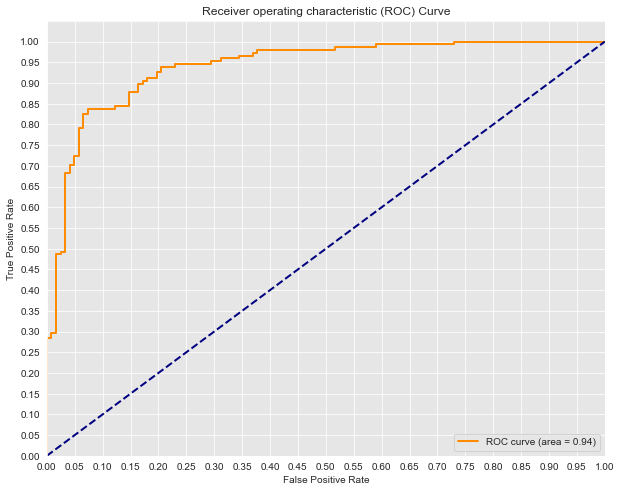

In [257]:
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr3, tpr3)))

plt.figure(figsize=(10, 8))

lw = 2
plt.plot(fpr3, tpr3, color='darkorange', lw = lw, label = 'ROC curve (area = %0.2f)' % roc_auc3)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')

plt.legend(loc='lower right')
#plt.show()

In [258]:
# Test 4

estimators = [
('lr', LogisticRegression(C = 1.3348344445560874, penalty = 'l2')), 
('knn', KNeighborsClassifier(n_neighbors = 12)),
('cart', DecisionTreeClassifier(criterion = 'gini', max_depth = 4, max_features = 9, min_samples_leaf = 5)),
('svm', SVC(C = 3306.5824815682313, gamma = 7.243805569873168e-06)),
('bayes', GaussianNB(var_smoothing = 0.04328761281083057)),
('rf', RandomForestClassifier(max_depth = 4, max_features = 4)),
('xgb', XGBClassifier(subsample = 1.0, min_child_weight = 5, max_depth = 5, gamma = 5, colsample_bytree = 0.6)),
('lgb', LGBMClassifier(lambda_l1 = 1, lambda_l2 = 0, min_data_in_leaf = 30, num_leaves = 31, reg_alpha = 0.1)),
]

st_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(), cv = 5)

In [259]:
st_clf.fit(X_train_ss_transformed, y_train)

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

StackingClassifier(cv=5,
                   estimators=[('lr', LogisticRegression(C=1.3348344445560874)),
                               ('knn', KNeighborsClassifier(n_neighbors=12)),
                               ('cart',
                                DecisionTreeClassifier(max_depth=4,
                                                       max_features=9,
                                                       min_samples_leaf=5)),
                               ('svm',
                                SVC(C=3306.5824815682313,
                                    gamma=7.243805569873168e-06)),
                               ('bayes',
                                GaussianNB(var_smoothing=0.04328761281083057)),
                               ('rf',
                                RandomForestClassi...
                                              monotone_constraints=None,
                                              n_estimators=100, n_jobs=None,
                                 

Verify and Evalutae the Training Model

In [260]:
train_yhat = st_clf.predict(X_train_ss_transformed)

def evaluation_score (y_train, train_yhat):
    cm = confusion_matrix(y_train, train_yhat) 
    
    print("Confusion Matrix \n", cm)
    print()
    print("Accuracy Score", accuracy_score(y_train, train_yhat))
    print()
    print('Balanced Accuracy ', balanced_accuracy_score(y_train, train_yhat))
    print()
    print("Recall Accuracy Score~TP", recall_score(y_train, train_yhat))
    print()
    print("Precision Score ~ Ratio of TP", precision_score(y_train, train_yhat))
    print()
    print("F1 Score ", f1_score(y_train, train_yhat))
    print()
    print("auc_roc score ", roc_auc_score(y_train, train_yhat))
    print()
    print("Classification Report \n", classification_report(y_train, train_yhat))

In [66]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [212]:
y_train_df = pd.DataFrame(y_train)

In [213]:
type(y_train_df)

pandas.core.frame.DataFrame

In [214]:
y_train_df.value_counts()

1    344
0    285
dtype: int64

In [261]:
evaluation_score(y_train, train_yhat)

Confusion Matrix 
 [[250  35]
 [ 18 326]]

Accuracy Score 0.9157392686804452

Balanced Accuracy  0.9124337005303957

Recall Accuracy Score~TP 0.9476744186046512

Precision Score ~ Ratio of TP 0.9030470914127424

F1 Score  0.9248226950354609

auc_roc score  0.9124337005303957

Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.88      0.90       285
           1       0.90      0.95      0.92       344

    accuracy                           0.92       629
   macro avg       0.92      0.91      0.91       629
weighted avg       0.92      0.92      0.92       629



In [262]:
acc = cross_val_score(st_clf, X_train_ss_transformed, y_train, cv = 10)   

acc.mean()

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:41:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=30
[LightGBM] [Warning] lambda_l1 is set=1, reg_alpha=0.1 will be ignored. Current value: lambda_l1=1
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=30,

0.8759600614439325

Make Predictions and Evaluate the Test Model

In [263]:
st_clf.score(X_test_ss_transformed, y_test)

0.8666666666666667

In [264]:
y_pred = st_clf.predict(X_test_ss_transformed)

y_pred

array([1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 1, 1], dtype=int64)

In [265]:
accuracy_score(y_test, y_pred)    

0.8666666666666667

In [221]:
y_test_df = pd.DataFrame(y_test)

In [222]:
type(y_test_df)

pandas.core.frame.DataFrame

In [223]:
y_test_df.value_counts()

1    148
0    122
dtype: int64

In [266]:
# Making the Confusion Matrix
cm = confusion_matrix(y_test, y_pred)

cm

array([[103,  19],
       [ 17, 131]], dtype=int64)

In [121]:
print(np.asarray([['TN', 'FP'], ['FN', 'TP']]))

[['TN' 'FP']
 ['FN' 'TP']]


In [267]:
y_score = st_clf.decision_function(X_test_ss_transformed)

In [268]:
y_score[:5]

array([ 3.18717603,  2.32024493, -1.77728505,  1.52867724,  0.88811123])

In [269]:
fpr4, tpr4, thresholds = roc_curve(y_test, y_score)

In [270]:
fpr4

array([0.        , 0.        , 0.        , 0.00819672, 0.00819672,
       0.01639344, 0.01639344, 0.02459016, 0.02459016, 0.03278689,
       0.03278689, 0.04098361, 0.04098361, 0.05737705, 0.05737705,
       0.06557377, 0.06557377, 0.07377049, 0.07377049, 0.09836066,
       0.09836066, 0.12295082, 0.12295082, 0.13934426, 0.13934426,
       0.16393443, 0.16393443, 0.18032787, 0.18032787, 0.18852459,
       0.18852459, 0.19672131, 0.19672131, 0.24590164, 0.24590164,
       0.28688525, 0.28688525, 0.31147541, 0.31147541, 0.33606557,
       0.33606557, 0.37704918, 0.37704918, 0.41803279, 0.41803279,
       0.63114754, 0.63114754, 0.71311475, 0.71311475, 1.        ])

In [271]:
tpr4

array([0.        , 0.00675676, 0.22972973, 0.22972973, 0.41216216,
       0.41216216, 0.44594595, 0.44594595, 0.47972973, 0.47972973,
       0.67567568, 0.67567568, 0.69594595, 0.69594595, 0.70945946,
       0.70945946, 0.76351351, 0.76351351, 0.79054054, 0.79054054,
       0.81756757, 0.81756757, 0.86486486, 0.86486486, 0.88513514,
       0.88513514, 0.89864865, 0.89864865, 0.92567568, 0.92567568,
       0.93243243, 0.93243243, 0.93918919, 0.93918919, 0.9527027 ,
       0.9527027 , 0.95945946, 0.95945946, 0.96621622, 0.96621622,
       0.97297297, 0.97297297, 0.97972973, 0.97972973, 0.98648649,
       0.98648649, 0.99324324, 0.99324324, 1.        , 1.        ])

In [272]:
thresholds

array([ 4.57312397e+00,  3.57312397e+00,  2.96145701e+00,  2.93235260e+00,
        2.68200245e+00,  2.66385755e+00,  2.62989723e+00,  2.62459555e+00,
        2.53239225e+00,  2.52008832e+00,  1.90735582e+00,  1.87055285e+00,
        1.83853488e+00,  1.79444866e+00,  1.75014542e+00,  1.74697385e+00,
        1.55261058e+00,  1.54949201e+00,  1.29431921e+00,  1.25883728e+00,
        1.02539222e+00,  9.36725305e-01,  7.17863758e-01,  6.77749195e-01,
        3.99205495e-01, -4.13740148e-03, -2.07083144e-01, -2.48108035e-01,
       -6.00982696e-01, -7.01461916e-01, -7.43470693e-01, -8.49586441e-01,
       -9.73884351e-01, -1.31154281e+00, -1.40111566e+00, -1.73662140e+00,
       -1.75152362e+00, -1.79534123e+00, -1.79707624e+00, -1.89772182e+00,
       -1.90861848e+00, -1.99481518e+00, -2.05896820e+00, -2.17289863e+00,
       -2.17762522e+00, -2.75413610e+00, -2.81324277e+00, -2.89669211e+00,
       -2.91111939e+00, -3.72337993e+00])

In [273]:
roc_auc4 = auc(fpr4, tpr4)

roc_auc4

0.9384692069118299

In [274]:
print('AUC: {}'.format(auc(fpr4, tpr4)))

AUC: 0.9384692069118299


AUC: 0.9384692069118299


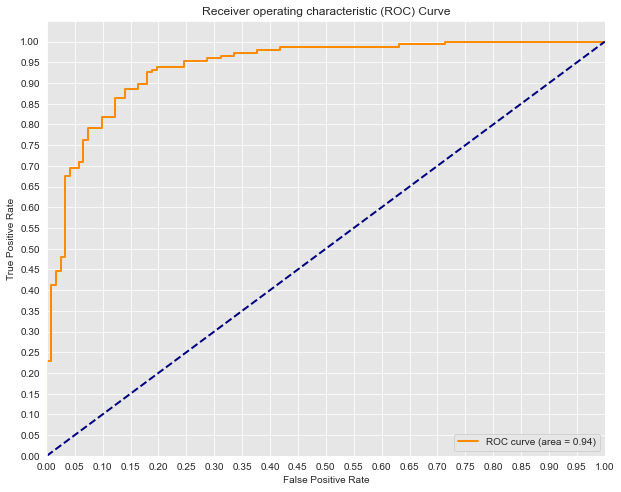

In [275]:
# Seaborn's beautiful styling
sns.set_style('darkgrid', {'axes.facecolor': '0.9'})

print('AUC: {}'.format(auc(fpr4, tpr4)))

plt.figure(figsize=(10, 8))

lw = 2
#plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve')
plt.plot(fpr4, tpr4, color='darkorange', lw = lw, label = 'ROC curve (area = %0.2f)' % roc_auc4)

plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.yticks([i/20.0 for i in range(21)])
plt.xticks([i/20.0 for i in range(21)])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic (ROC) Curve')

plt.legend(loc='lower right')
#plt.show()

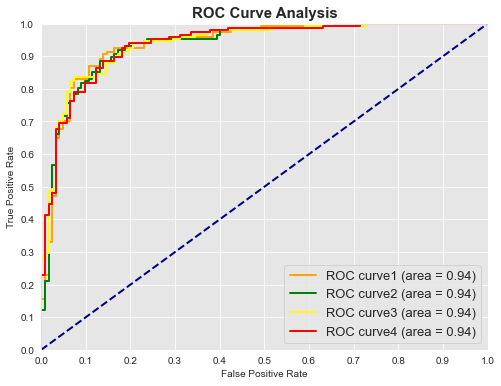

In [276]:
fig = plt.figure(figsize=(8,6))

lw = 2
plt.plot(fpr1, tpr1, color='orange', lw = lw, label = 'ROC curve1 (area = %0.2f)' % roc_auc1)

lw = 2
plt.plot(fpr2, tpr2, color='green', lw = lw, label = 'ROC curve2 (area = %0.2f)' % roc_auc2)

lw = 2
plt.plot(fpr3, tpr3, color='yellow', lw = lw, label = 'ROC curve3 (area = %0.2f)' % roc_auc3)

lw = 2
plt.plot(fpr4, tpr4, color='red', lw = lw, label = 'ROC curve4 (area = %0.2f)' % roc_auc3)

plt.plot([0, 1], [0, 1], color = 'navy', lw = lw, linestyle = '--')   # PK: Diagonal line in navy
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel('False Positive Rate')

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel('True Positive Rate')

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

Confusion Matrix

In [279]:
y_pred = st_clf.predict(X_test_ss_transformed)

In [280]:
tp = ((y_test == 1) & (y_test == y_pred)).sum() 
tn = ((y_test == 0) & (y_test == y_pred)).sum()  
fp = ((y_test == 0) & (y_test != y_pred)).sum()
fn = ((y_test == 1) & (y_test != y_pred)).sum()

In [281]:
pd.DataFrame(confusion_matrix(y_test, y_pred), columns=["Predict Normal", "Predict Heart Disease",],
             index=["True Normal", "True Heart Disease"])

,Predict Normal,Predict Heart Disease
True Normal,103,19
True Heart Disease,17,131


C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


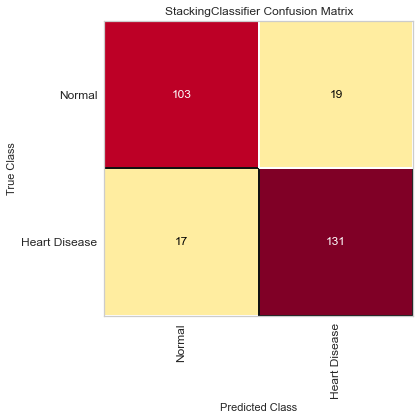

<AxesSubplot:title={'center':'StackingClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [282]:
from yellowbrick.classifier import ConfusionMatrix

mapping = {0: "Normal", 1: "Heart Disease"} 

fig, ax = plt.subplots(figsize=(6, 6)) 

cm_viz = ConfusionMatrix(st_clf, classes=["Normal", "Heart Disease"], label_encoder = mapping)

cm_viz.score(X_test_ss_transformed, y_test) 

cm_viz.poof()

Accuracy

In [ ]:
# Accuracy is the percentage of correct classifications

In [283]:
(tp + tn) / (tp + tn + fp + fn)

0.8666666666666667

In [284]:
accuracy_score(y_test, y_pred)

0.8666666666666667

Recall

In [ ]:
# Recall (also called sensitivity) is the percentage of positive val‐ ues correctly classified. 
# (How many relevant results are returned?)

In [285]:
tp / (tp + fn) 

0.8851351351351351

In [286]:
recall_score(y_test, y_pred)

0.8851351351351351

Precision

In [ ]:
# Precision is the percent of positive predictions that were correct (TP divided by (TP + FP)). 
# (How relevant are the results?)

In [287]:
tp / (tp + fp)

0.8733333333333333

In [288]:
precision_score(y_test, y_pred)

0.8733333333333333

F1

In [ ]:
# F1 is the harmonic mean of recall and precision

In [289]:
pre = tp / (tp + fp) 
rec = tp / (tp + fn)

(2 * pre * rec) / (pre + rec) 

0.8791946308724832

In [290]:
f1_score(y_test, y_pred)

0.8791946308724832

Classification Report

In [ ]:
# Yellowbrick has a classification report showing precision, recall, and f1 scores for both positive and negative values

C:\Users\Peter\anaconda3\envs\pete1\lib\site-packages\yellowbrick\classifier\base.py:232: YellowbrickWarning: could not determine class_counts_ from previously fitted classifier
  warnings.warn(


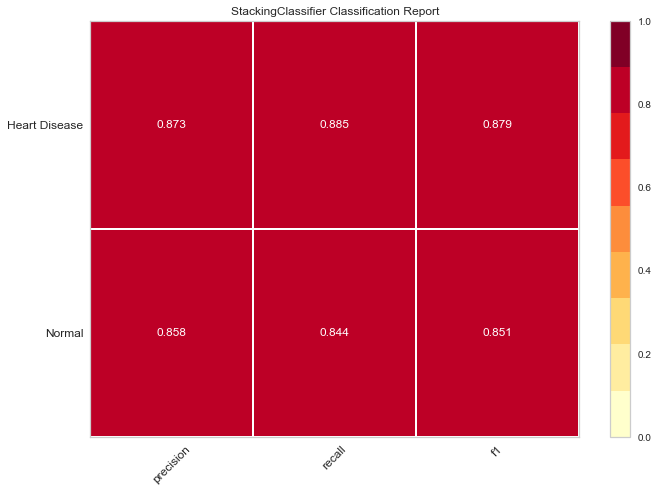

<AxesSubplot:title={'center':'StackingClassifier Classification Report'}>

In [291]:
from yellowbrick.classifier import ClassificationReport

fig, ax = plt.subplots(figsize = (10, 7)) 

cm_viz = ClassificationReport(st_clf, classes=["Normal", "Heart Disease"], label_encoder = mapping)
 
cm_viz.score(X_test_ss_transformed, y_test) 

cm_viz.poof()

Precision-Recall Curve

In [72]:
from sklearn.metrics import average_precision_score

average_precision_score(y_test, y_pred)

0.8203763851589388

0.9242054639172237


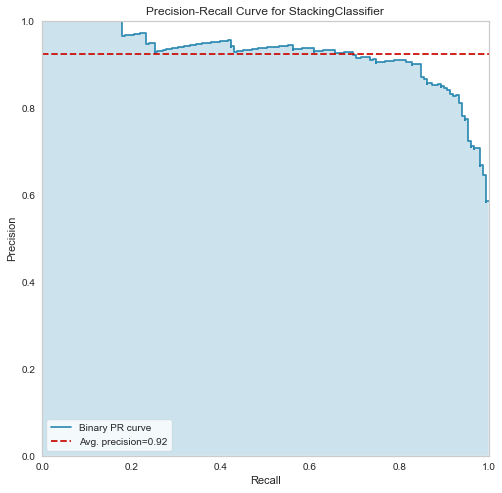

<AxesSubplot:title={'center':'Precision-Recall Curve for StackingClassifier'}, xlabel='Recall', ylabel='Precision'>

In [73]:
from yellowbrick.classifier import PrecisionRecallCurve

fig, ax = plt.subplots(figsize=(8, 8)) 

viz = PrecisionRecallCurve(st_clf)

viz.fit(X_train_ss_transformed, y_train)

print(viz.score(X_test_ss_transformed, y_test)) 

viz.poof()

In [ ]:
# Case 2

Split the Data

In [255]:
type(X_pca_reduced)

numpy.ndarray

In [256]:
X_pca_reduced.shape

(899, 4)

In [257]:
type(y)

pandas.core.series.Series

In [258]:
y_var = y.values    # dependent variable, 'blood_doner'

print(cl('Y variable samples :\n {}'.format(y_var[:5]), attrs = ['bold']))

Y variable samples :
 [0 1 0 1 0]


In [259]:
type(y_var)

numpy.ndarray

In [260]:
X_train, X_test, y_train, y_test = train_test_split(X_pca_reduced, y_var, test_size=0.3, random_state=42, 
                                                    stratify = y_var)   

In [261]:
print(cl('X_train shape : {}'.format(X_train.shape), attrs = ['bold'], color = 'blue'))
print(cl('X_test shape : {}'.format(X_test.shape), attrs = ['bold'], color = 'blue'))
print(cl('y_train shape : {}'.format(y_train.shape), attrs = ['bold'], color = 'red'))
print(cl('y_test shape : {}'.format(y_test.shape), attrs = ['bold'], color = 'red'))

X_train shape : (629, 4)
X_test shape : (270, 4)
y_train shape : (629,)
y_test shape : (270,)


In [262]:
type(X_train)

numpy.ndarray

In [263]:
type(y_train)

numpy.ndarray

In [264]:
# StandardScaler

from sklearn.preprocessing import StandardScaler

In [265]:
ss = StandardScaler()

In [266]:
X_train_ss_transformed = ss.fit_transform(X_train)

In [267]:
X_test_ss_transformed = ss.transform(X_test)

In [268]:
X_train_ss_transformed[:1]

array([[-1.94021885,  1.08863471, -0.88547838, -0.66646307]])

In [269]:
X_test_ss_transformed[:1]

array([[-1.92378839, -0.29107847, -1.2106932 , -1.9550075 ]])

In [164]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    
    return models

In [165]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

Verify and Evaluate the Training Model

>lr 0.705 (0.044)
>knn 0.687 (0.053)
>cart 0.623 (0.060)
>svm 0.720 (0.044)
>bayes 0.708 (0.054)
>rf 0.688 (0.040)


{'whiskers': [<matplotlib.lines.Line2D at 0x2313ce8bcd0>,
 'caps': [<matplotlib.lines.Line2D at 0x2313ce9a190>,
 'boxes': [<matplotlib.lines.Line2D at 0x2313ce8ba00>,
 'medians': [<matplotlib.lines.Line2D at 0x2313ce9a730>,
 'fliers': [<matplotlib.lines.Line2D at 0x2313ce9acd0>,
 'means': [<matplotlib.lines.Line2D at 0x2313ce9aa00>,
  <matplotlib.lines.Line2D at 0x2313c9f9df0>]}

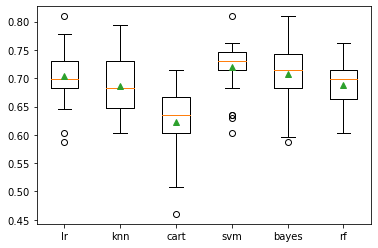

In [166]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [167]:
# get a stacking ensemble of models
def get_stacking():
    
    # define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    level0.append(('rf', RandomForestClassifier()))
    
    # define meta learner model
    level1 = LogisticRegression()
    
    # define the stacking ensemble
    st_clf = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    
    return st_clf

In [168]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['stacking'] = get_stacking()
        
    return models

In [169]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

>lr 0.705 (0.044)
>knn 0.687 (0.053)
>cart 0.625 (0.056)
>svm 0.720 (0.044)
>bayes 0.708 (0.054)
>rf 0.689 (0.049)
>stacking 0.721 (0.043)


{'whiskers': [<matplotlib.lines.Line2D at 0x2313cfaf820>,
 'caps': [<matplotlib.lines.Line2D at 0x2313cfafdc0>,
 'boxes': [<matplotlib.lines.Line2D at 0x2313cfaf670>,
 'medians': [<matplotlib.lines.Line2D at 0x2313cfbe3a0>,
 'fliers': [<matplotlib.lines.Line2D at 0x2313cfbe940>,
 'means': [<matplotlib.lines.Line2D at 0x2313cfbe670>,
  <matplotlib.lines.Line2D at 0x2313cf23df0>]}

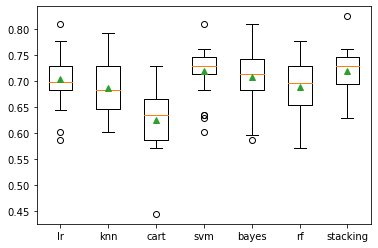

In [170]:
# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [ ]:
# Common factors

In [270]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    
    return models

In [271]:
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

In [ ]:
# Common factors

Verify and Evaluate the Training Model

>lr 0.688 (0.045)
>knn 0.655 (0.053)
>cart 0.636 (0.057)
>svm 0.718 (0.043)
>bayes 0.698 (0.036)
>rf 0.706 (0.064)
>xgb 0.667 (0.055)
>lgb 0.682 (0.043)


{'whiskers': [<matplotlib.lines.Line2D at 0x23adcdf4a30>,
 'caps': [<matplotlib.lines.Line2D at 0x23adcdf4eb0>,
 'boxes': [<matplotlib.lines.Line2D at 0x23adcdf4760>,
 'medians': [<matplotlib.lines.Line2D at 0x23adce05490>,
 'fliers': [<matplotlib.lines.Line2D at 0x23adce05a30>,
 'means': [<matplotlib.lines.Line2D at 0x23adce05760>,
  <matplotlib.lines.Line2D at 0x23add5ec1c0>]}

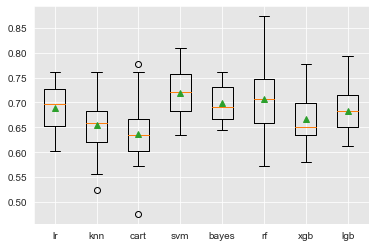

In [272]:
# Test 2

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()

for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
    
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()

In [ ]:
# Common factors

In [273]:
# get a stacking ensemble of models
def get_stacking():
    
    # define the base models
    level0 = list()
    level0.append(('lr', LogisticRegression()))
    level0.append(('knn', KNeighborsClassifier()))
    level0.append(('cart', DecisionTreeClassifier()))
    level0.append(('svm', SVC()))
    level0.append(('bayes', GaussianNB()))
    level0.append(('rf', RandomForestClassifier()))
    level0.append(('xgb', XGBClassifier()))
    level0.append(('lgb', LGBMClassifier()))
        
    # define meta learner model
    level1 = LogisticRegression()
    
    # define the stacking ensemble
    st_clf = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    
    return st_clf

In [274]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    models['svm'] = SVC()
    models['bayes'] = GaussianNB()
    models['rf'] = RandomForestClassifier()
    models['xgb'] = XGBClassifier()
    models['lgb'] = LGBMClassifier()
    models['stacking'] = get_stacking()
            
    return models

In [275]:
# evaluate a give model using cross-validation
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    
    return scores

In [ ]:
# Common factors

>lr 0.688 (0.045)
>knn 0.655 (0.053)
>cart 0.632 (0.053)
>svm 0.718 (0.043)
>bayes 0.698 (0.036)
>rf 0.694 (0.055)
>xgb 0.667 (0.055)
>lgb 0.682 (0.043)
>stacking 0.702 (0.043)


{'whiskers': [<matplotlib.lines.Line2D at 0x23add691a30>,
 'caps': [<matplotlib.lines.Line2D at 0x23add691eb0>,
 'boxes': [<matplotlib.lines.Line2D at 0x23add691760>,
 'medians': [<matplotlib.lines.Line2D at 0x23add69e490>,
 'fliers': [<matplotlib.lines.Line2D at 0x23add69ea30>,
 'means': [<matplotlib.lines.Line2D at 0x23add69e760>,
  <matplotlib.lines.Line2D at 0x23add700ca0>]}

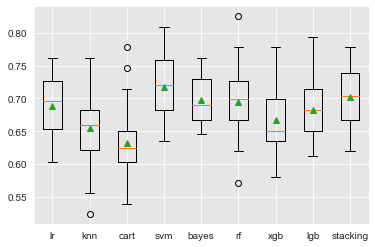

In [276]:
# Test 2 - Best performance

# get the models to evaluate
models = get_models()

# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train_ss_transformed, y_train)
    
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))

# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)

#pyplot.show()